# <div align="center">   **AI Lab project**

<p align = center> Group 7
<p align = 'center'><font size ="2"> Agnese Adorante (3158575) | Martina Del Gaudio (3174092) | Tommaso Giacomello (3173616) | Kristian Gjika (3116656) | Clara Montemurro (3179680) <p>

## Introduction

### Cancer and Genomic research

Tumour development is a complex and multi-stage process in which healthy cells evolve into malignant tumours through a series of gene mutations and accumulation in cells, leading every broad cancer type to differentiate into several sub-types. By repeated proliferation and division processes, important gene mutations in tissues result in changes in cell phenotypes and cause the tumour cells to evolve depending on their microenvironments.

Therefore, each person’s genomic profile is strongly correlated with the genetic mutations of cancer tissues, and this makes tumour heterogeneity the main reason why cancer remains an enormous challenge in medical research and clinical treatment.

### Hypoxia and its role in cancer recognition

One of the main features of tumour’s microenvironment is a condition of hypoxia (a low availability of oxygen), due to an increased consumption and an impaired delivery of oxygen. While hypoxia is lethal for many cells, tumour cells are able to not only alter their metabolism to adapt to hypoxic conditions, but also become resistant to chemo/radiotherapy. It was also demonstrated that hypoxic cells, surviving in a state of apoptosis, become more aggressive and invasive, have a better ability to metastasize and are correlated with poor prognosis of cancer patients.

### Target of this research

The strong dependence between each individual’s DNA and tumour genetic expression in the cells makes Single-cell RNA sequencing (a technology that analyzes transcriptomes of complex tissues at single-cell levels) crucial for a clearer understanding of the molecular mechanisms involved in tumour occurrence (e.g. reveal key gene mutations and differential gene expression).

So, given two scRNA techniques (Smart-Sequencing and Drop-Sequencing) used to sequence some cells grown in different cell lines, our purpose aims to train a good predictor capable of recognizing whether a cell lives in a condition of hypoxia (on average 1%) or normoxia (usually set around 20% in laboratory settings).

From an enlarged knowledge of Hypoxic cells, we will then be able to trace back to the genes that appear to be responsible for genetic mutations

## Preamble

###  Overview over data

Our dataset provides information about two cell lines, called HCC1086 (derived from a human breast cancer patient) and MCF7 (also a human breast cancer cell line, characterized by high expression of estrogen and progesterone receptor).

We can quickly outline the attributes of the provided cell lines through the material provided by the Metadata.tsv files: we observe that in both cases, the cell lines are either grown in conditions of hypoxia or normoxia, and they are sequenced after 24 hours (for HCC1806) or 72 hours (for MCF7). Also, the position and the plate/lane are given, and the cell line's filenames summarize their features.

### Steps of our analysis

Firstly, we will analyze the data corresponding to HCC1806\_SmartS\_Unfiltered and try to build a suitable model:

* Exploratory Data Analysis
* Data Cleaning and Quality Control
* Normalisation and Scaling
* Unsupervised Learning
* Model Training

Then we will perform feature selection and fit the best model on the following datasets: 

* HCC1806\_SmartS\_Filtered\_Normalised\_3000_Data_train
* MCF7\_SmartS\_Filtered\_Normalised\_3000_Data_train
* HCC1806\_DropS\_Filtered\_Normalised\_3000_Data_train
* MCF7\_DropS\_Filtered\_Normalised\_3000_Data_train


## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt             #visualisation
import seaborn as sns   #visualisation

import matplotlib.patches as mpatches
import collections
from sklearn.ensemble import IsolationForest
from scipy.stats import kurtosis, skew, norm, probplot
import pylab
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from pandas.plotting import scatter_matrix
import matplotlib.ticker as ticker
from scipy.optimize import curve_fit

from scipy.stats import mannwhitneyu
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler
from sklearn.cluster import AgglomerativeClustering

from scipy import stats
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score

#Libraries
from sklearn.utils.fixes import loguniform
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import classification_report, confusion_matrix  

from sklearn import svm
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import mean_squared_error
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multiclass import OneVsOneClassifier

from itertools import cycle
from sklearn.metrics import PrecisionRecallDisplay

from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

from sklearn.base import BaseEstimator, TransformerMixin
# Use label_binarize to be multi-label like settings

from sklearn.preprocessing import LabelBinarizer

from sklearn.model_selection import cross_val_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics

from sklearn.metrics import RocCurveDisplay
from sklearn.tree import plot_tree
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LogisticRegression

import scanpy as sc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow import keras
from scikeras.wrappers import KerasClassifier

import warnings
warnings.filterwarnings("ignore")

##  Analysis of HCC1806_SmartS_Unfiltered

### Data Exploration

In [3]:
H_Smart_unfil = pd.read_csv("HCC1806_SmartS_Unfiltered_Data.txt",delimiter="\ ",engine='python',index_col=0)
H_Smart_metadata= pd.read_csv("HCC1806_SmartS_MetaData.tsv", delimiter = "\t", engine = "python", index_col = 0)

**A QUICK INSIGHT:**

As previously mentioned, the Metadata file reveals useful attributes (in the columns) about the cell lines (rows of the dataframe):

In [6]:
H_Smart_metadata.head()

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [7]:
H_Smart_metadata
print("Dataset dimension:", np.shape(H_Smart_metadata))

# Number of cells with the same plate

plates= collections.Counter(H_Smart_metadata['PCR Plate'])
print('\n')
for x in sorted(plates):
    print(f'nr of cells in plate {x}: ', plates[x])
print('\n')

# Checking cells with different Conditio

cond= collections.Counter(H_Smart_metadata['Condition'])
for x in cond:
    print(f'nr of {x} cells: ', cond[x])

print('\n')
h= collections.Counter(H_Smart_metadata['Hours'])
for x in h:
    print(f'nr of cells that are in the cell line for {x} hours: ', h[x])

# Making the dataset readable
    
print('\nA more readable dataframe:')

# change filename into cell_name
HS_metadata= H_Smart_metadata.copy()
HS_metadata.set_index('Cell name', inplace=True)
HS_metadata.drop(['Pos', 'PreprocessingTag', 'ProcessingComments'], axis=1, inplace=True)
HS_metadata


Dataset dimension: (243, 8)


nr of cells in plate 1:  64
nr of cells in plate 2:  63
nr of cells in plate 3:  68
nr of cells in plate 4:  48


nr of Normo cells:  117
nr of Hypo cells:  126


nr of cells that are in the cell line for 24 hours:  243

A more readable dataframe:


,Cell Line,PCR Plate,Condition,Hours
Cell name,,,,
S123,HCC1806,1,Normo,24
S26,HCC1806,1,Normo,24
S97,HCC1806,1,Hypo,24
S104,HCC1806,1,Hypo,24
S4,HCC1806,1,Hypo,24
...,...,...,...,...
S210,HCC1806,4,Normo,24
S214,HCC1806,4,Normo,24
S199,HCC1806,4,Hypo,24


We are dealing with 243 cell lines, collected and processed in four different plates for a duration of 24 hours.
Also, the Metadata file reveals us the conditions of the cell lines, which will be addressed as the target variables in the core section of our analysis. Before delving into specifics, it is possible to notice that our research is about a binary classification problem where the two labels, 'Hypo' and 'Normo', have a balanced distribution in this dataset.

In [8]:
label= HS_metadata['Condition'].copy()
label

Cell name
S123    Normo
S26     Normo
S97      Hypo
S104     Hypo
S4       Hypo
        ...  
S210    Normo
S214    Normo
S199     Hypo
S205    Normo
S236    Normo
Name: Condition, Length: 243, dtype: object

**OUR RAW DATA:**

The upcoming dataset, denoted as *H_Smart_Unfil*, is structured with cell lines as the columns and genes as the rows. The values within the table correspond to the raw read counts of the genes expressed by each cell.

It is essential to analyze the unfiltered dataset in order to capture the original gene expression profiles without any preprocessing or filtering steps applied. By working with the raw data, we can account for the inherent variability and nuances present in the gene expression measurements and can gain valuable insights about our research problem. This analysis serves as a crucial foundation for subsequent modeling steps and aids in identifying the key attributes, assessing the distribution of gene expression across cells, detecting correlationsbetween genes and cell lines, and exploring other relevant characteristics necessary for developing robust models and drawing meaningful conclusions.




We start by inspecting its main features:

In [9]:
H_Smart_unfil.head()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
"""OR4F29""",2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
# Let us make it more readable before going deep into it

def name_clean(data):
    
    # Rename columns and rows in H_Smart_Unfil to remove double quotes
    data = data.rename(columns=lambda x: x.strip('"'), index=lambda x: x.strip('"'))

    column_names = data.columns

    # Define a regular expression pattern to match "S" followed by 1 to 3 digits
    pattern = r'(S\d{1,3})'

    # Extract the "SXXX" part from the column names
    extracted_names = column_names.str.extract(pattern, expand=False)

    # Replace the original column names with the extracted names
    data.columns = extracted_names
    return data
  
H_Smart_unfil = name_clean(H_Smart_unfil)
H_Smart_unfil

H_Smart_metadata= name_clean(H_Smart_metadata.T).T
H_Smart_unfil

,S123,S26,S97,S104,S4,S8,S108,S11,S113,S119,...,S243,S193,S198,S232,S204,S210,S214,S199,S205,S236
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,22,43,0,0,0,3,47,4,2,8,...,24,15,15,4,4,26,1,4,4,20
MT-CYB,4208,6491,25,4819,310,695,2885,1552,366,1829,...,1119,1429,808,999,916,3719,984,2256,981,2039
MT-TT,26,62,0,11,4,0,41,9,2,8,...,48,31,3,8,5,42,1,15,6,34
MT-TP,66,71,1,3,9,14,91,22,3,30,...,119,52,11,22,15,48,18,36,8,79


In [11]:
print('Dimension of the dataset: ', H_Smart_unfil.shape)
n_rows= H_Smart_unfil.shape[0]
n_col= H_Smart_unfil.shape[1]
print('Number of rows:', n_rows, '\nNumber of columns:', n_col)

Dimension of the dataset:  (23396, 243)
Number of rows: 23396 
Number of columns: 243


Continuing our analysis, we proceed to investigate two important features of the dataset: the presence of non-numeric elements and the occurrence of cells that do not express any genes.

In [12]:
if len(H_Smart_unfil.dtypes[H_Smart_unfil.dtypes == 'int64']) == n_col:
    print('All entries are integer numbers')

def empty_cols(df):
    nulldf=[]
    for col in df.columns:
        if df[col].sum()==0:
            nulldf.append(col)
    return nulldf
print('Empty columns:', empty_cols(H_Smart_unfil))
print(f'Empty rows: {empty_cols(H_Smart_unfil.T)}')

All entries are integer numbers
Empty columns: []
Empty rows: []


Having assessed the absence of non-numeric elements and of cells lacking gene expression, we now proceed with visualizing the dataset using various plots to gain further insights and infer additional properties such as the overall distribution of gene expression values or the presence of of outlier cells or genes. In particular, we aim to investigate the degree of **sparsity** present in the dataset.

In the context of gene expression datasets, sparsity refers to the prevalence of zero or low expression values across the dataset, which can be visualized by identifying regions where the expression levels are consistently low or zero.

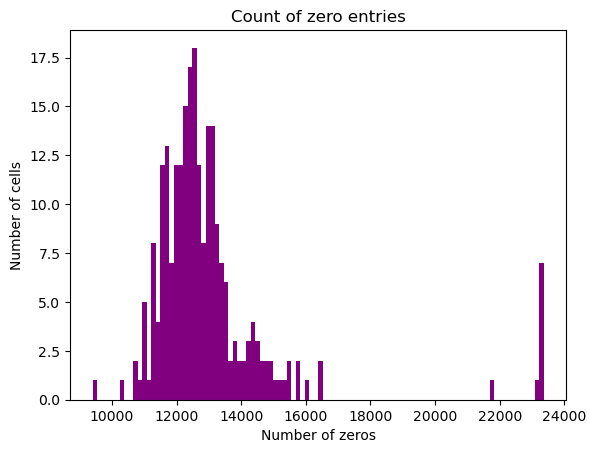

In [17]:
# Number of zeros for each cells
zeros = pd.Series(np.zeros(len(H_Smart_unfil.columns)), index = H_Smart_unfil.columns)

for col in H_Smart_unfil.columns:
    counter = 0
    for i in H_Smart_unfil[col]:
        if i == 0:
            counter += 1
    zeros[col] = counter
    
plt.hist(zeros, bins = 100, color = 'purple')
plt.title('Count of zero entries')
plt.xlabel('Number of zeros')
plt.ylabel('Number of cells')
plt.show()

This dataset exhibits a high degree of sparsity, as evidenced by the fact that a significant proportion of cells have a count of zeros within the range of 11000 to 13000. This range corresponds to nearly half of the total number of genes present in the dataset.

Interpreting this observation, we can conclude that the dataset displays a low expression rate for the genes.
Zero measurement in scRNA-seq data have two sources: biological and non-biological.

While biological zeros carry meaningful information about cell states, non-biological zeros represent missing values artifcially introduced during the generation of scRNA-seq data.

Since we are unable to make conjectures about the previous data collection, we can assume (?) that the prevalence of biological zeros indicates that a large portion of genes remains inactive or has minimal involvement in the biological processes under investigation.

This finding suggests that only a subset of genes actively participates in gene expression, while the majority remains relatively silent or unexpresses, and guide further ananlyses and investigations to unravel the functional significance and potential interactions among the expressed genes.

**Some descriptive statistics:**

In [18]:
H_Smart_unfil.describe()

,S123,S26,S97,S104,S4,S8,S108,S11,S113,S119,...,S243,S193,S198,S232,S204,S210,S214,S199,S205,S236
count,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,...,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000
mean,99.565695,207.678278,9.694734,150.689007,35.700504,47.088434,152.799453,135.869422,38.363908,45.512139,...,76.361771,105.566593,54.026116,29.763806,28.905411,104.740725,35.181569,108.197940,37.279962,76.303855
std,529.532443,981.107905,65.546050,976.936548,205.885369,545.367706,864.974182,870.729740,265.062493,366.704721,...,346.659348,536.881574,344.068304,186.721266,135.474736,444.773045,170.872090,589.082268,181.398951,369.090274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000
75%,51.000000,125.000000,5.000000,40.000000,22.000000,17.000000,81.000000,76.000000,22.000000,18.000000,...,56.000000,67.000000,29.000000,18.000000,19.000000,76.000000,24.000000,68.000000,22.000000,44.000000
max,35477.000000,69068.000000,6351.000000,70206.000000,17326.000000,47442.000000,43081.000000,62813.000000,30240.000000,35450.000000,...,19629.000000,30987.000000,21894.000000,13457.000000,11488.000000,33462.000000,15403.000000,34478.000000,10921.000000,28532.000000


We immediately notice high fluctuations in the mean and standard deviation of this dataset.

This evident volatility can raise questions about the heterogeneity of the data, as it could reflect the presence of different subgroups or clusters within the dataset, or may suggest that outliers or extreme values in the dataset have a significant impact on the summary statistics.\
It might also indicate issues such as data quality problems, measurement errors, or changing data collection methods.

It is possible to visualize the latter information by using **violin plots**.

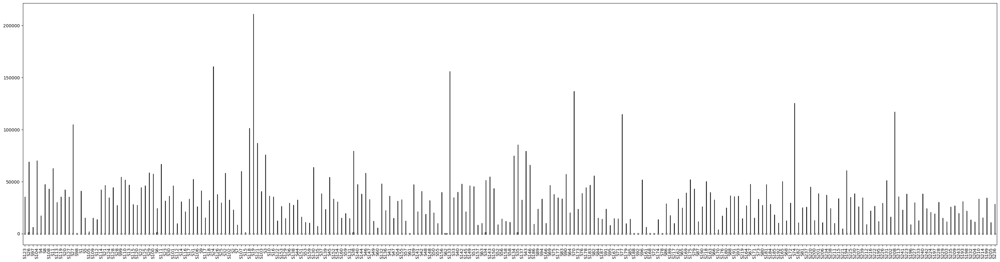

In [25]:
plt.figure(figsize=(40,10))
sns.violinplot(data= H_Smart_unfil, color = 'purple',cut=0)
plt.setp(plt.gca().get_xticklabels(), rotation= 90)
plt.show()

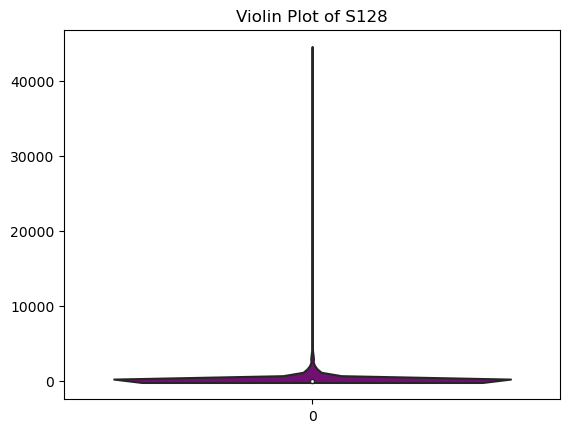

In [23]:
random_cell = np.random.randint(243)
sns.violinplot(H_Smart_unfil.iloc[:,random_cell], color = 'purple')
plt.title(f'Violin Plot of {H_Smart_unfil.columns[random_cell]}');

The violin plots effectively combine the information provided by a box plot and a rotated kernel density plot on each side. They depict the distribution of the data, particularly highlighting the density and symmetry of the values, while the width of the violin at a specific point indicates the probability density of the data at that point. Thus, a wider section indicates a higher concentration of values, while a narrower section suggests a lower concentration.

In this visual representation, the violin plot reveals that the distribution has a notable peak at zero, indicating a higher frequency of data points with this value, confirming our previous observation regarding the sparsity of the dataset.

We now turn our attention to exploring the gene expression patterns within the dataset.
In this way, we can gain a deeper understanding of how genes are expressed and potentially identify patterns or relationships between samples.
We will explore three metrics, that will turn out to be crucial in the 'Data Cleaning' section of the analysis: __Count Depth__, __UMI counts__ and the __Fraction of Mitochondrial genes__.

- The __Count-Depth__ metric refers to the total number of reads (or sequencing depth) for each sample or observation. A higher count-depth generally indicates a more comprehensive and reliable dataset, as it implies a greater coverage of gene expression.


- The __UMI__ (Unique Molecular Identifier) count is a measure of the unique molecules captured in each sample. A high UMI count provides information about the diversity and complexity of the dataset, as it suggests a greater diversity of transcripts captured. This can be crucial when it comes to capturing rare or lowly expressed genes, and may be an indicator of inefficient data collection.


- The __Mitochondrial Ratio__ is a measure of the proportion of gene expression originating from mitochondrial genes compared to the total gene expression. Monitoring this metric is important, especially in studies involving single-cell RNA sequencing, as it helps identfy or compromised cells, since elevated mitochondrial ratios are typically more abundand in damaged or dying cells.

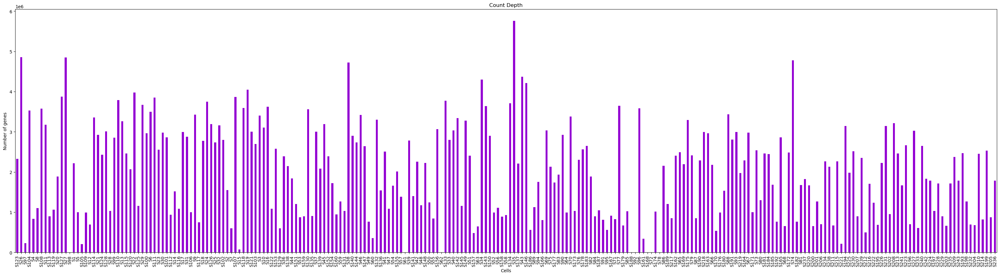

In [29]:
# Count depth is the total number of counts per cells
plt.figure(figsize = (40, 10))
H_Smart_unfil.sum().plot(kind = 'bar', color = 'darkviolet')
plt.title('Count Depth')
plt.xlabel('Cells')
plt.ylabel('Number of genes')
plt.show()

In this case, the count-depth appears unsatisfying for the purpose of our analysis, as the total number of reads significantly oscillates through the cells in the dataset.

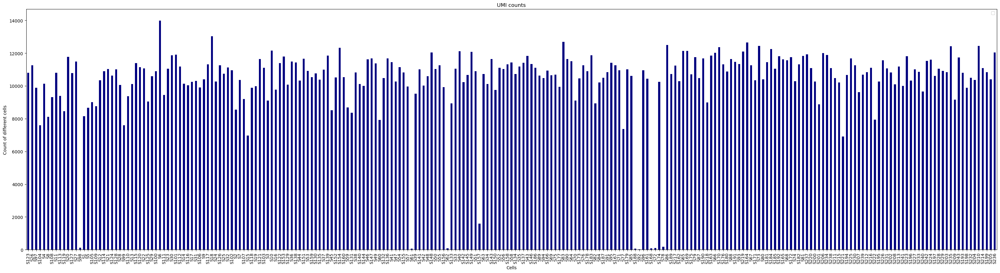

In [28]:
# UMI counts is the number of different genes in the dataset
UMI = {}
for x in H_Smart_unfil.columns:
    UMI[f'{x}'] = 0
for x in H_Smart_unfil.columns:
    temp = H_Smart_unfil[x][H_Smart_unfil[x] != 0]
    UMI[f'{x}'] = len(temp)
UMI_df = pd.Series(UMI)
plt.figure(figsize = (40, 10))
UMI_df.plot(kind = 'bar', color='navy')
plt.title('UMI counts')
plt.xlabel('Cells')
plt.ylabel('Count of different cells')
plt.gca().legend([]) 
plt.show()

We can interpret this plot by inferring that the UMI count appears sufficiently uniform, exception made for some cells which exhibit surprisingly low UMI counts. This suggests that some operations in the cleaning steps of our analysis will be performed in order to make this dataset more amenable.

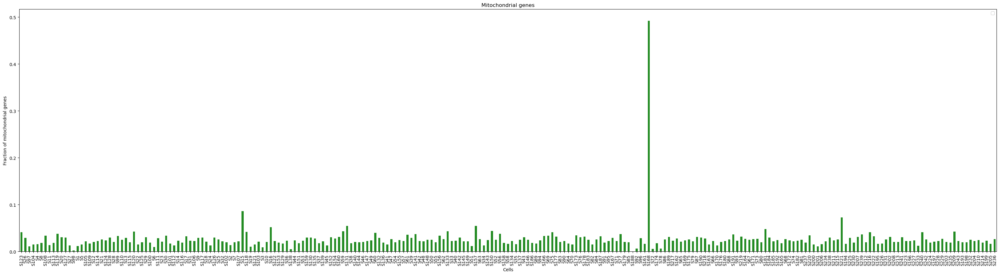

In [27]:
# Fraction of mitocondrial genes is the ratio of the total number of mitocondrial genes over total genes
mt_genes = []
for i in H_Smart_unfil.index.tolist():
    if i[:2] == 'MT':
        mt_genes.append(i)
d = {}
for i in H_Smart_unfil.columns:
    counter = 0
    for j in H_Smart_unfil[i].index.tolist():
        if j in mt_genes:
            counter += H_Smart_unfil.loc[j, i]
    d[i] = counter / H_Smart_unfil[i].sum()

mt = pd.Series(d)
plt.figure(figsize = (40, 10))
mt.plot(kind = 'bar', color='forestgreen')
plt.title('Mitochondrial genes')
plt.xlabel('Cells')
plt.ylabel('Fraction of mitochondrial genes')
plt.gca().legend([]) 
plt.show()

Based on the plot, it is evident that the majority of cells exhibit low mitochondrial ratios, indicating that the contribution of mitochondrial gene expression to the overall transcriptome is relatively limited. This finding aligns with expectations, as mitochondrial genes are typically a small fraction of the total gene expression in healthy cells.

However, an exception is observed for a single cell, which exhibits a mitochondrial ratio exceeding 0.05. Since this substantially higher value suggests a potential deviation from the norm for this particular cell, we will deal with this issue in the next steps, regarding Cell Filtering and Data Cleaning.

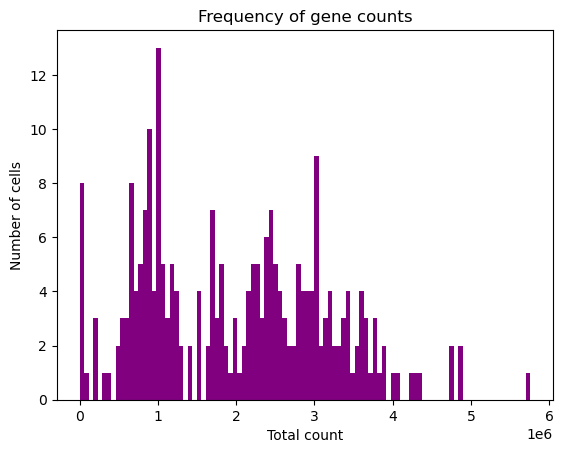

In [30]:
# Let us plot the count per cells
count= H_Smart_unfil.sum()
plt.hist(count, bins= 100, color = 'purple')
plt.xlabel('Total count')
plt.ylabel('Number of cells')
plt.title('Frequency of gene counts')
plt.show()

This plot, together with the Count-Depth barplot, provides an alternative representation for the distributions of the total count of genes across cells, bringing further evidence that the gene counts differ significantly from cell line to cell line.

__SKEWNESS__ and __KURTOSIS__

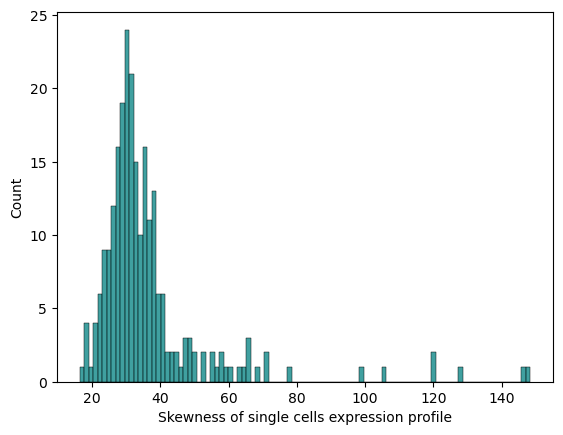

In [35]:
colN = H_Smart_unfil.shape[1]
df_skew_cells = []
for i in range(colN) :     
    v_df = H_Smart_unfil[H_Smart_unfil.columns[i]]
    df_skew_cells += [skew(v_df)]   
sns.histplot(df_skew_cells,bins=100, legend = False, color = 'teal')
plt.xlabel('Skewness of single cells expression profile')
plt.show()

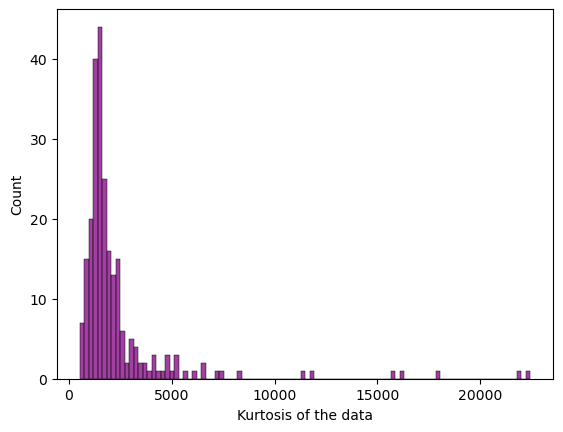

In [32]:
df_kurt_cells = []
for i in range(colN) :     
    v_df = H_Smart_unfil[H_Smart_unfil.columns[i]]
    df_kurt_cells += [kurtosis(v_df)]   
sns.histplot(df_kurt_cells,bins=100, color = 'purple')
plt.xlabel('Kurtosis of the data')
plt.show()

The skewness and kurtosis measures are commonly utlilized to assess the normality of a distribution. Skweness quantifies the symmetry of the data distribution, while kurtosis measures the thickness of the tails.

Firstly, the skewness plot indicates that the distribution of the cells is characterized by a *lack of symmetry*, specifically displaying that majority of the data is concentrated towards the right and that there is a tail on the right side.

Additionally, the kurtosis analysis reveals that all cells exhibit *positive kurtosis*. This indicates that the tails of the distribution for each cell are thicker or fatter than those of a normal distribution. A positive kurtosis may imply that the dataset contains a greater proportion of extreme values or outliers in the tails compared to a normal distribution.

Taken together, these findings suggest that the data distribution of the cells deviates significantly from a normal distribution.

**OUTLIER DETECTION**

We have already pointed out a heavy presence of outliers in our dataset, especially enhanced by the high frequency of zeros. We try to provide an immediate way to detect outliers in a dataset with boxplots; however, the large dimension of the dataset does not make boxplots a powerful instrument other than giving an insight.

Our aim is to identify outliers in samples and in features.

Outliers in samples refer to cells within the dataset that exhibit unusually high or low values compared to other cell, given expression patterns that deviate significantly from the majority of cells.

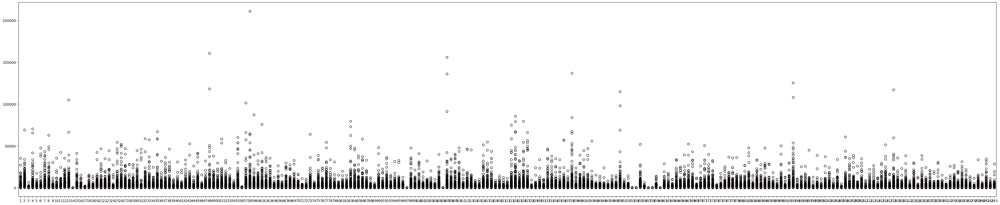

In [34]:
plt.figure(figsize=(50, 10))
plt.boxplot(H_Smart_unfil);

On the other hand, outliers in features refer to specific genes within the dataset that display exceptional expression patterns compared to other genes. We notice that this is the case of some genes that have remarkably different expression patterns.

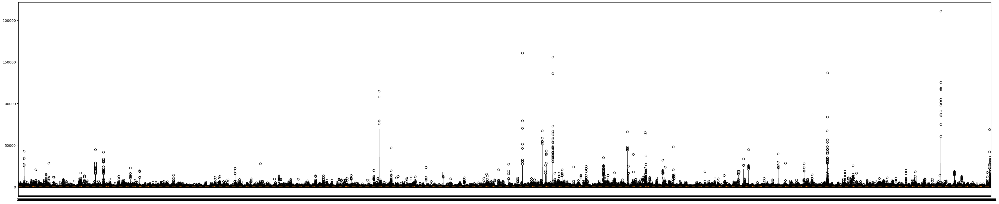

In [36]:
plt.figure(figsize=(50, 10))
plt.boxplot(H_Smart_unfil.T);

We can detect outliers and anomalies through the use of a Isolation Forest:

In [37]:
isolation_forest = IsolationForest(random_state=42)
outlier_pred = isolation_forest.fit_predict(H_Smart_unfil)
outl= H_Smart_unfil.iloc[outlier_pred==-1]
outl

,S123,S26,S97,S104,S4,S8,S108,S11,S113,S119,...,S243,S193,S198,S232,S204,S210,S214,S199,S205,S236
MTCO1P12,1740,2340,22,1020,303,587,2572,1004,443,779,...,639,790,644,386,297,961,372,1128,258,980
MTATP6P1,974,1642,8,653,91,161,1242,438,171,507,...,422,496,253,171,213,642,175,638,162,467
NOC2L,285,474,77,1987,162,0,955,648,298,9,...,581,860,156,205,360,1352,166,558,522,286
ISG15,256,897,17,919,126,247,267,530,266,121,...,146,346,180,72,42,1142,40,394,58,275
SDF4,155,376,51,436,112,311,89,426,162,112,...,375,535,100,140,95,496,41,439,328,134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND4L,6060,4281,82,1076,279,561,4615,1208,406,1418,...,1450,1393,770,495,442,1977,441,2171,451,1621
MT-ND4,17732,15624,200,6588,1028,1768,14891,4139,1738,5964,...,4121,3447,2571,1779,1395,6273,1446,7026,1201,5341
MT-ND5,3852,7457,93,1479,303,650,6533,1271,589,1574,...,1362,1993,884,746,555,2926,688,2999,611,2460
MT-ND6,900,1439,12,234,33,79,1281,250,65,331,...,310,344,163,119,53,423,114,486,75,513


Next, let us turn our attention to the study of the **correlation** between features in the dataset:

Firstly, we investigate whether the dataset contains **duplicate features**:

In [38]:
dup_cols = H_Smart_unfil.T[H_Smart_unfil.T.duplicated(keep=False)]
if dup_cols.shape[0] > 0:
    print(f"There are {dup_cols.shape[0]} duplicate columns:\n\n{dup_cols}")
else:
    print("No duplicate columns found")

No duplicate columns found


In [39]:
dup_rows= H_Smart_unfil[H_Smart_unfil.duplicated(keep=False)]
print(f"There are {dup_rows.shape[0]} duplicate genes: \n\n{dup_rows}")

There are 89 duplicate genes: 

           S123  S26  S97  S104  S4  S8  S108  S11  S113  S119  ...  S243  \
MMP23A        0    0    0     0   0   0     0    0     0     0  ...     0   
LINC01647     0    0    0     0   0   0     0    0     0     0  ...     0   
LINC01361     0    0    0     0   0   0     0    0     0     0  ...     0   
ITGA10        0    0    0     0   0   0     0    0     0     0  ...     0   
RORC          0    0    0     0   0   0     0    0     0     0  ...     0   
...         ...  ...  ...   ...  ..  ..   ...  ...   ...   ...  ...   ...   
ENPP7         0    0    0     0   0   0     0    0     0     0  ...     0   
DTNA          0    0    0     0   0   0     0    0     0     0  ...     0   
ALPK2         0    0    0     0   0   0     0    0     0     0  ...     0   
OR7G2         0    0    0     0   0   0     0    0     0     0  ...     0   
PLVAP         0    0    0     0   0   0     0    0     0     0  ...     0   

           S193  S198  S232  S204  S210  S2

We observe that no duplicate columns were found, meaning that no two or more columns represent the same or highly similar cell lines.

On the other hand, the presence of duplicate rows implies that there exist genes with identical or highly similar expression patterns across all cell lines. This is an issue that needs to be carefully considered in our analysis, since the presence of duplicate rows can introduce noise, inflate statistical significance or obscure true biological patterns.

__CORRELATION BETWEEN GENE EXPRESSION PROFILES OF CELLS__

Number of cell lines plotted: (100, 100)


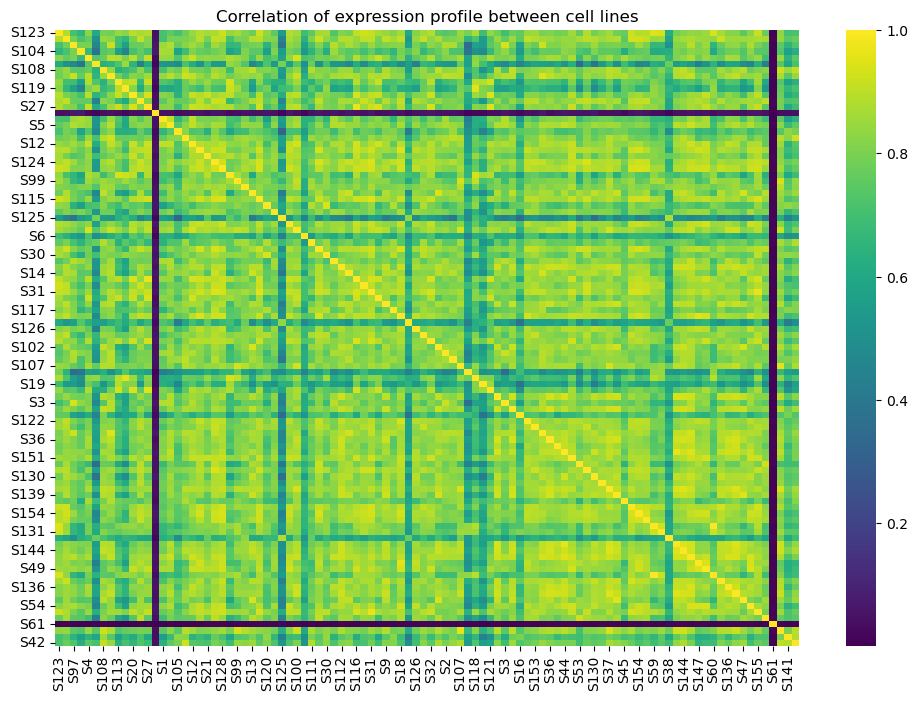

In [40]:
plt.figure(figsize = (12,8))
plt.title('Correlation of expression profile between cell lines')
sns.heatmap(H_Smart_unfil.iloc[:, :100].corr(), cmap = 'viridis', fmt ='.01f');
print(f"Number of cell lines plotted: {H_Smart_unfil.iloc[:, :100].corr().shape}")

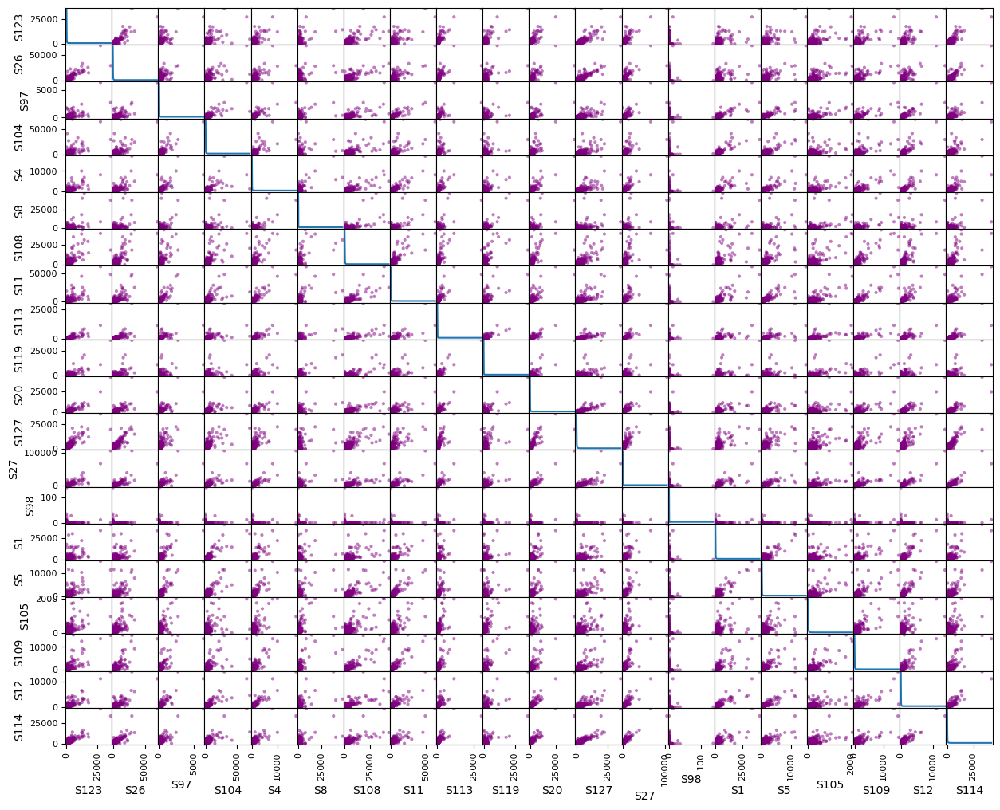

In [41]:
sm = scatter_matrix(H_Smart_unfil.iloc[:,:20], diagonal = 'kde',figsize = (15,12), color = 'purple')

Both the correlation matrix and the scatter matrix are useful tools to measure the strength and the direction of the linear relationship between pairs of cell lines.

From both plots, it is evident that the dataset exhibits a high correlation coefficient among its variables. However, this correlation may not be easily visible in the scatter plot due to the sparse nature of the dataset.

The presence of correlated data suggests the utilization of Principal Component Analysis later on in our analysis as a suitable approach for model development.

This can be seen also with a histogram, which displays how frequently high and low correlation occurs between different cell lines' expressions.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


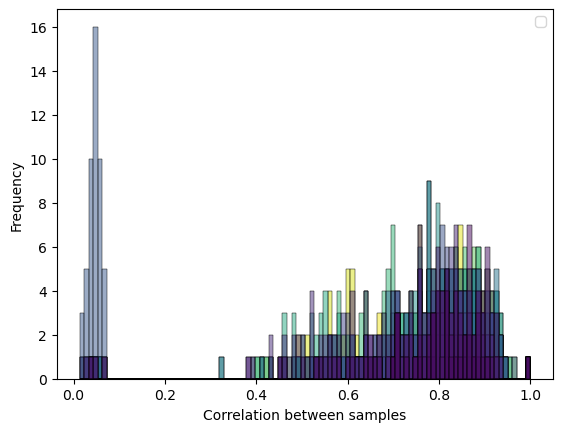

In [43]:
sns.histplot(H_Smart_unfil.iloc[:, :50].corr(), bins=100, palette = 'viridis')
plt.xlabel("Correlation between samples")
plt.ylabel("Frequency")
plt.legend(loc='upper right')
plt.show()

Considering the nature of our dataset, this result is not much surprising. Indeed, we expect cells to share part of their genomic expression due to the presence of genes that are necessary for basic cellular functions, while certain genes may be uniquely characteristic of specific cell types or conditions.

Intuitively, this means that genes with limited or no expression in normal conditions may only be activated under specific circumstances (such as different oxygen levels).

It is convenient to dig deeper into it: after setting a threshold of 0.03 on the mean correlation, we select the samples that appear to be the least correlated with the rest of the dataset and check whether they undiscover any remarkable feature:

In [44]:
unfil_c= H_Smart_unfil.corr()
non_corr= unfil_c.columns[(unfil_c.abs().mean() < 0.3)]
print(f"The mean correlation value, on average, is {unfil_c.describe().T['mean'].mean()}")
print("Correlation threshold: 0.3")
print(f"There are {len(non_corr)} cell lines with lower correlation than the threshold:\n\n{non_corr.tolist()} ")

The mean correlation value, on average, is 0.7415974004285173
Correlation threshold: 0.3
There are 9 cell lines with lower correlation than the threshold:

['S98', 'S61', 'S62', 'S157', 'S188', 'S92', 'S168', 'S72', 'S78'] 


In [45]:
H_Smart_unfil[non_corr.tolist()]

,S98,S61,S62,S157,S188,S92,S168,S72,S78
WASH7P,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,0,0
OR4F29,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
MT-TE,0,0,0,804,0,0,0,0,0
MT-CYB,0,0,0,67,0,0,0,0,0
MT-TT,0,0,0,27,0,0,0,0,0
MT-TP,0,0,0,409,0,0,0,0,0


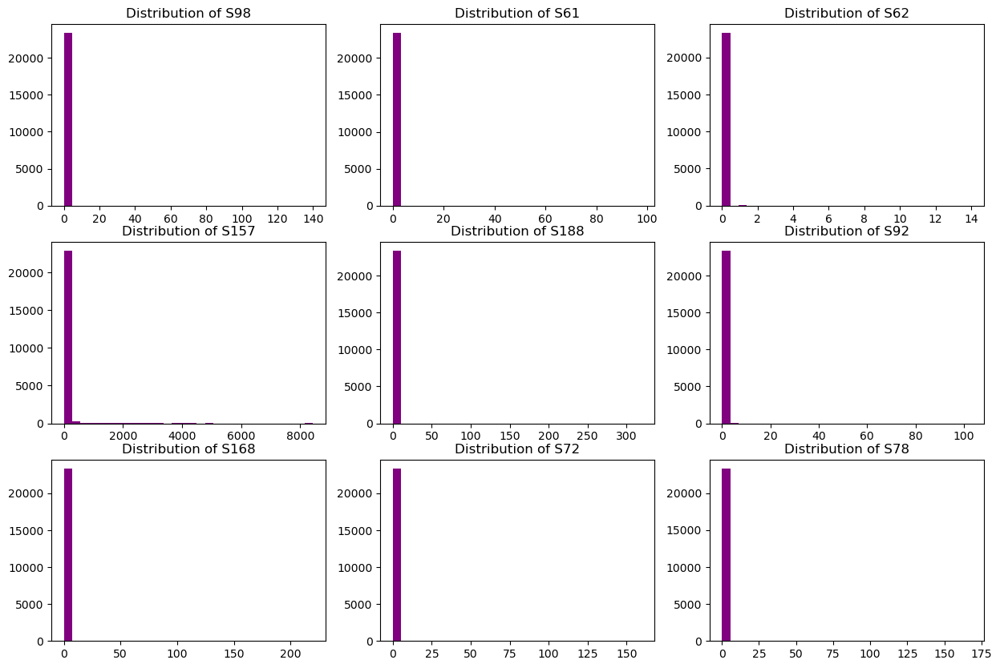

In [46]:
fig, axes= plt.subplots(3,3, figsize=(15,10))
for i, x in enumerate(non_corr.tolist()):
    ax= axes[i//3, i%3]
    ax.hist(H_Smart_unfil[x], bins=30, color = 'purple')
    ax.set_title(f"Distribution of {x}")

It is evident that all the least correlated samples have one characteristic in common: they share a high zero count and very low expression levels. This limited gene expression can result in unique or specific patterns that are distinct from other cell lines.

__CORRELATION BETWEEN THE EXPRESSION OF DIFFERENT GENES__

In the previous analysis, we focused on the comparison of the gene expression profiles of different cell lines, in order to measure the degree of similarity in their expression patterns.

Now, we analize correlation from a different perspective: we aim to examine the relationship between the expression levels of individual genes within a particular cell line, which can help us identify co-expression patterns or dependencies within the specific cell line.

Number of Genes plotted: (500, 500)


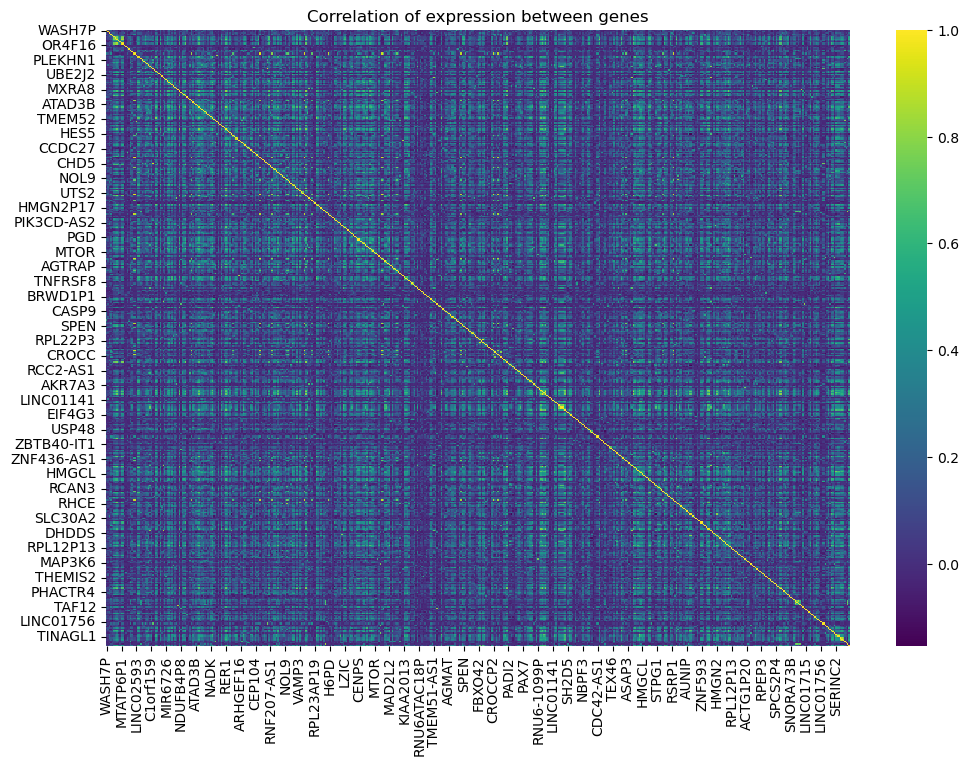

In [47]:
plt.figure(figsize = (12,8))
plt.title('Correlation of expression between genes')
sns.heatmap(H_Smart_unfil.T.iloc[:, :500].corr(), cmap = 'viridis', fmt ='.01f');
print(f"Number of Genes plotted: {H_Smart_unfil.T.iloc[:, :500].corr().shape}")

Here it is displayed a heatmap of the first 500 features' correlation matrix.

In general, we witness a weak or no linear relationship between the expression levels of the genes. This evidence can be supported by the fact that each cell line has its own unique genetic and environmental factors that contribute to gene expression, leading to cell-line specific expression patterns for different genes across the cell lines

To conclude our preliminary analysis, it is crucial to gain information about our dataset with respect to the __TARGET VARIABLES__:

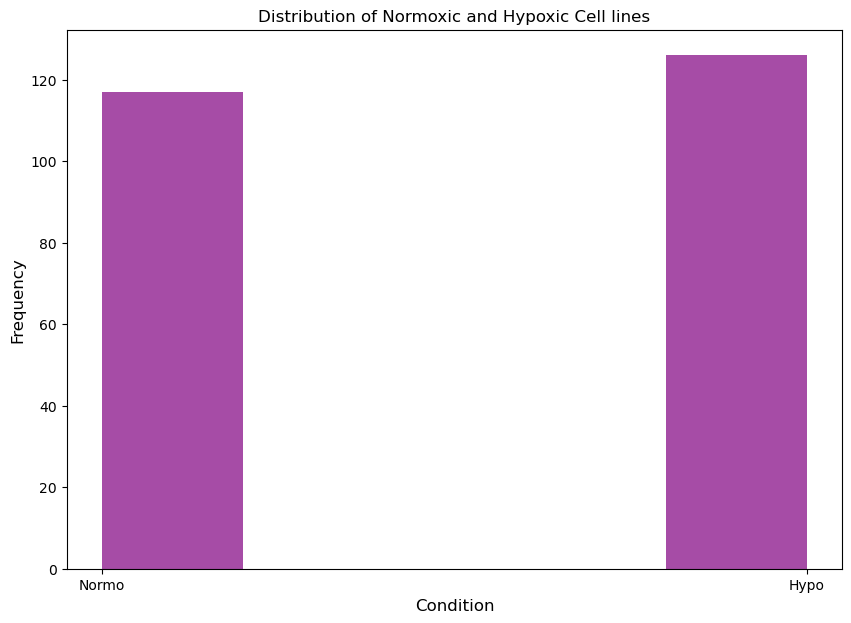

In [48]:
plt.figure(figsize=(10,7))
plt.hist(label, bins=5, color='purple', alpha=0.7);
plt.xlabel('Condition', fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Normoxic and Hypoxic Cell lines")
plt.show()

As we have noticed before, we are dealing with a __balanced__ binary classification problem.
Next, we proceed adding a row to the Data Frame to include the labels:

In [49]:
#add a row to the dataset: 'Condition'
H_Smart_unfil_complete = H_Smart_unfil.T.copy()
H_Smart_unfil_complete['Condition'] = label
H_Smart_unfil_complete = H_Smart_unfil_complete.T
H_Smart_unfil_complete

,S123,S26,S97,S104,S4,S8,S108,S11,S113,S119,...,S243,S193,S198,S232,S204,S210,S214,S199,S205,S236
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-CYB,4208,6491,25,4819,310,695,2885,1552,366,1829,...,1119,1429,808,999,916,3719,984,2256,981,2039
MT-TT,26,62,0,11,4,0,41,9,2,8,...,48,31,3,8,5,42,1,15,6,34
MT-TP,66,71,1,3,9,14,91,22,3,30,...,119,52,11,22,15,48,18,36,8,79
MAFIP,0,4,0,7,0,9,0,4,2,0,...,2,0,2,1,1,3,0,2,1,5


In [50]:
H_unfil_normo = H_Smart_unfil_complete.T[H_Smart_unfil_complete.T['Condition'] == 'Normo'].T
H_unfil_normo.drop('Condition', axis = 'index', inplace = True)
H_unfil_hypo = H_Smart_unfil_complete.T[H_Smart_unfil_complete.T['Condition'] == 'Hypo'].T
H_unfil_hypo.drop('Condition', axis = 'index', inplace = True)

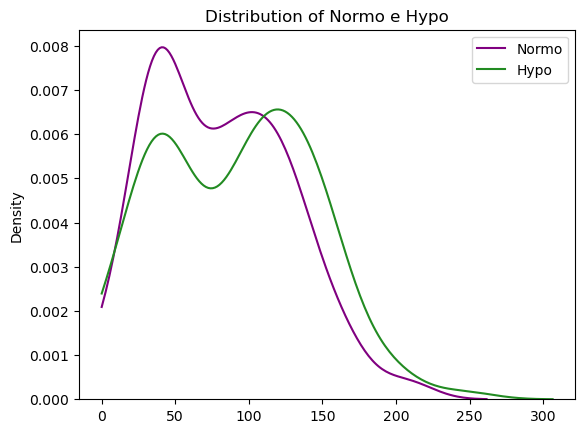

In [51]:
sns.kdeplot(data=H_unfil_normo.mean(), label = 'Normo', clip = [0,500], color = 'purple')
sns.kdeplot(data=H_unfil_hypo.mean(), label = 'Hypo', clip = [0,500], color = 'forestgreen')
plt.legend()
plt.title('Distribution of Normo e Hypo')
plt.show()

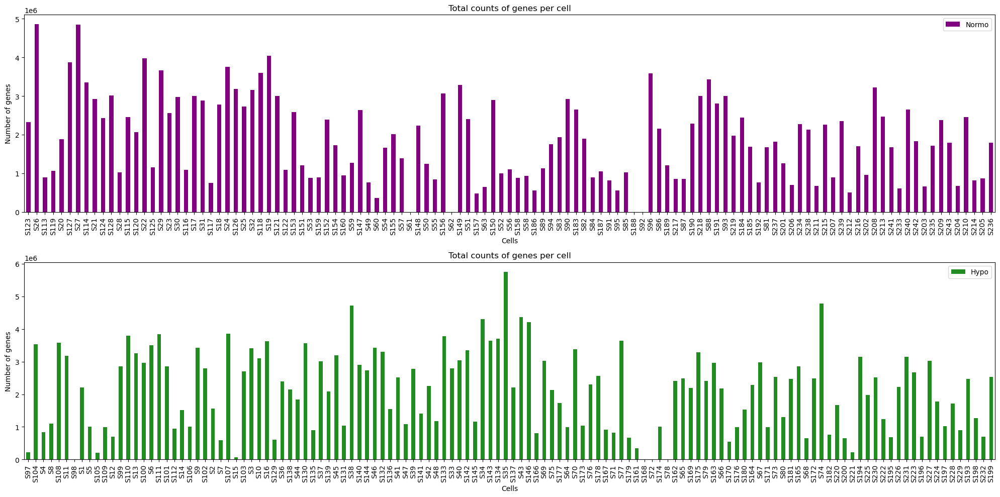

In [52]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))

# Plot 1
H_unfil_normo.sum().plot(kind='bar', ax=ax1, color='purple', label = 'Normo')
ax1.set_title('Total counts of genes per cell')
ax1.set_xlabel('Cells')
ax1.set_ylabel('Number of genes')
ax1.legend()

# Plot 2
H_unfil_hypo.sum().plot(kind='bar', ax=ax2, color='forestgreen', label = 'Hypo')
ax2.set_title('Total counts of genes per cell')
ax2.set_xlabel('Cells')
ax2.set_ylabel('Number of genes')
ax2.legend()

plt.tight_layout()
plt.show()

It is observed that, in conditions of hypoxia, more genes are expressed compared to normoxic conditions as we can see in previous plots. This difference in gene expression can be attributed to the cellular response to low oxygen levels, which plays a critical role in cellular adaptaton and survival.

There is indeed scientific evidence that, in hypoxic conditions, tumor cells undergo a series of molecular changes to enhance their ability to obtain oxygen and nutriens, often involving the activation of specific genes that are not highly expressed in normoxic conditions.

##### __UNSUPERVISED ANALYSIS__

In order to conclude our EDA, we have decided to perform an Unsupervised Analysis (PCA and Hierarchical Clustering) on the dataset. This additional analysis aims to determine whether the dataset exhibits linear separability, which would suggest the presence of distinct clusters or patterns within the data, and suggesting that certain variables or combinations of variables may be more influential in differentiating thse groups. 

Considering that the results of the EDA did not provide evidence of a high-quality unfiltered dataset but, instead, revealed a consistent presence of noise and outliers, we have concerns about the reliability and suitability of the dataset for further analysis. Therefore, we expect that this check will not provide us remarkable results, but we will have to wait to work with an unfiltered and normalized dataset to recognize effective results.

__PRINCIPAL COMPONENT ANALYSIS__

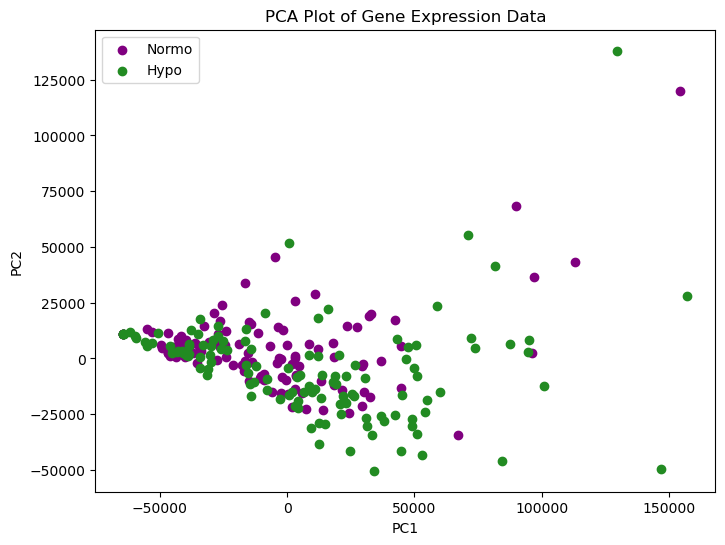

In [59]:
# Perform PCA on the unfiltered dataset
pca = PCA(n_components=2)
pca_result = pca.fit_transform(H_Smart_unfil.T)

# Get condition labels for the samples
conditions = H_Smart_metadata["Condition"]

# Create a PCA plot
plt.figure(figsize=(8, 6))
for condition, color in zip(conditions.unique(), ['purple', 'forestgreen']):
    idx = conditions == condition
    plt.scatter(pca_result[idx, 0], pca_result[idx, 1], c=color, label=condition)
plt.legend()
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Plot of Gene Expression Data')
plt.show()

We can try again with a three-dimensional plot:

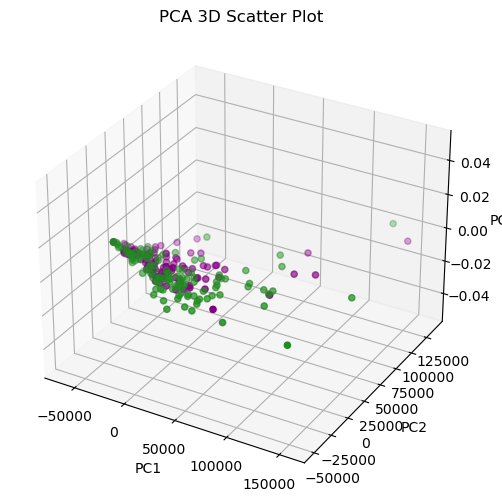

Top 10 contributing genes for PC1: ['FTL', 'ACTB', 'FTH1', 'LDHA', 'GAPDH', 'BEST1', 'KRT19', 'HSPA5', 'MT-CO1', 'ENO1']
Top 10 contributing genes for PC2: ['FTL', 'FTH1', 'BEST1', 'KRT17', 'AKR1C2', 'KRT13', 'KRT6A', 'KRT16', 'SPP1', 'IGFBP3']
Top 10 contributing genes for PC3: ['KRT19', 'FTH1', 'BEST1', 'LDHA', 'KRT17', 'KRT13', 'GAPDH', 'KRT6A', 'MT-CO1', 'ALDOA']


In [54]:
# PCA model with three components
pca = PCA(n_components=3)
pca_result = pca.fit_transform(H_Smart_unfil.T)

conditions = H_Smart_metadata["Condition"]


fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for condition, color in zip(conditions.unique(), ['purple', 'forestgreen']):
    idx = conditions == condition
    ax.scatter(pca_result[idx, 0], pca_result[idx, 1], c=color, label=condition)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('PCA 3D Scatter Plot')

plt.show()
# Create a DataFrame with the loading scores for each gene
loading_scores = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3'], index=H_Smart_unfil.index)

# Find the top 10 contributing genes for each principal component
N = 10 
top_contributing_genes_PC1 = loading_scores.nlargest(N, 'PC1').index
top_contributing_genes_PC2 = loading_scores.nlargest(N, 'PC2').index
top_contributing_genes_PC3 = loading_scores.nlargest(N, 'PC3').index
print(f"Top {N} contributing genes for PC1: {list(top_contributing_genes_PC1)}")
print(f"Top {N} contributing genes for PC2: {list(top_contributing_genes_PC2)}")
print(f"Top {N} contributing genes for PC3: {list(top_contributing_genes_PC3)}")

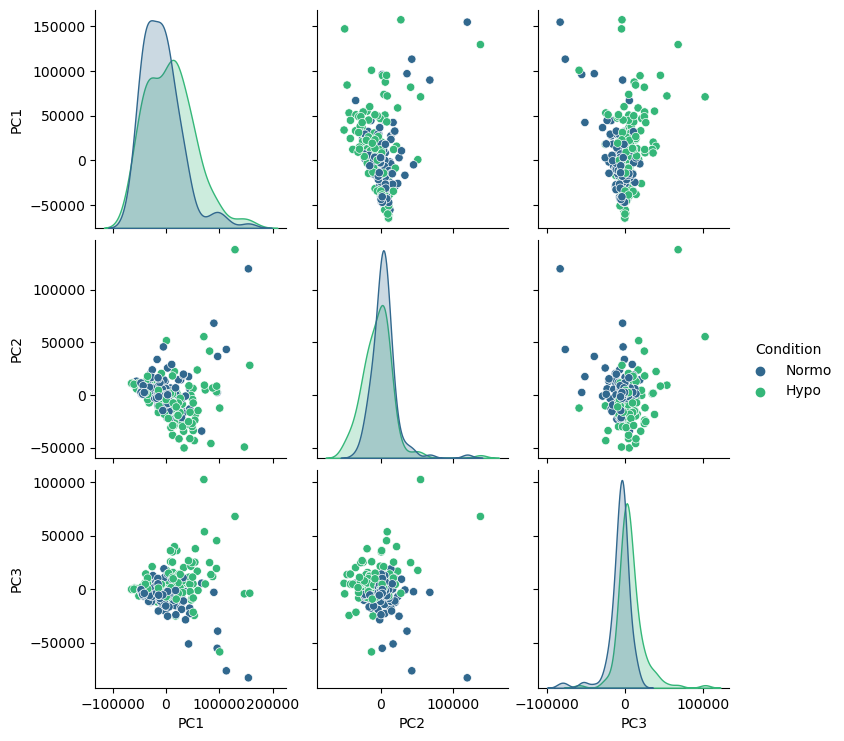

In [56]:
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2', 'PC3'])
pca_df['Condition'] = H_Smart_unfil.columns.map(H_Smart_metadata['Condition'])
sns.pairplot(pca_df, hue='Condition', vars=['PC1', 'PC2', 'PC3'], palette = 'viridis')
plt.show()

__HIERARCHICAL CLUSTERING__

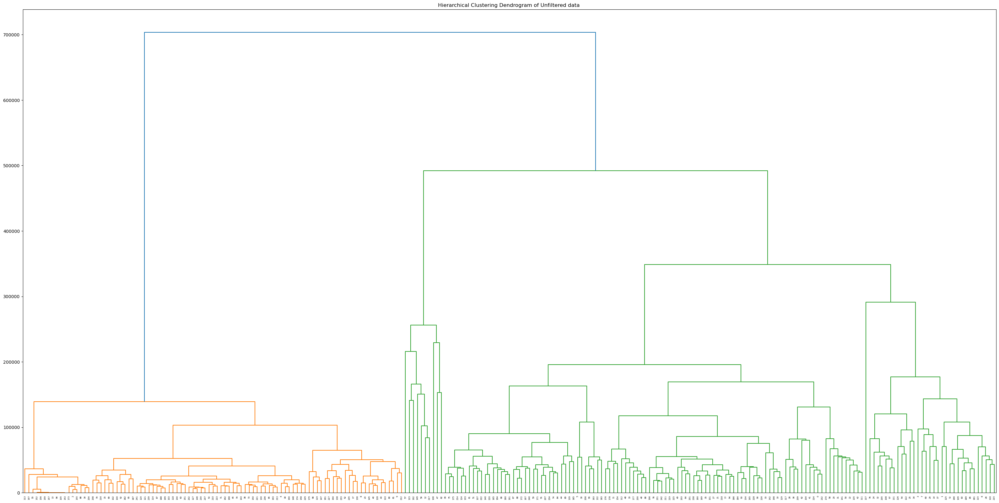

In [57]:
Z1 = linkage(H_Smart_unfil.T, method='ward')
plt.figure(figsize=(40, 20))
plt.title("Hierarchical Clustering Dendrogram of Unfiltered data ")
dendrogram(Z1);

In [60]:
label_series = pd.Series(np.zeros(len(H_Smart_unfil.columns)), index = H_Smart_unfil.columns)
for i in label_series.index:
    if label[i] == 'Normo':
        label_series[i] = int(0)
    if label[i] == 'Hypo':
        label_series[i] = int(1)
label_series = label_series.astype(int)


In [61]:
labels_hier = fcluster(Z1,2, criterion = 'maxclust')

labels_hier = labels_hier -1
counter = 0
First_label = []
Second_label = []
for i in range(len(label_series.to_numpy())):
    if labels_hier[i] == 0:
        First_label.append(counter)
        counter += 1
    elif labels_hier[i] == 1:
        Second_label.append(counter)
        counter += 1

In [62]:
counter1 = 0
counter2 = 0
for i in label_series[label_series == 0].index:
    for j in First_label:
        if i == j:
            counter1 += 1
    for w in Second_label:
        if i == w:
            counter2 += 1
counter1, counter2

(0, 0)

In [63]:
counter1 = 0
counter2 = 0
for i in label_series[label_series == 1].index:
    for j in First_label:
        if i == j:
            counter1 += 1
    for w in Second_label:
        if i == w:
            counter2 += 1
counter1, counter2

(0, 0)

## Data Cleaning and Quality Control

Preprocessing in RNA-Seq analysis plays a critical role in ensuring the quality and reliability of the obtained gene expression data. It encompasses several essential steps, including *data cleaning*.

Data cleaning involves removing low-quality samples, outliers or problematic cells, ensuring that the data used for analysis is of high quality and free from technical biases, in order to be biologically meaningful.


In an initial step of our analysis, considering that the ultimate goal of this research is stightly connected with the 'Hypo'/'Normo' dualization of the dataset, we considered performing cell filtering on a dataset where hypoxic and normoxic cells are split separately.

In the end, we realized that this approach could have led us to the loss of important information, as filtering cells separately may eliminate certain cells that could have provided valuable insight to the overall understanding of the data. Moreover, applying different filtering criteria or thresholds to hypo and normo cells could introduce inconsistencies and biases in the data, and may lead us to ignore potential dependencies or relationships between the two groups.

By filtering the entire dataset collectively, we aim to achieve an increased sample size available for statistical analyses and modelling.

The main matrix we will use as a reference of the quality of our cleaning are three as we previously said:
- Count Depth
- UMI counts
- Fraction of mithocondrial genes

### __Cell Filtering__

#### Step 1: Outliers detection
Considering the sparsity of our dataset, it is crucial to approach the handling of outliers with caution and delicacy. As we have noticed, since the majority of the genes have zero expression values, the interquartile range, which is commonly used to identify outliers in dense datasets, may not effectively capture the distribution of the expressed genes.

Additionally, it is important to note that the expressed genes, although representing a minoritu compared to the large number of zero, carry valuable information. Therefore, discarding these genes indiscriminately could result in the loss of crucial insights.



In this section, we will try to carefully handle this issue by performing cell filtering based on the total counts of genes in order to identify potential outliers. To assess the presence of atypical cells, we will examine the histogram of the total counts per cell, which allows us to identify cells that deviate significantly from the majority.

In particular, we will focus on two types of atypical cells:
- Dead cells, that typically have low gene expression due to degradation or lack of cellular activity
- Cells with compromised membranes or doublets, which are characterised by abnormally high gene expression levels.

In [64]:
adata = sc.AnnData(H_Smart_unfil.T) # Just transforming into a dataset readable by scanpy

In [65]:
# Calculate the total counts per cell
adata.obs['n_counts']  = adata.X.sum(axis=1)

# Calculate skewness and kurtosis
adata_skewness = skew(adata.obs['n_counts'])
adata_kurtosis = kurtosis(adata.obs['n_counts'])

Here we computed the skewness and the kurtosis to try to make our dataset more symmetric and similar to a normal distribution by adjusting the parameters since the dataset has a lot of variables and by the law of large numbers the distribution of each cell can converge to a normal distribution

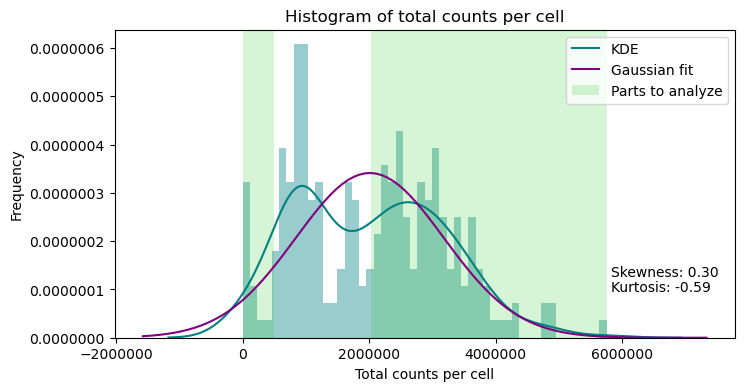

Estimated peak of counts: 2023939.9672439243


In [79]:
fig, ax = plt.subplots(figsize=(8, 4))
# Fit a Gaussian distribution to the counts
mu, std = norm.fit(adata.obs['n_counts'])

# Plot the histogram of counts and the fitted Gaussian distribution
sns.distplot(adata.obs['n_counts'], bins=50, kde_kws={'label': 'KDE'},color = 'teal')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
peak = x[p.argmax()]
sns.lineplot(x=x, y=p, label='Gaussian fit', color = 'purple')

# Add skewness and kurtosis
plt.annotate(f'Skewness: {adata_skewness:.2f}', xy=(0.80, 0.2), xycoords='axes fraction', fontsize=10)
plt.annotate(f'Kurtosis: {adata_kurtosis:.2f}', xy=(0.80, 0.15), xycoords='axes fraction', fontsize=10)

plt.xlabel('Total counts per cell')
plt.ylabel('Frequency')
plt.title('Histogram of total counts per cell')

# Add shaded region from peak to maximum count value
plt.axvspan(xmin=peak, xmax=adata.obs['n_counts'].max(), facecolor='limegreen', alpha=0.2, label = "Parts to analyze")
plt.axvspan(xmin=0, xmax=500000, facecolor='limegreen', alpha=0.2)
plt.legend()
# Format so that scientific notation is not used
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=False))
ax.ticklabel_format(style='plain')

plt.show()
print("Estimated peak of counts:", peak)

The KDE plot provides valuable insights into the distribution of gene expression values in a dataset.

One noticeable observation from the KDE plot is the presence of a bimodal distribution, where two distinct peaks are observed. Identifying bimodal distributions or multiple peaks in the KDE provides a clear indication that further quality control operations are necessary, as it suggests the existence either of technical anomalies, of cells that have experienced failure or damage, such as dead cells, cells with compromised membranes, or the presence of cell duplets.

Conversely, high-quality data typically exhibits a unimodal distribution, charachterized by a single prominent peak, indicating that the the majority of samples in the dataset have consistent gene expression patterns and are in  relatively homogenous state.

In order to identify outliers and uninformative cells, we will examine two specific regions of the plot, which are expected to contain such observations:In order to identify outliers and uninformative cells, we will examine two specific regions of the plot, which are expected to contain such observations:

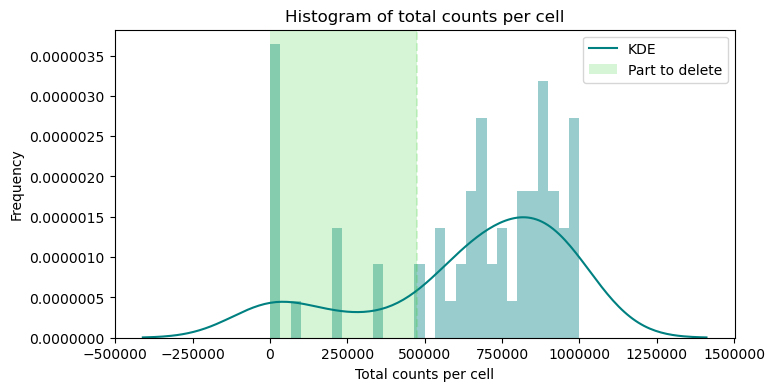

In [81]:
fig, ax = plt.subplots(figsize=(8, 4))
sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<1000000], kde = True, bins = 30, kde_kws={'label': 'KDE'}, color = 'teal')
plt.axvline(x=475000, color='limegreen', linestyle='--', alpha = 0.2)
plt.axvspan(xmin=0, xmax=475000, facecolor='limegreen', alpha=0.2, label = "Part to delete")

plt.xlabel('Total counts per cell')
plt.ylabel('Frequency')
plt.title('Histogram of total counts per cell')

# Format so that scientific notation is not used
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=False))
ax.ticklabel_format(style='plain')
plt.legend()

plt.show()
min_cell = 475000

Based on the observed plot, we witness that cells exhibiting a count lower than 475 000 are positioned as outliers in the distribution, as they deviate from the majority of cells.

The presence of such outliers in the lower count range potentially suggests phenomena such as cell debris or cells that have undergone cellular death.



On the upper end of counts, we see a population of cells with high counts shown as a broad peak at 2,023,940 counts.

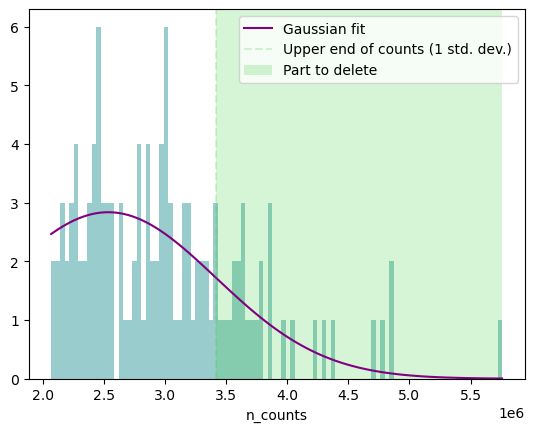

Estimated upper end of counts (2 standard deviations): 3416472.5503895455


In [82]:
# Select cells with counts greater than 2023940
high_count_cells = adata[adata.obs['n_counts'] > 2023940]

# Create histogram of counts
counts_hist, counts_bins = np.histogram(high_count_cells.obs['n_counts'], bins=100)

# Define function for Gaussian distribution
def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Estimate initial Gaussian parameters from histogram
A_guess = np.max(counts_hist)

# Fit Gaussian to histogram
popt, pcov = curve_fit(gaussian, counts_bins[:-1], counts_hist, p0=[mu, std, A_guess])
# Estimate upper end of counts based on fitted Gaussian
num_std_dev = 1  # Number of standard deviations from the mean
upper_end = popt[0] + num_std_dev * popt[1]
max_count = np.max(high_count_cells.obs['n_counts'])
upper_end = min(upper_end, max_count)

# Create plot of histogram and fitted Gaussian using seaborn
sns.distplot(high_count_cells.obs['n_counts'], bins=100, kde=False, color = 'teal')
sns.lineplot(x=np.linspace(counts_bins[0], counts_bins[-1], 100), y=gaussian(np.linspace(counts_bins[0], counts_bins[-1], 100), *popt), color='purple', label='Gaussian fit')
plt.axvline(x=upper_end, color='limegreen', linestyle='--', alpha = 0.2, label = "Upper end of counts (1 std. dev.)")
plt.axvspan(xmin=upper_end, xmax=adata.obs["n_counts"].max(), facecolor='limegreen', alpha=0.2, label = "Part to delete")

plt.legend()
plt.show()

print("Estimated upper end of counts (2 standard deviations):", upper_end)
max_cell = upper_end

Upon closer examination of the upper range of counts, a distinct population of cells with high counts becomes apparent, shown as a broad peak at 2023940 counts.

To estimate the boundaries of this population, a Gaussian curve is visually traced around the peak, and the point at which the curve drops below 25% of its maximum value is identified.
This approach allows us to estimate this subset of cells, characterized by exceptionally high counts, to range until 3416473 counts.

We can thus proceed filtering:

In [74]:
adata_copy = adata.copy()
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_copy.n_obs))

sc.pp.filter_cells(adata_copy, min_counts = min_cell)
print('Number of cells after min count filter: {:d}'.format(adata_copy.n_obs))

sc.pp.filter_cells(adata_copy, max_counts = max_cell)
print('Number of cells after max count filter: {:d}'.format(adata_copy.n_obs))

Total number of cells: 243
Number of cells after min count filter: 229
Number of cells after max count filter: 199


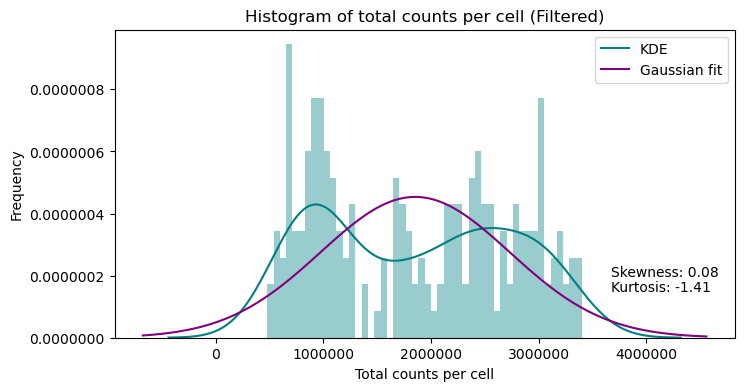

In [84]:
# Calculate new skewness and kurtosis
adata_copy_skewness = skew(adata_copy.obs['n_counts'])
adata_copy_kurtosis = kurtosis(adata_copy.obs['n_counts'])
fig, ax = plt.subplots(figsize=(8, 4))
# Fit a Gaussian distribution to the counts
mu, std = norm.fit(adata_copy.obs['n_counts'])

# Plot the histogram of counts and the fitted Gaussian distribution
sns.distplot(adata_copy.obs['n_counts'], bins=50, kde_kws={'label': 'KDE'}, color = 'teal')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
peak = x[p.argmax()]
sns.lineplot(x=x, y=p, color='purple', label='Gaussian fit')

# Add skewness and kurtosis
plt.annotate(f'Skewness: {adata_copy_skewness:.2f}', xy=(0.80, 0.2), xycoords='axes fraction', fontsize=10)
plt.annotate(f'Kurtosis: {adata_copy_kurtosis:.2f}', xy=(0.80, 0.15), xycoords='axes fraction', fontsize=10)

plt.xlabel('Total counts per cell')
plt.ylabel('Frequency')
plt.title('Histogram of total counts per cell (Filtered)')

plt.legend()
# Format so that scientific notation is not used
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=False))
ax.ticklabel_format(style='plain')
plt.show()

Following the cell cleaning process, a notable change is observed in the skewness and kurtosis of the gene expression distribution.

The __skewness__ value decreased friom 0.30 to 0.008, indicating a shift towards a more symmetric distribution.

Conversely, the __kurtosis__ value decreased from -0.59 to -1.41, suggesting a transition towards a more platykurtic distribution.

This observed change in skewness and kurtosis aligns with expectations, as the removal of data points from the tails of the distribution would result in a decrease of kurtosis. The distribution becomes less peaked and displays lighter tails.

The shift towards symmetry shown by the decrease in skewness suggests a potential improvement in data quality, indicating a more balanced distribution of gene expression values.

In [76]:
filtered_1_data = adata_copy.to_df()

We can observe the difference between the unfiltered and cell-filtered data by visualizing them in logarithmic plots.

In [77]:
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata_copy.obs['log_counts'] = np.log(adata_copy.obs['n_counts'])

# Calculate skewness and kurtosis
adata_skewness_log = skew(adata.obs['log_counts'])
adata_kurtosis_log = kurtosis(adata.obs['log_counts'])

# Calculate skewness and kurtosis
adata_copy_skewness_log = skew(adata_copy.obs['log_counts'])
adata_copy_kurtosis_log = kurtosis(adata_copy.obs['log_counts'])

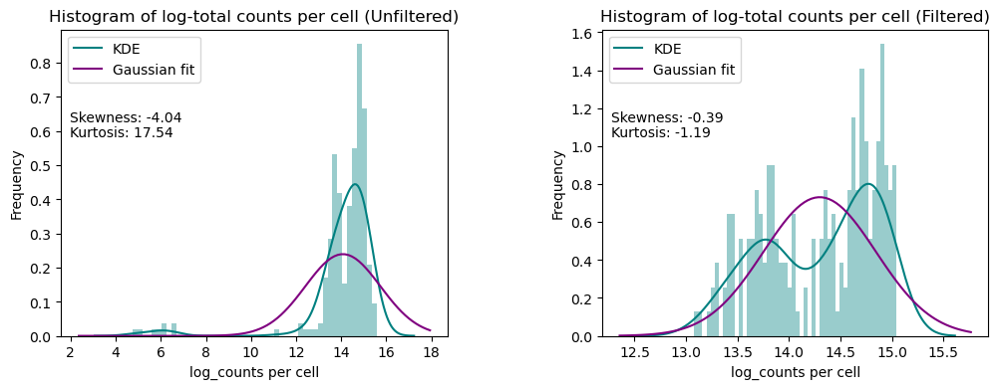

In [85]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Fit a Gaussian distribution to the counts
mu, std = norm.fit(adata.obs['log_counts'])
mu2, std2 = norm.fit(adata_copy.obs['log_counts'])

# Plot the histogram of counts and the fitted Gaussian distribution
sns.distplot(adata.obs['log_counts'], bins=50, kde_kws={'label': 'KDE'}, ax=ax1, color = 'teal')
sns.distplot(adata_copy.obs['log_counts'], bins=50, kde_kws={'label': 'KDE'}, ax=ax2, color = 'teal')

xmin, xmax = ax1.get_xlim()
xmin2, xmax2 = ax2.get_xlim()
x1 = np.linspace(xmin, xmax, 100)
x2 = np.linspace(xmin2, xmax2, 100)
p = norm.pdf(x1, mu, std)
p2 = norm.pdf(x2, mu2, std2)
sns.lineplot(x=x1, y=p, color='purple', label='Gaussian fit', ax=ax1)
sns.lineplot(x=x2, y=p2, color='purple', label='Gaussian fit', ax=ax2)

# Annotate skewness and kurtosis on the plots
ax1.annotate(f'Skewness: {adata_skewness_log:.2f}', xy=(0.0225, 0.7), xycoords='axes fraction', fontsize=10)
ax1.annotate(f'Kurtosis: {adata_kurtosis_log:.2f}', xy=(0.0225, 0.65), xycoords='axes fraction', fontsize=10)

ax2.annotate(f'Skewness: {adata_copy_skewness_log:.2f}', xy=(0.0225, 0.7), xycoords='axes fraction', fontsize=10)
ax2.annotate(f'Kurtosis: {adata_copy_kurtosis_log:.2f}', xy=(0.0225, 0.65), xycoords='axes fraction', fontsize=10)


ax1.set_xlabel('log_counts per cell')
ax1.set_ylabel('Frequency')
ax1.set_title('Histogram of log-total counts per cell (Unfiltered)')
ax1.legend()

ax2.set_xlabel('log_counts per cell')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of log-total counts per cell (Filtered)')
ax2.legend()
plt.subplots_adjust(wspace=0.4)

plt.show()

#####  Step 2: Mitochondrial reads

The mitochondrial ratio is an important estimator of cell quality, since high levels of mitochondrial gene expression can be indicative of compromised cellular health and technical artifacts in RNA-sequencing data.
Hence, a high proportion of mitochondrial gene expression can be associated with various issues, such as cell stress, apoptosis or contamination, and is thus likely to interfere with the accurate measurements and introduce noise in the data.

In [86]:
# We define adata_qc1 as the adata without outliers (quality control step 1)
adata_qc1 =sc.AnnData(filtered_1_data)

# Calculate the total counts per cell
adata_qc1.obs['n_counts']  = adata_qc1.X.sum(axis=1)

# Let us isolate the one mitocondiral genes
mt_gene_mask = [gene.startswith(('MT-',"MT")) for gene in adata_qc1.var_names] # Mask for mitochondrial genes
adata_qc1.obs['mt_frac'] = adata_qc1.X[:, mt_gene_mask].sum(1)/adata_qc1.obs['n_counts'] # Mitochondrial frac 
adata_qc1.obs['n_genes'] = (adata_qc1.X > 0).sum(1)

In [87]:
adata_2 = sc.AnnData(H_Smart_unfil.T)
adata_2.obs['n_counts']  = adata_2.X.sum(axis=1)
mt_gene_mask = [gene.startswith(('MT-',"MT")) for gene in adata_2.var_names] # Mask for mitochondrial genes
adata_2.obs['mt_frac'] = adata_2.X[:, mt_gene_mask].sum(1)/adata_2.obs['n_counts'] # Mitochondrial ratio 
adata_2.obs['n_genes'] = (adata_2.X > 0).sum(1)

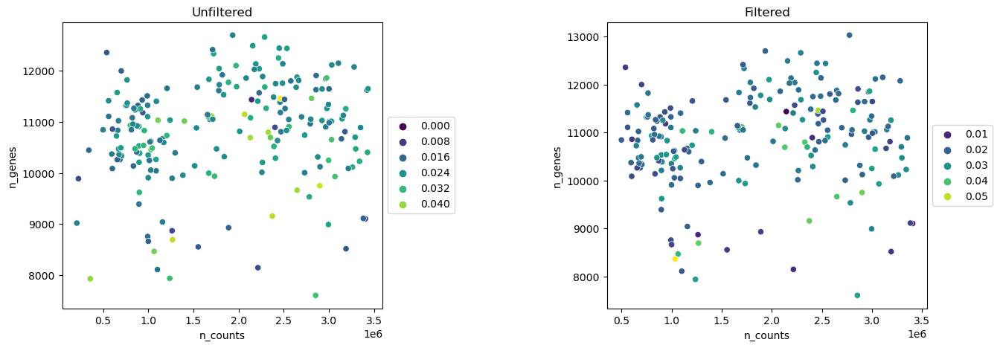

In [88]:
#Unfiltered
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.set_title("Unfiltered")
ax2.set_title('Filtered')


plt.subplots_adjust(wspace=0.7)
sns.scatterplot(x = adata_2.obs['n_counts'][adata_2.obs['n_counts']<(3.5*1e6)], y = adata_2.obs['n_genes'][adata_2.obs['n_genes']<13000][adata_2.obs['n_genes']>4000], hue = adata_2.obs['mt_frac'][adata_2.obs['mt_frac']<0.05] ,ax =ax1, palette = 'viridis')
sns.scatterplot(x = adata_qc1.obs['n_counts'], y = adata_qc1.obs['n_genes'][adata_qc1.obs['n_genes']>4000], hue = adata_qc1.obs['mt_frac'], ax = ax2, palette = 'viridis')
# Move the legend of ax1 outside the plot
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Move the legend of ax2 outside the plot
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

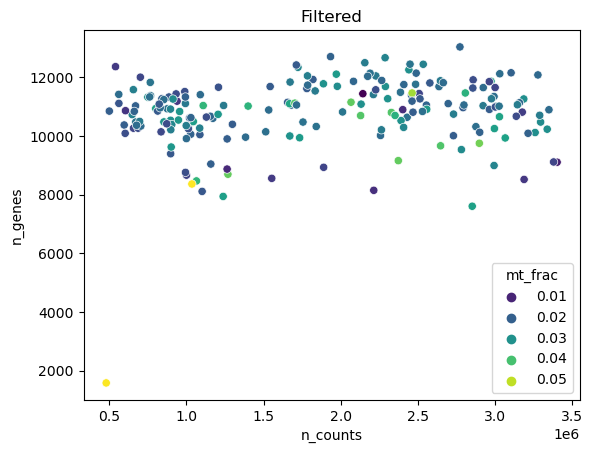

In [89]:
# Let us see only cells with mitocondrial genes
sns.scatterplot(x = adata_qc1.obs['n_counts'], y = adata_qc1.obs['n_genes'], hue = adata_qc1.obs['mt_frac'], palette = 'viridis')
plt.title("Filtered")
plt.show()

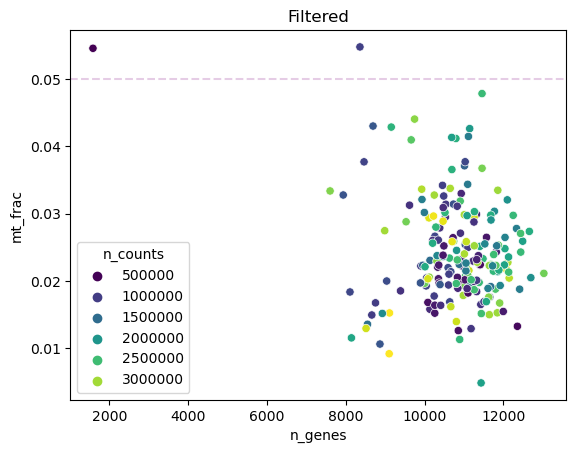

In [90]:
sns.scatterplot(x = adata_qc1.obs['n_genes'], y = adata_qc1.obs['mt_frac'], hue = adata_qc1.obs['n_counts'], palette = 'viridis')

plt.axhline(y=0.05, color='purple', linestyle='--', alpha = 0.2, label = "Threshold")

plt.title("Filtered")
plt.show()

In this last analyis, we have examined the relationship between the number of genes, the number of counts and the mitochondrial ratio, observing that cells with a mitochondrial ratio exceeding 5% exhibited a distinct concentration.

Since, as a rule of thumb, a mitochondrial ratio above 5% is commonly associated with cells that have a broken membrane or compromised cellular health, we have decided to exclude such cells from further analysis.

In [91]:
# Filtering of the data
adata_qc2 = adata_qc1[adata_qc1.obs['mt_frac']<0.05]
adata_qc2

View of AnnData object with n_obs × n_vars = 197 × 23396
    obs: 'n_counts', 'mt_frac', 'n_genes'

In [92]:
H_Smart_cf = adata_qc2.to_df()
H_Smart_cf = H_Smart_cf.T

In [93]:
diff =  set(label.index) - set(H_Smart_cf.columns) 
diff = pd.Index(list(diff))

In [94]:
label_cf = label.copy()
label_cf.drop(diff.tolist())
H_Smart_cf_complete = H_Smart_cf.T.copy()
H_Smart_cf_complete['Condition'] = label_cf
H_Smart_cf_complete = H_Smart_cf_complete.T

Before we conclude this first Data Cleaning step, we ensure that the removal of the columns did not alter our dataset by creating linearly dependent rows. In this case, we drop them.

In [95]:
# As last check we see if there are linearly dependent rows and if so we drop it
corr_matrix_cf = H_Smart_cf.corr()
l = []
for i in H_Smart_cf.columns:
    for j in H_Smart_cf.columns:
        if i != j:
            if abs(corr_matrix_cf.loc[i,j]) == 1 :
                l.append((i,j))
l

[]

#### __Gene Filtering__

##### First approach: __Duplicates__

A standard practice in data preprocessing that we will perform in our initial step of gene filtering involves removing duplicate genes from the dataset.

This step is essential to enhance the quality and interpretability of downstream analyses, since duplicate genes are redundant and provide repeated information, offering no additional value to the analysis and potentially introducing unnecessary biases.

In [96]:
#We keep only one of the duplicates by discarding the rest
df_duplicates_number = H_Smart_cf[H_Smart_cf.duplicated(keep = 'first')]
df_duplicates_total = H_Smart_cf[H_Smart_cf.duplicated(keep = False)]

In [97]:
print(f'Total number of duplicate genes: {df_duplicates_number.shape[0]}')
print(f'Number of genes which have a copy: {df_duplicates_total.shape[0] - df_duplicates_number.shape[0]}')

Total number of duplicate genes: 463
Number of genes which have a copy: 161


In [98]:
H_Smart_wd = H_Smart_cf[H_Smart_cf.duplicated(keep = 'first') == False]

A notable observation is that a considerable proportion of the duplicated genes that were removed from the dataset exhibited a high level of sparsity. This means that these duplicate genes had a significant number of zero expression values, indicating that the removal of these duplcate genes corresponds to the elimination of less relevant or less informative genes.

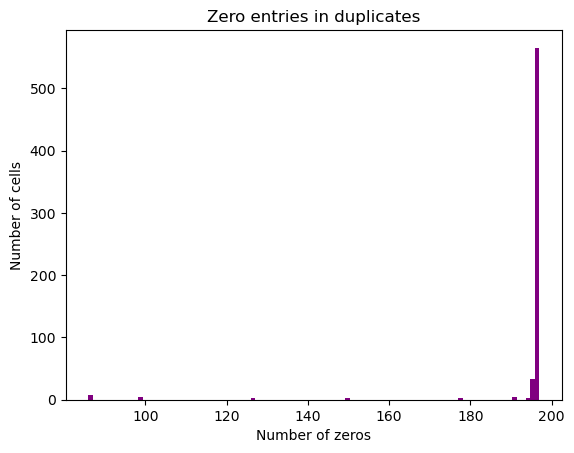

In [99]:
zeros = pd.Series(np.zeros(len(df_duplicates_total.index)), index = df_duplicates_total.index)

for ind in df_duplicates_total.index.tolist():
    counter = 0
    for j in df_duplicates_total.T[ind]:
        if j == 0:
            counter += 1
    zeros[ind] = counter
    
plt.hist(zeros, bins = 100, color = 'purple')
plt.title('Zero entries in duplicates')
plt.xlabel('Number of zeros')
plt.ylabel('Number of cells')
plt.show()

##### Second  Approach: __Coefficient of variation__

In this step, we will utilize the coefficient of variation (CV), calculated as the standard deviation divided by the mean, as a metric for gene filtering.
When the mean is substantially larger compared to the variance, it indicates a more uniform distribution of expression values, where the mean value only varies slightly. In such cases, the genes' expression pattern may contribute less to the overall variability of the dataset an potentially carry less relevant information.

To address this, we will set a threshold value below which genes with low coefficient of variation will be discarded.

In [100]:
H_Stat = H_Smart_wd.T.describe().T[['mean', 'std', 'min','max' ]]
H_Stat

,mean,std,min,max
WASH7P,0.040609,0.316833,0.0,3.0
CICP27,0.086294,0.481987,0.0,5.0
DDX11L17,0.380711,1.116771,0.0,8.0
WASH9P,0.187817,0.580512,0.0,4.0
OR4F29,0.091371,0.352508,0.0,2.0
...,...,...,...,...
MT-TE,14.472081,19.036096,0.0,212.0
MT-CYB,2023.000000,1375.704899,83.0,6760.0
MT-TT,19.959391,21.538489,0.0,154.0
MT-TP,42.020305,35.000723,0.0,267.0


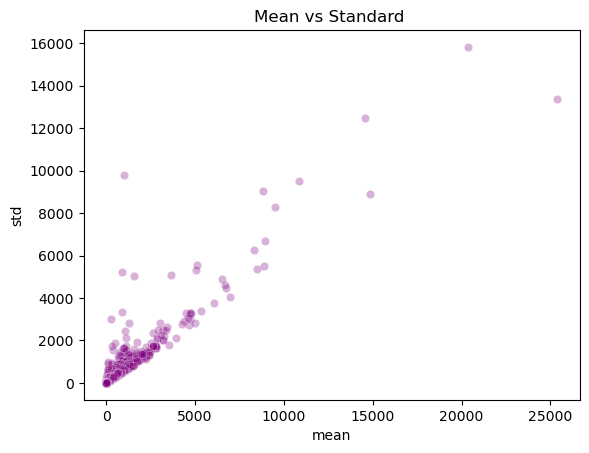

In [115]:
scat = sns.scatterplot(x = 'mean', y = 'std', data= H_Stat, color = 'purple', alpha=0.30)
plt.title('Mean vs Standard ')
plt.show() 

To facilitate comparisons among genes, we will log-transform the gene expression data to make the distribution of CV scores more uniform and thus comparable. We then plot the standard deviation against the mean expression levels with a scatter plot and with a histogram:

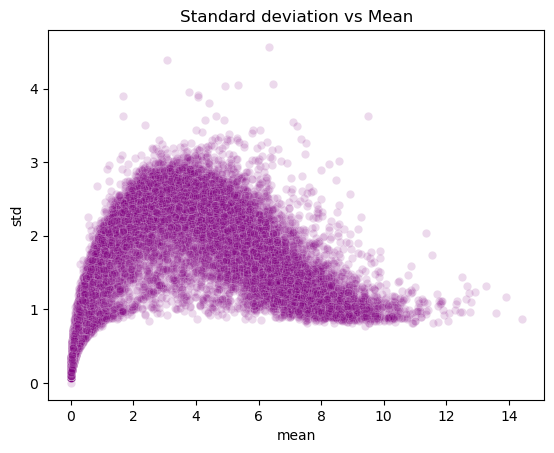

In [132]:
H_Smart_wd_log = np.log2(1+ H_Smart_wd)
H_Stat_log = H_Smart_wd_log.T.describe().T[['mean', 'std', 'min','max' ]]
plt.style.use("default")
scat = sns.scatterplot(x = 'mean', y = 'std', data= H_Stat_log, color = 'purple', alpha=0.15)
plt.title('Standard deviation vs Mean')
plt.show() 

In [117]:
variance_ratio = H_Stat_log['std'] / H_Stat_log['mean']

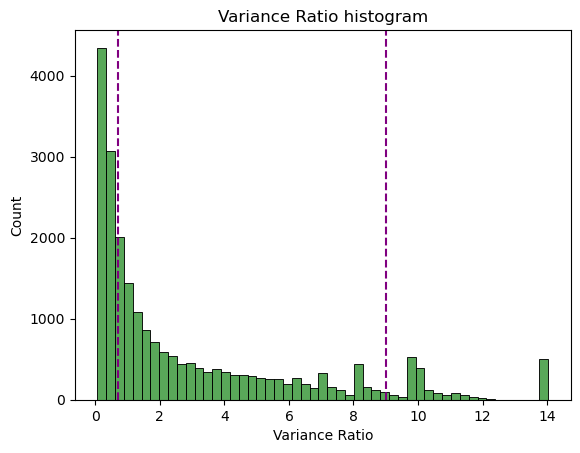

In [155]:
sns.histplot(H_Stat_log['std'] / H_Stat_log['mean'], color = 'forestgreen')
plt.title('Variance Ratio histogram')
plt.xlabel('Variance Ratio')
plt.ylabel('Count')
plt.axvline(x=0.7, color='purple', linestyle='dashed', linewidth=1.5)
plt.axvline(x=9, color='purple', linestyle= 'dashed', linewidth=1.5)
plt.show()

As a rule of thumb, generally genes with a CV between 0.7 and 10 are kept in the dataset. This becuse low CV scores indicate low variability across the sample, so they are not differently expressed among cells; too high CV on the other hand may be due to sparsity of the genes, which causes the mean to be very low and the standard deviation really high.
However, looking at our plot, we see that a CV of 9 could be a better threshold, since there is an unusual pick at 10. 

To justify the removal of genes with variance ratios outside a threshold range of [0.7, 9.0], we employ the concept of Counts Per Million (CPM) normalization, obtained by dividing the count for the specific gene by the total count of expression values for all genes in the sample and then multiplying it by one million. Basically, this count adresses "in how many cells would be a specific gene expressed if the cells were 1 million".

Firstly we look at the relation between CPM and CV.


In [124]:
def CPM (Data):
    Data2 = Data.copy()
    x = np.zeros(Data.shape[1])
    counter2 = 0
    for i in Data.columns:
        counter = 0
        for j in Data[i]:
            counter += j
        x[counter2] = counter
        counter2 += 1
    counter3 = 0
    for i in Data.columns:
        Data2[i] = np.divide(Data2[i],x[counter3])
        counter3 +=1
    cpm_matrix = Data2 * 1e6
    return cpm_matrix
H_CPM_log = CPM(H_Smart_wd_log)

nonzeros = pd.Series(np.zeros(len(H_CPM_log.index)), index = H_CPM_log.index)
for ind in H_CPM_log.index.tolist():
    counter = 0
    for j in H_CPM_log.T[ind]:
        if j == 0:
            counter += 1
    nonzeros[ind] = 197 - counter
nonzeros = pd.DataFrame(nonzeros, columns = ['nonzeros'])

In [125]:
variance_ratio = pd.DataFrame(variance_ratio, columns = ['variance ratio'])
variance_ratio_counts = variance_ratio.join(nonzeros)

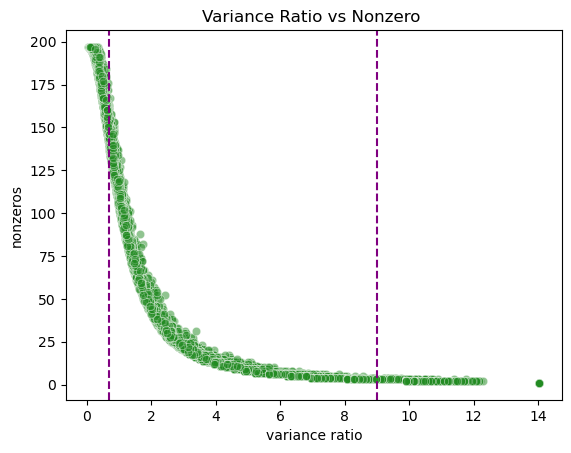

In [134]:
sns.scatterplot(data = variance_ratio_counts, x = 'variance ratio', y = 'nonzeros', color = 'forestgreen', alpha = 0.5 )
plt.axvline(x=0.7, color='purple', linestyle='dashed', linewidth=1.5)
plt.axvline(x=9, color='purple', linestyle= 'dashed', linewidth=1.5)
plt.title('Variance Ratio vs Nonzero ')
plt.show()

From this histogram, we notice that the highest CPM values correspond to cases when the variance ratio approaches 0, hence when the mean is significantly larger than the standard deviation: this means that these genes do not vary a lot, still they are expressed in majority of cells.Therefore, we might want to remove genes that exhibit extremely low variance ratio, since in such instances, their distribution appears to be relatively uniform, and is likely to bring redundant information.

Furthermore, we want to investigate the opposite trend: as expected, high CV are matched with low CPM...

We will now zoom on our zones of interest, firstly on the genes with CV lower than 0.7 and then on those with CV higher than 9. 

In [128]:
variance_ratio_counts_high = variance_ratio_counts[variance_ratio_counts['variance ratio'] < 0.7]
variance_ratio_counts_low = variance_ratio_counts[variance_ratio_counts['variance ratio'] > 9] #Here we are going to zoom on this data to look if they can be removed

<Axes: xlabel='variance ratio', ylabel='nonzeros'>

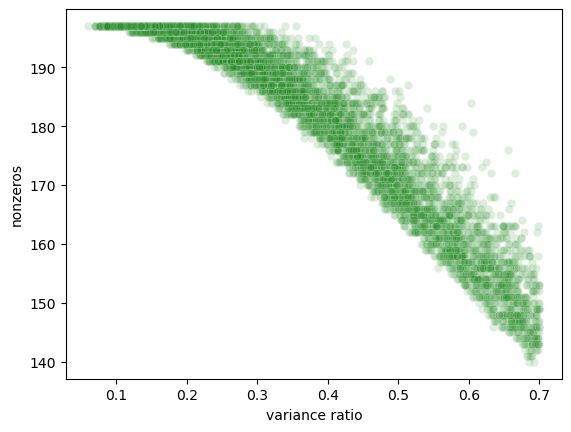

In [140]:
sns.scatterplot(data = variance_ratio_counts_high, x = 'variance ratio', y= 'nonzeros', color='forestgreen', alpha=0.15)

We confirm that the genes with low CV scores are also the ones wich are expressed on majority of cells: this is indeed a remarkable result, since it indicates that variable genes are the ones which are expressed more or less systematically only on some specific kinds of cells.

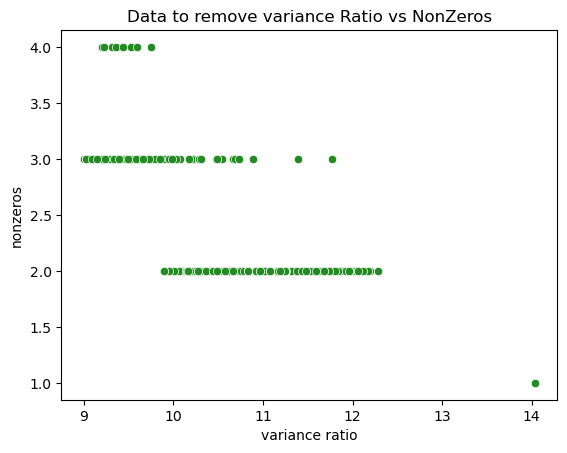

In [141]:
sns.scatterplot(data = variance_ratio_counts_low, x = 'variance ratio', y = 'nonzeros', color = 'forestgreen' )
plt.title('Data to remove variance Ratio vs NonZeros')
plt.show()

Also regarding high CV scores, we see what we expected:  genes whose variance ration exceed 9 have a CPM of at most 4, with a minimum record of 1 non-zero count at variance ratio 14. This observation suggests that these genes carry insufficient information for meaningful analysis.

Therefore, the high variance ratio threshold of 9 serves as an intuitive criterion for filtering out genes with limited expression range.

We can thus proceed with filtering: 

In [142]:
H_var_mean_log = H_Stat_log['std'] /  H_Stat_log['mean']
discard1 = H_var_mean_log[H_var_mean_log < 0.7]
discard2 = H_var_mean_log[H_var_mean_log > 9]

In [143]:
H_Smart_gf1 = H_Smart_wd.copy()
for i in list(discard1.index):
    H_Smart_gf1.drop(f'{i}', inplace = True, axis = 'index')
for i in list(discard2.index):
    H_Smart_gf1.drop(f'{i}', inplace = True, axis = 'index')
H_Smart_gf1

,S123,S4,S8,S11,S113,S119,S20,S1,S5,S109,...,S243,S193,S198,S232,S204,S210,S214,S199,S205,S236
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,1,0,0,0,1,8,2,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,0,0,2,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TM,10,4,0,3,1,1,2,3,1,4,...,0,0,1,0,1,5,0,9,2,1
MT-TS1,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MT-TD,3,1,0,1,0,0,0,0,1,1,...,1,0,0,0,0,1,0,0,0,1
MT-TR,0,0,0,2,0,2,0,0,0,0,...,0,2,0,1,0,2,0,0,0,3


We represent here the scatter plot of the standard deviation over the mean and the histogram of the cpm over the variance ratio for the filtered dataset: 

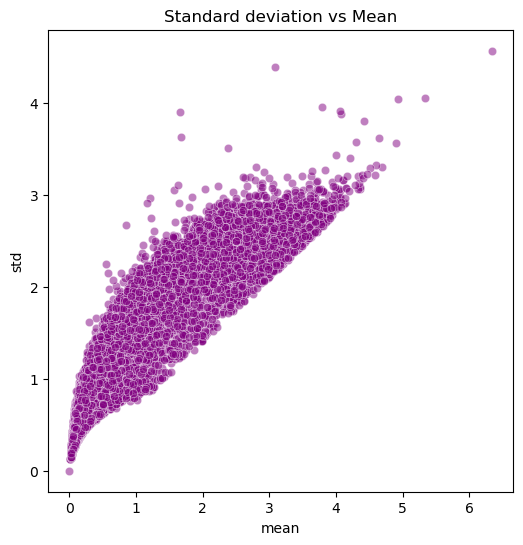

In [153]:
H_Stat_log_gf1 = np.log2(1 + H_Smart_gf1).T.describe().T[['mean', 'std', 'min','max' ]]
plt.style.use("default")
plt.figure(figsize=(6,6))
scat = sns.scatterplot(x = 'mean', y = 'std', data= H_Stat_log_gf1, color = 'purple', alpha = 0.5)
plt.title('Standard deviation vs Mean')
plt.show() 

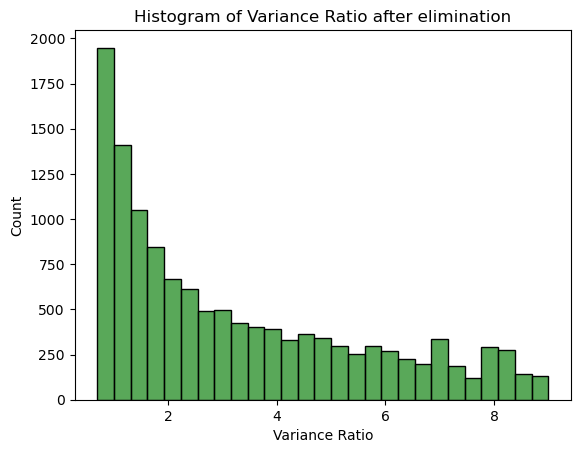

In [161]:
sns.histplot(data = H_Stat_log_gf1['std'] / H_Stat_log_gf1['mean'], color = 'forestgreen')
plt.title('Histogram of Variance Ratio after elimination')
plt.xlabel('Variance Ratio')
plt.show()

#####  Third Approach: __Sparsity__

The last method we will use to filter genes involves measuring the level of *sparsity*, which refers to the number of zero expression values for each gene. Since in our previous filtering we already adressed in some measure the levels of sparsity, we expect this last one analysis to remove less genes. 

In [156]:
# Let us compute and plot the sparsity of the resulting dataset
def count_zero(row): 
    l = len(row)
    c = 0
    for i in range(l): 
        if row[i] == 0: 
            c+=1
    return c
    
sparsity = dict()
sparsity['Sparsity'] = []
sparsity['Genes'] = []

for ind in H_Smart_gf1.index: 
    row = H_Smart_gf1.loc[ind, :]
    s = ( count_zero(row) / float(row.size) )
    sparsity['Genes'].append(ind)
    sparsity['Sparsity'].append(s)

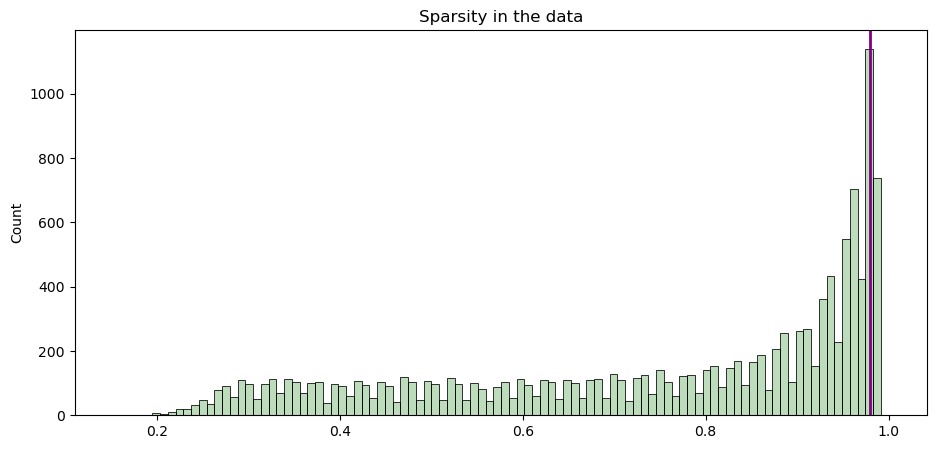

In [169]:
plt.figure(figsize=(11,5))
sns.histplot(data= sparsity['Sparsity'], bins = 100, color = 'forestgreen', alpha = 0.3)
plt.axvline(x = 0.98, color = 'purple', linewidth = 2)
plt.title('Sparsity in the data')
plt.show()

We observe that all our genes exhibit a sparsity level equal or higher than 0.2. In accordance with our previous gene filtering approach, where we removed genes with a large value of non-zero values, we now turn our attention to genes with high sparsity levels.

As a thumb rule, we decided to remove genes that are not present in at least 5% of the cells. This corresponds to sparsity level exceeding 0.95, indicating a substantial prevalence of zero expression values across the dataset.

In [170]:
sparsity = pd.Series(sparsity['Sparsity'], index = sparsity['Genes'])
sparsity

WASH7P      0.979695
CICP27      0.954315
DDX11L17    0.822335
WASH9P      0.873096
OR4F29      0.928934
              ...   
MT-TM       0.258883
MT-TS1      0.979695
MT-TD       0.736041
MT-TR       0.482234
MAFIP       0.289340
Length: 12808, dtype: float64

In [ ]:
diff = sparsity[sparsity > 0.95].index.tolist()

In [180]:
H_Smart_gf2 = H_Smart_gf1.copy()
for i in diff:
    H_Smart_gf2.drop(i, inplace = True, axis = 'index')
H_Smart_gf2

,S123,S4,S8,S11,S113,S119,S20,S1,S5,S109,...,S243,S193,S198,S232,S204,S210,S214,S199,S205,S236
DDX11L17,0,0,1,0,0,0,1,8,2,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,0,0,2,1,0,...,0,0,0,0,0,0,0,0,0,0
MTCO2P12,6,0,0,5,0,2,0,0,0,0,...,1,2,0,1,1,1,0,4,1,0
MTATP8P1,1,0,0,0,0,1,1,0,0,0,...,0,1,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TQ,7,1,2,3,1,3,5,1,0,2,...,0,1,0,0,0,8,1,9,2,0
MT-TM,10,4,0,3,1,1,2,3,1,4,...,0,0,1,0,1,5,0,9,2,1
MT-TD,3,1,0,1,0,0,0,0,1,1,...,1,0,0,0,0,1,0,0,0,1
MT-TR,0,0,0,2,0,2,0,0,0,0,...,0,2,0,1,0,2,0,0,0,3


To conclude our gene filtering process, as a last check we look if the removal of some genes led to empty rows in our dataset:

In [173]:
empty_cols(H_Smart_gf2) #no empty columns

[]

As a final check, we can look if indeed we filtered our genes in a rightful manner. We can divide the filtered dataset into hypo and normo cells and perform a Mann-Whitney U test on genes to see which are the ones with the most varying distribution among the two kinds of cells. 

We will not perform any additional filtering based on these considerations, because this would bias our dataset: the only admissible filterings are the ones which operate with 'no prior knowledge about the labels'.

In [181]:
def whitneyu_test(dataset1, dataset2): 
  w_test_list = dict()
  for i in range(dataset1.shape[0]):
    wtest,p = mannwhitneyu(dataset1.iloc[i,:], 
              dataset2.iloc[i, :])
    name = dataset1.index[i]
    w_test_list[name] = p
  sorted_w_test_list = sorted(w_test_list.items(), key=lambda x:x[1])
  return sorted_w_test_list

df_new = H_Smart_gf2.T.join(H_Smart_cf_complete.T['Condition'])

df_normo = df_new[df_new['Condition'] == 'Normo'].iloc[:, :-1]
df_hypo = df_new[df_new['Condition'] == 'Hypo'].iloc[:, :-1]
df_normo = df_normo.T
df_hypo = df_hypo.T

df_normo.head()

,S123,S113,S119,S20,S114,S21,S124,S128,S28,S115,...,S242,S203,S235,S209,S243,S204,S210,S214,S205,S236
DDX11L17,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
WASH9P,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
OR4F29,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MTCO2P12,6,0,2,0,0,2,0,3,0,4,...,0,1,0,0,1,1,1,0,1,0
MTATP8P1,1,0,1,1,1,0,0,1,0,1,...,0,0,0,0,0,2,0,0,0,0


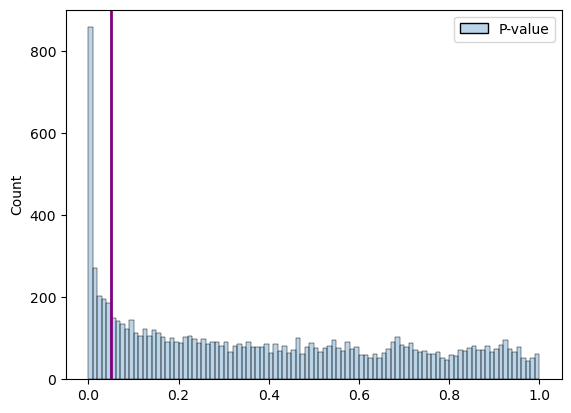

In [185]:
wtest = whitneyu_test(df_normo, df_hypo)
w_test_df = pd.DataFrame(wtest, columns = ['Gene', 'P-value']).set_index('Gene')

#plot
sns.histplot(w_test_df, bins = 100, alpha = 0.3, color = 'forestgreen')
plt.axvline(x= 0.05, color = 'purple', linewidth = 2)

In [186]:
significant_genes = w_test_df[w_test_df['P-value'] <= 0.05]
top_15 = w_test_df.sort_values(by = 'P-value').iloc[:15, :]
top_15

,P-value
Gene,
CA9,1.548012e-32
ANGPTL4,5.527006e-32
NDRG1,6.695692e-32
EGLN3,8.133323e-32
BNIP3P1,2.672800e-26
KCTD11,3.891886e-25
LOXL2,4.807956e-25
ASB2,6.391086e-24
ENO2,3.995859e-23


In distinguishing between hypoxic and normoxic cells, the top five biologically relevant genes are:

- **CA9 (Carbonic Anhydrase IX)**: CA9 is one of the most responsive genes to low oxygen conditions, from anoxia to moderate hypoxia. This gene is regulated through HIF-1 binding, meaning it plays a significant role in cells' response to hypoxic conditions[$^1$](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6647366/).

- **ANGPTL4 (Angiopoietin-like protein 4)**: ANGPTL4 is induced by hypoxia and plays roles in multiple cellular processes such as glucose and lipid metabolism, inflammation, angiogenesis, and tumorigenesis. It can serve as a diagnostic or prognostic marker for various cancers, highlighting its importance in the cellular response to hypoxia[$^2$](https://pubmed.ncbi.nlm.nih.gov/28560449/)​.

- **NDRG1 (N-myc downstream regulated gene 1)**: NDRG1 functions as a molecular switch for cellular adaptation to hypoxia. This gene is essential for cell survival in low oxygen conditions and is implicated in a number of disease conditions, underscoring its biological significance in hypoxia adaptation​[$^3$](https://pubmed.ncbi.nlm.nih.gov/36214665/)​.

- **EGLN3 (EGLN family prolyl hydroxylase)**: EGLN3 is induced by hypoxia at the transcriptional level in a HIF-dependent manner. This gene is part of a family of enzymes that are important in the cellular response to oxygen deprivation​[$^4$](https://www.nature.com/articles/s41388-022-02378-8).

- **BNIP3P1 (BCL2/adenovirus E1B interacting protein 3 pseudogene 1)**: While the exact role of BNIP3P1 is not entirely clear, it's worth noting that genes in the same family, BNIP3 and BNIP3L, play crucial roles in hypoxia-induced autophagy. They contribute to cell survival in hypoxic conditions rather than promoting cell death, and their combined action is necessary for hypoxia-mediated autophagy. The increased expression of BNIP3P1 observed in our study thus warrants further exploration of its potential function in the hypoxic response ​[$^5$](https://pubmed.ncbi.nlm.nih.gov/19273585/)$^,$[$^6$](https://pubmed.ncbi.nlm.nih.gov/35187800/).

### Normalisation and Scaling

Now after dealing mainly with removing genes and cells we are going to perform some operations in order to enhance the visual appearance of the data, here there are two types of normalisation we can perform:

 __1)__ *Scaling and log transformation*: this normalization approach is commonly used in bulk RNA sequencing, where the cells exhibit similar distributions. To achieve this, we multiply the gene expression values by a scaling factor tha aligns the counts across all cells, ensuring that they have a consistent count scale. Subsequently, we apply a logarithmic function to the entire dataset to compress the dynamic range of the expression values.

 __2)__ *Mean subtraction and log transformation*: Tnis normalization method is more suitable for sc-RNA sequencing data, where cells exhibit diverse distributions. Instead of modifying he distribution significantly, which may result in the loss of important information, we perform a log transformation to reduce the scale of the data. Additionally, we center the data by subtracting the mean expression value.

#### First Normalization Approach

We are going to scale by the median to ensure that all the genes reflect a comparable count scale:

In [187]:
def scale(data):
    total_genes_per_cell = data.sum(axis = 0)
    median = np.median(total_genes_per_cell)
    scaling_factor = median / total_genes_per_cell
    data_scaled = data.mul(scaling_factor, axis = 1)
    return data_scaled
H_Filtered_Scaled = scale(H_Smart_gf2)

By analizing the count depth, we observe that our scaling transformation successfully achieved the desired outcome of ensuring that all cells acheve the same count depth, indicating that the scaling process effectibely standardized the gene expression values across cells, aligning them to a commoun count scale.

To scale the wide range of values in our dataset, we will apply a logarithmic transformation.

In [188]:
H_Filtered_Scaled_log = H_Filtered_Scaled.applymap(lambda x: np.log(1+x))

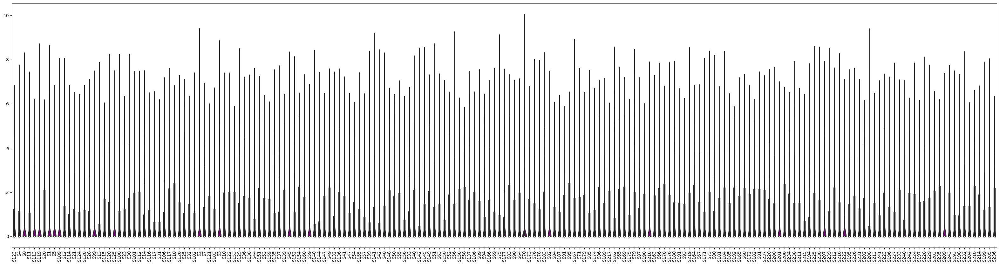

In [190]:
plt.figure(figsize=(40,10))
plot=sns.violinplot(data=H_Filtered_Scaled_log, color="purple",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.show()

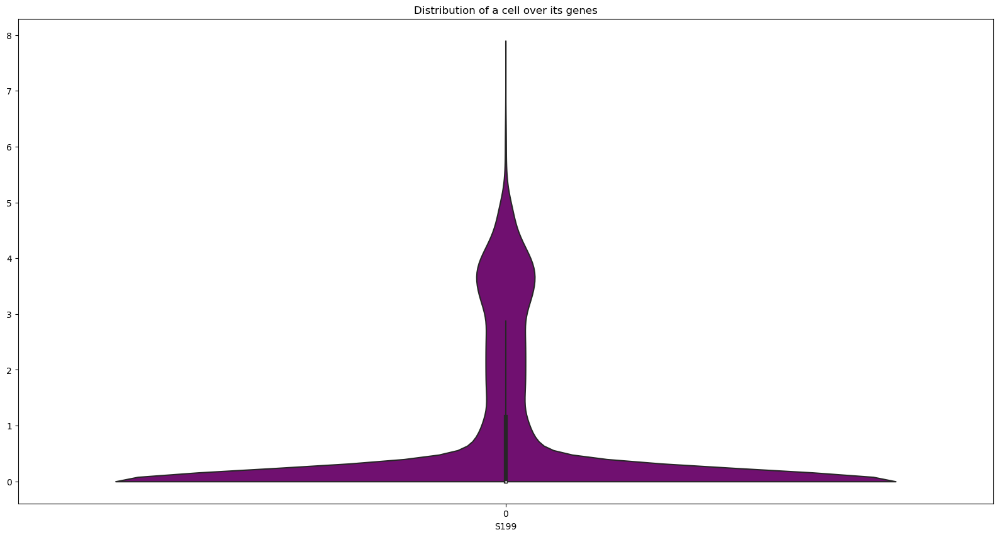

In [192]:
random_cell = np.random.randint(H_Filtered_Scaled_log.shape[1])
plt.figure(figsize = (20,10))
plot = sns.violinplot(data = H_Filtered_Scaled_log.iloc[:,random_cell], color = 'purple', cut = 0, fit = norm)
plot.set_xlabel(H_Filtered_Scaled_log.columns[random_cell])
plot.set_title('Distribution of a cell over its genes')
plt.show()

Differently from what we have seen in the unfiltered case, where the kernel density estimator exhibited a pronounced peak at zero and a significantly lower probability for non-zero values, the current filtered dataset displays a more balanced distribution. While the peak at zero remains, indicating the presence of a substantial number of genes with no expression, the probability distribution for non-zero values has noticeably increased, demonstrating a non-negligible probability.

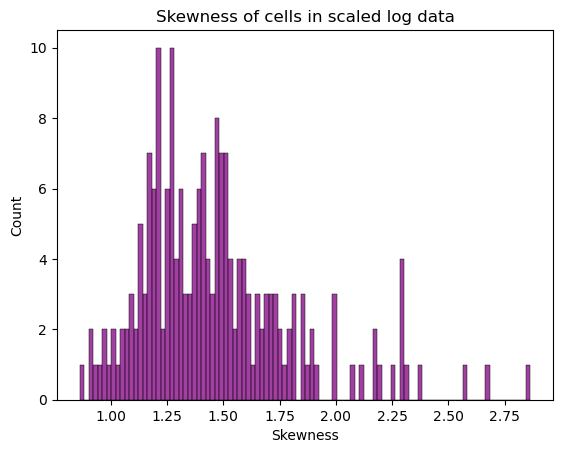

In [195]:
# Skewness
colN = np.shape(H_Filtered_Scaled_log)[1]
df_skew_cells = []
for i in range(colN) :     
    v_df = H_Filtered_Scaled_log[H_Filtered_Scaled_log.columns[i]]
    df_skew_cells += [skew(v_df)]   
df_skew_cells
sns.histplot(df_skew_cells,bins=100, legend = False, color = 'purple')
plt.xlabel('Skewness')
plt.ylabel('Count')
plt.title('Skewness of cells in scaled log data')
plt.show()

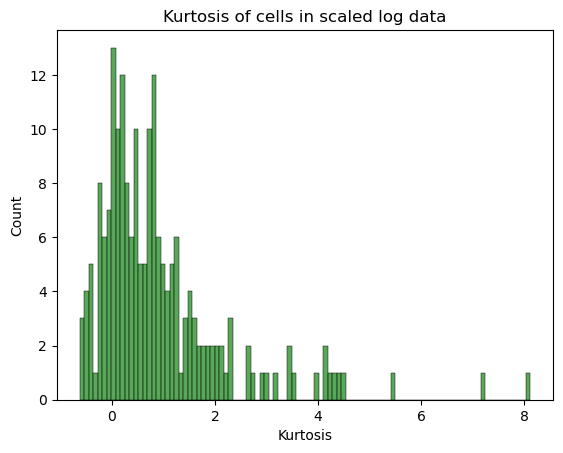

In [194]:
df_kurt_cells = []
for i in range(colN) :     
    v_df = H_Filtered_Scaled_log[H_Filtered_Scaled_log.columns[i]]
    df_kurt_cells += [kurtosis(v_df)]   
df_kurt_cells
sns.histplot(df_kurt_cells,bins=100, color = 'forestgreen')
plt.xlabel('Kurtosis')
plt.ylabel('Count')
plt.title('Kurtosis of cells in scaled log data')
plt.show()

Upon comparing the kurtosis and skewness values between the unfiltered data and the transformed dataset, we observe a significant reduction in both measures. This indicates that the series of transformations we applied have effectibely altered the distribution of the data, making it more closely resemble a normal distribution.

We are going to see also how our three main metrics __Count Depth__, __UMI Counts__, __Fraction of mithocondrial genes__ and how they changed

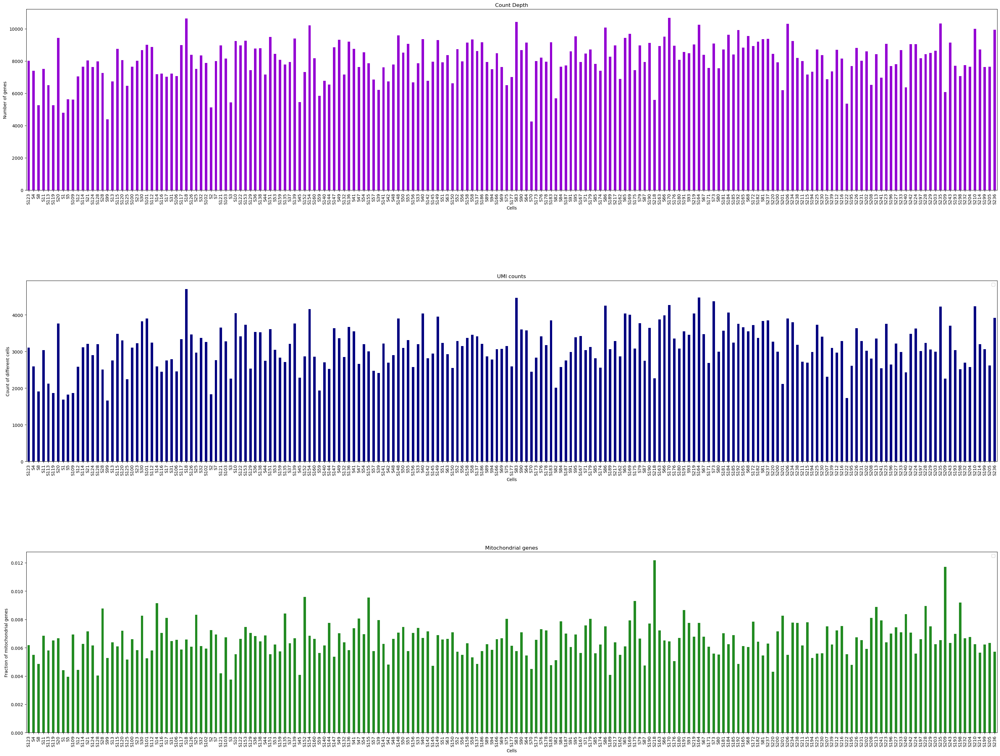

In [197]:
fig, axs = plt.subplots(3, 1, figsize=(40, 30))

# Plot 1: Count Depth
H_Filtered_Scaled_log.sum().plot(kind = 'bar', ax = axs[0], color = 'darkviolet')
axs[0].set_title('Count Depth')
axs[0].set_xlabel('Cells')
axs[0].set_ylabel('Number of genes')

# Plot 2: UMI Counts

UMI = {}
for x in H_Filtered_Scaled_log.columns:
    UMI[f'{x}'] = 0
for x in H_Filtered_Scaled_log.columns:
    temp = H_Filtered_Scaled_log[x][H_Filtered_Scaled_log[x] != 0]
    UMI[f'{x}'] = len(temp)
UMI_df = pd.Series(UMI)
UMI_df.plot(kind='bar', color='navy', ax=axs[1])
axs[1].set_title('UMI counts')
axs[1].set_xlabel('Cells')
axs[1].set_ylabel('Count of different cells')
axs[1].legend([])

# Plot 3: Mitochondrial genes
mt_genes = []
for i in H_Filtered_Scaled_log.index.tolist():
    if i[:2] == 'MT':
        mt_genes.append(i)
d = {}
for i in H_Filtered_Scaled_log.columns:
    counter = 0
    for j in H_Filtered_Scaled_log[i].index.tolist():
        if j in mt_genes:
            counter += H_Filtered_Scaled_log.loc[j, i]
    d[i] = counter / H_Filtered_Scaled_log[i].sum()
mt = pd.Series(d)
mt.plot(kind='bar', color='forestgreen', ax=axs[2])
axs[2].set_title('Mitochondrial genes')
axs[2].set_xlabel('Cells')
axs[2].set_ylabel('Fraction of mitochondrial genes')
axs[2].legend([])


plt.subplots_adjust(hspace=0.5)

plt.show()


Regarding Count Depth, UMI counts and Mithocondrial genes there is a big difference with unfiltered data:

- Count Depth appears now to be more uniform across cells after scaling by the median. This normalization technique ensures that each cell has more or less the same count.

- Secondly, the UMI counts metric also exhibits greater uniformity among cells. This result is achieved through the combined effect of cell and gene filtering steps, in which cells with low expression counts and genes with low expression in cells were removed. In conclusion, the extreme variations in UMI counts were eliminated.

- Lastly, the fraction of mithocondrial genes shows a more uniform distribution, similar to the other metrics. This outcome is a result of the filtering process, where cells exceeding the 5% threshold of mitochondrial genes are removed.

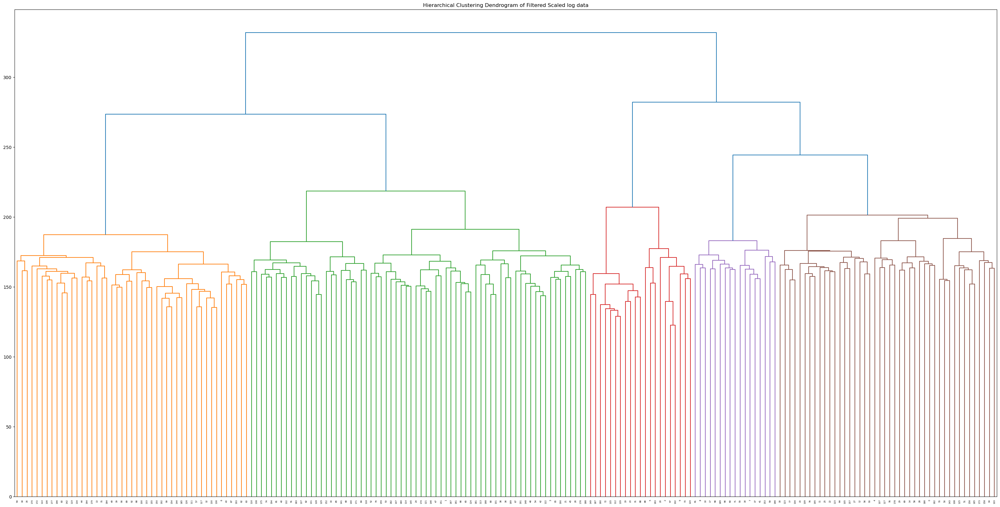

In [198]:
Z2 = linkage(H_Filtered_Scaled_log.T, method='ward')
plt.figure(figsize=(40, 20))
plt.title("Hierarchical Clustering Dendrogram of Filtered Scaled log data")
dendrogram(Z2);

The hierarchical clustering on the filtered, scaled, and logarithmically transformed data reveals the presence of five distinct clusters. While the clustering may not exhibit highly defined or natural clusters, we can observe than the dendogram at the begininng splits into two relatively balanced branches, indicating a potential division in the data.

Although the clustering result may not be considered perfect, it can still be satisfactory given the available information and the analysis performed.

#### Second Approach

As previously mentioned, this approach consists in applying a logarithmic function to reduce the scale of the samples and then scale by the mean.

In [199]:
H_Filtered_log = H_Smart_gf2.applymap(lambda x: np.log(1 + x))
mean_values = H_Filtered_log.mean()
H_Filtered_log_mean = H_Filtered_log - mean_values

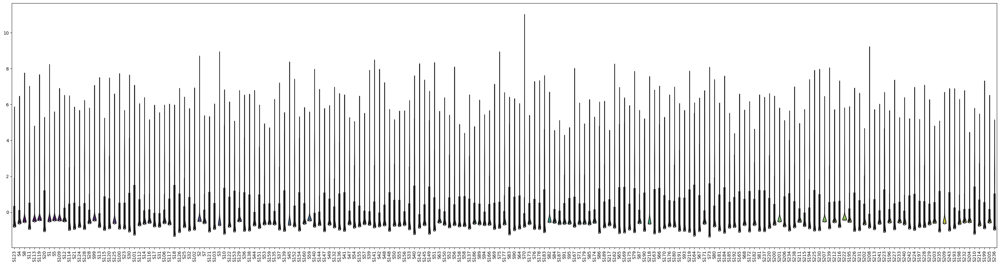

In [200]:
plt.figure(figsize=(40,10))
plot=sns.violinplot(data= H_Filtered_log_mean, palette="viridis",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.show()

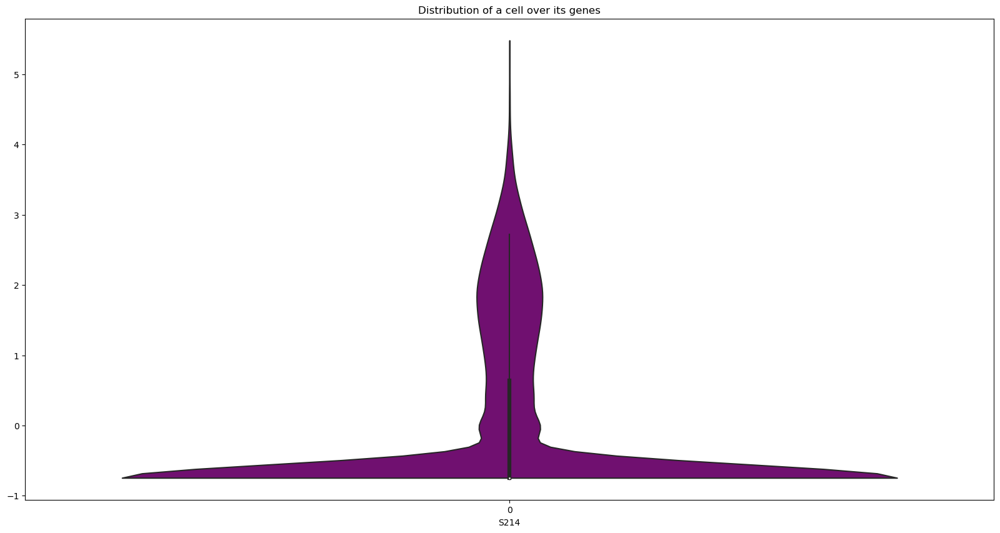

In [201]:
random_cell = np.random.randint(H_Filtered_log_mean.shape[1])
plt.figure(figsize = (20,10))
plot = sns.violinplot(data = H_Filtered_log_mean.iloc[:,random_cell], color = 'purple', cut = 0, fit = norm)
plot.set_xlabel(H_Filtered_Scaled_log.columns[random_cell])
plot.set_title('Distribution of a cell over its genes')
plt.show()

This results does not vary much from the results we observed in the previous violin plots: the distribution has a significantly high distribution of non-zero values; however, in this case, since we performed a scale by the mean, negative values can be recorded.

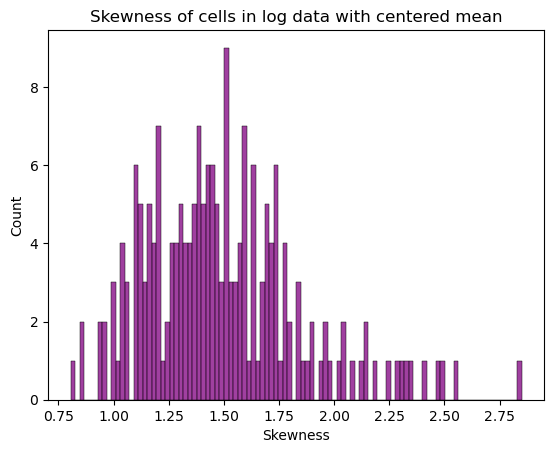

In [203]:
colN = np.shape(H_Filtered_log_mean)[1]
colN
df_skew_cells = []
for i in range(colN) :     
    v_df = H_Filtered_log_mean[H_Filtered_log_mean.columns[i]]
    df_skew_cells += [skew(v_df)]   
df_skew_cells
sns.histplot(df_skew_cells,bins=100, legend = False, color = 'purple')
plt.xlabel('Skewness')
plt.ylabel('Count')
plt.title('Skewness of cells in log data with centered mean')
plt.show()

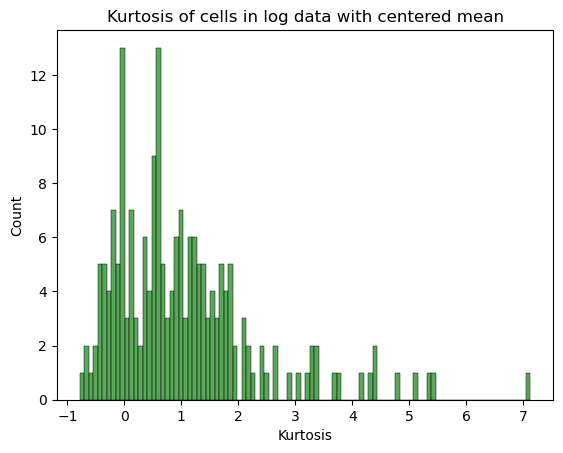

In [204]:
df_kurt_cells = []
for i in range(colN) :     
    v_df = H_Filtered_log_mean[H_Filtered_log_mean.columns[i]]
    df_kurt_cells += [kurtosis(v_df)]   
df_kurt_cells
sns.histplot(df_kurt_cells,bins=100, color = 'forestgreen')
plt.xlabel('Kurtosis')
plt.ylabel('Count')
plt.title('Kurtosis of cells in log data with centered mean')
plt.show()

The skewness is more or less the same as the previous normalisation and indeed more symmetric than the unfiltered data.
On the other hand, the kurtosis takes also negative values so some cells have lighter tails than a normal distribution and beside of these they are very similar

Let us plot the 3 metrics as before

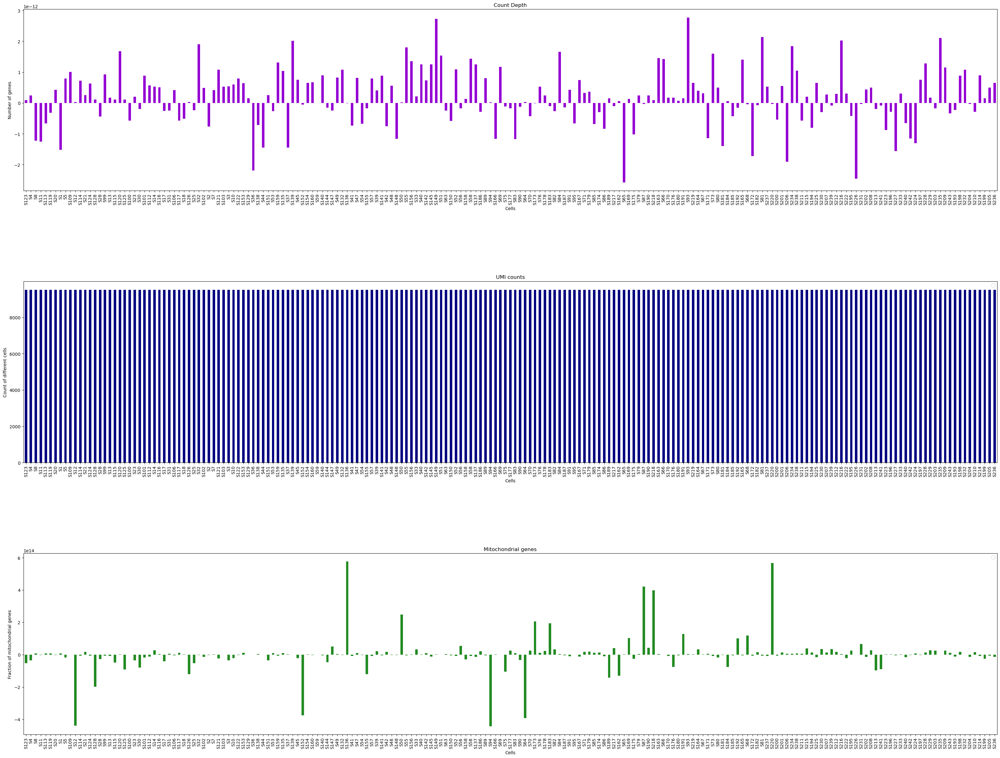

In [205]:
fig, axs = plt.subplots(3, 1, figsize=(40, 30))

# Plot 1: Count Depth
H_Filtered_log_mean.sum().plot(kind = 'bar', ax = axs[0], color = 'darkviolet')
axs[0].set_title('Count Depth')
axs[0].set_xlabel('Cells')
axs[0].set_ylabel('Number of genes')

# Plot 2: UMI Counts

UMI = {}
for x in H_Filtered_log_mean.columns:
    UMI[f'{x}'] = 0
for x in H_Filtered_log_mean.columns:
    temp = H_Filtered_log_mean[x][H_Filtered_log_mean[x] != 0]
    UMI[f'{x}'] = len(temp)
UMI_df = pd.Series(UMI)
UMI_df.plot(kind='bar', color='navy', ax=axs[1])
axs[1].set_title('UMI counts')
axs[1].set_xlabel('Cells')
axs[1].set_ylabel('Count of different cells')
axs[1].legend([])

# Plot 3: Mitochondrial genes
mt_genes = []
for i in H_Filtered_log_mean.index.tolist():
    if i[:2] == 'MT':
        mt_genes.append(i)
d = {}
for i in H_Filtered_log_mean.columns:
    counter = 0
    for j in H_Filtered_log_mean[i].index.tolist():
        if j in mt_genes:
            counter += H_Filtered_log_mean.loc[j, i]
    d[i] = counter / H_Filtered_log_mean[i].sum()
mt = pd.Series(d)
mt.plot(kind='bar', color='forestgreen', ax=axs[2])
axs[2].set_title('Mitochondrial genes')
axs[2].set_xlabel('Cells')
axs[2].set_ylabel('Fraction of mitochondrial genes')
axs[2].legend([])


plt.subplots_adjust(hspace=0.5)

plt.show()


Due to the nature of subtracting the mean from the data, the plots displaying the three metrics may become less meaningful. This is because the subtraction of the mean can result in negative values, which can affect the interpretation and reliability of these metrics.Consequently, it is not advisable to solely rely on these metrics or drawing conclusions or making assessments.

Instead, it would be more appropriate to evaluate the performance of the model to assess the effectiveness of the applied transformations and their impact on the data.

__HIERARCHICAL CLUSTERING, AGAIN__

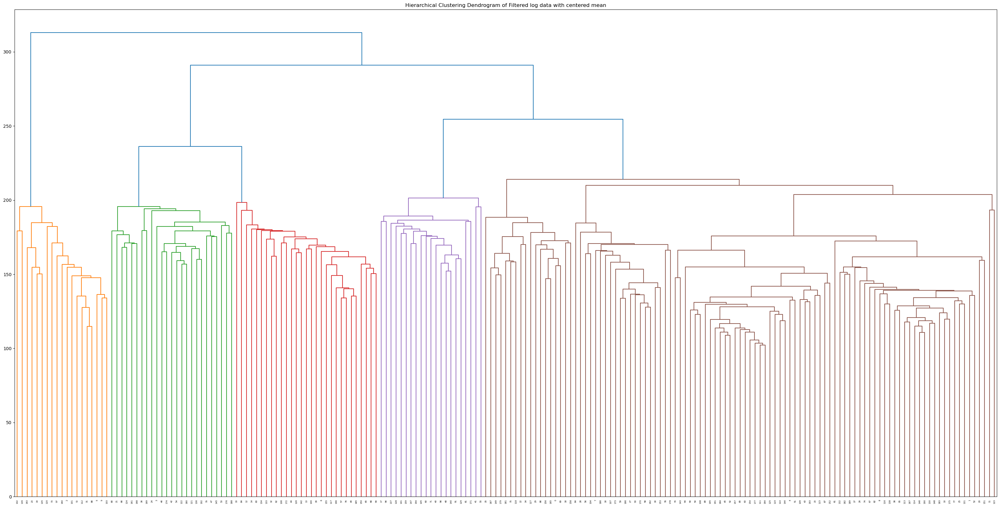

In [206]:
Z3 = linkage(H_Filtered_log_mean.T, method='ward')
plt.figure(figsize=(40, 20))
plt.title("Hierarchical Clustering Dendrogram of Filtered log data with centered mean")
dendrogram(Z3);

Here we get a less surprising result, since the red cluster appears significantly different from the other clusters. However, it is important to note that the rpesence of negative values resulting from the data transformations may introduce biases in the clustering analysis. As a result, the interpretation of the clusters based solely on visual examination of the plots shoul be approached with caution.

# MODEL FOR OUR DATA

We will begin by uploading the data we obtained from the previous analysis. We will then proceed with a visual analysis of both datasets, one with the log_and_mean criterion and the other with the scaling using logarithms only. This visual analysis will help us determine which dataset is best suited for classification purposes.

In [212]:
log_mean_df = pd.read_csv(r'C:\Users\marti\OneDrive\AI_Lab\log_and_mean_centering.csv', index_col = False)
scaled_log_df = pd.read_csv(r'C:\Users\marti\OneDrive\AI_Lab\scaled_log.csv')
labels = pd.read_csv(r'C:\Users\marti\OneDrive\AI_Lab\label.csv')

log_mean_df.set_index('Unnamed: 0', inplace = True)
scaled_log_df.set_index('Unnamed: 0', inplace = True)
labels.set_index('Cell name', inplace=True)

log_mean_df = log_mean_df.T.join(labels['Condition'])
scaled_log_df = scaled_log_df.T.join(labels['Condition'])

target = pd.DataFrame({'Normo': [0], 'Hypo': [1]}).T
temp = scaled_log_df.set_index('Condition')
scaled_log_df = temp.join(target)
scaled_log_df.set_index([0], inplace= True)

target = pd.DataFrame({'Normo': [0], 'Hypo': [1]}).T
temp = log_mean_df.set_index('Condition')
log_mean_df = temp.join(target)
log_mean_df.set_index([0], inplace= True)



In [213]:
log_mean_df.head()

,DDX11L17,WASH9P,OR4F29,MTCO2P12,MTATP8P1,LINC01409,FAM87B,LINC01128,LINC00115,KLHL17,...,C21orf58,DIP2A-IT1,DSTNP1,MT-TF,MT-TI,MT-TQ,MT-TM,MT-TD,MT-TR,MAFIP
0,,,,,,,,,,,,,,,,,,,,,
1,-0.620925,-0.620925,-0.620925,-0.620925,-0.620925,-0.620925,-0.620925,-0.620925,-0.620925,2.423598,...,2.087125,-0.620925,-0.620925,-0.620925,0.072222,0.072222,0.988513,0.072222,-0.620925,-0.620925
1,0.138874,-0.554273,-0.554273,-0.554273,-0.554273,-0.554273,-0.554273,-0.554273,-0.554273,-0.554273,...,-0.554273,-0.554273,-0.554273,-0.554273,0.544339,0.544339,-0.554273,-0.554273,-0.554273,1.748312
1,-0.921032,-0.921032,-0.921032,0.870727,-0.921032,-0.921032,-0.921032,-0.921032,-0.921032,-0.921032,...,2.689886,-0.921032,1.276192,-0.227885,-0.227885,0.465262,0.465262,-0.227885,0.177580,0.688406
1,1.679592,-0.517633,0.580980,-0.517633,-0.517633,-0.517633,-0.517633,2.978875,-0.517633,-0.517633,...,2.740464,-0.517633,-0.517633,-0.517633,-0.517633,0.175514,0.868662,-0.517633,-0.517633,-0.517633
1,0.635405,-0.463208,0.229940,-0.463208,-0.463208,-0.463208,-0.463208,2.714846,-0.463208,-0.463208,...,-0.463208,0.229940,-0.463208,-0.463208,-0.463208,-0.463208,0.229940,0.229940,-0.463208,-0.463208


In [214]:
scaled_log_df.head()

,DDX11L17,WASH9P,OR4F29,MTCO2P12,MTATP8P1,LINC01409,FAM87B,LINC01128,LINC00115,KLHL17,...,C21orf58,DIP2A-IT1,DSTNP1,MT-TF,MT-TI,MT-TQ,MT-TM,MT-TD,MT-TR,MAFIP
0,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,3.689836,...,3.343809,0.000000,0.00000,0.000000,1.082454,1.082454,2.175622,1.082454,0.000000,0.000000
1,0.688529,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.000000,0.00000,0.000000,1.092450,1.092450,0.000000,0.000000,0.000000,2.294257
1,0.000000,0.0,0.000000,1.395962,0.0,0.0,0.0,0.000000,0.0,0.000000,...,3.130254,0.000000,1.76852,0.474849,0.474849,1.037912,1.037912,0.474849,0.795498,1.232877
1,2.113767,0.0,1.036681,0.000000,0.0,0.0,0.0,3.405106,0.0,0.000000,...,3.167500,0.000000,0.00000,0.000000,0.000000,0.647062,1.316345,0.000000,0.000000,0.000000
1,1.673464,0.0,1.152248,0.000000,0.0,0.0,0.0,3.927934,0.0,0.000000,...,0.000000,1.152248,0.00000,0.000000,0.000000,0.000000,1.152248,1.152248,0.000000,0.000000


## UNSUPERVISED LEARNING ANALYSIS

As an initial step to explore the data and gain valuable insights, we will conduct Principal Component Analysis (PCA) in two dimensions. This technique will allow us to visualize the patterns and structures present in the datasets. By plotting both datasets along with their corresponding labels, we aim to identify any discernible separability or clusters that may exist within the data. This analysis will assist us in determining if there are distinct patterns that can aid us in classification tasks.

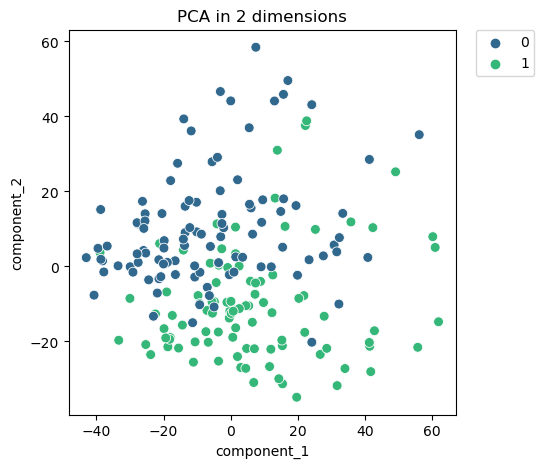

In [223]:
pipe = PCA(n_components=2, random_state=42)

preprocessed_data = pipe.fit_transform(scaled_log_df)


#Plot
pcadf = pd.DataFrame(preprocessed_data,columns=["component_1", "component_2"])

pcadf["true_label"] = scaled_log_df.index

plt.style.use("default")
plt.figure(figsize=(5, 5))
scat = sns.scatterplot(x = 'component_1', y = 'component_2', s=50, data=pcadf, hue="true_label", palette="viridis")
scat.set_title("PCA in 2 dimensions")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show() 

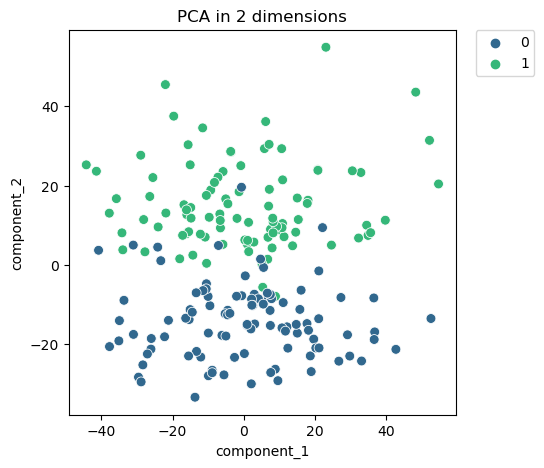

In [224]:
pipe = PCA(n_components=2, random_state=42)

preprocessed_data = pipe.fit_transform(log_mean_df)


#Plot
pcadf = pd.DataFrame(preprocessed_data,columns=["component_1", "component_2"])

pcadf["true_label"] = log_mean_df.index

plt.figure(figsize=(5, 5))
scat = sns.scatterplot(x = 'component_1', y = 'component_2', s=50, data=pcadf, hue="true_label", palette="viridis")
scat.set_title("PCA in 2 dimensions")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show() 


Upon performing PCA in two dimensions, we observed that the first dataset does not exhibit any distinct separation patterns. This lack of separation could be attributed to the dataset not being standardized with the mean. However, in the case of the second dataset, we noticed a clear pattern of **linear separability**. Specifically, the Normo and Hypo cells are distinctly divided, with only a few outliers present. This observation suggests that the second dataset holds promise for effective classification tasks due to its discernible separation pattern.

We thus look also at the cells using 3 components.

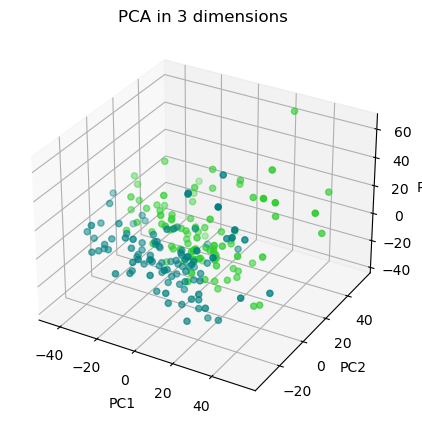

In [225]:
pipe = PCA(n_components=3, random_state=42)
preprocessed_data = pipe.fit_transform(log_mean_df)

#Plot

fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')
for condition, color in zip(log_mean_df.index.unique(), ['limegreen', 'teal']):
    idx = log_mean_df.index == condition
    ax.scatter(preprocessed_data[idx, 0], preprocessed_data[idx, 1], preprocessed_data[idx, 2], c=color, label=condition)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('PCA in 3 dimensions')

plt.show()

Based on the clear separation pattern observed in the second dataset, we have made the decision to proceed with it for further analysis. To understand how the data is divided, we will employ a **clustering** algorithm with two clusters. Specifically, we will utilize Agglomerative Clustering with complete linkage and the Manhattan metric. Clustering will help us understand how recognizible the labels are in practice without any previous knowledge about them.

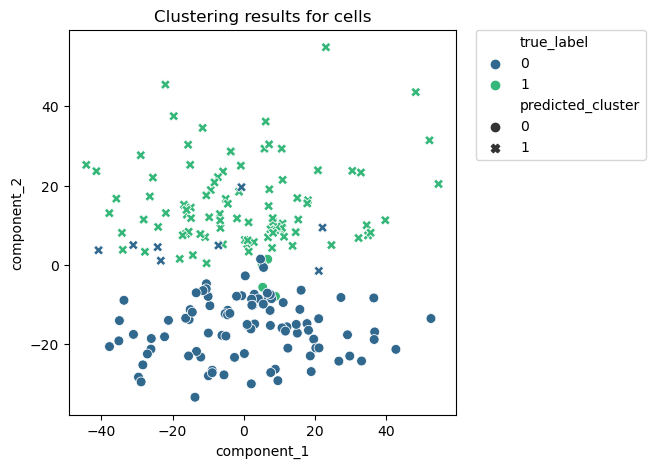

In [226]:
k_dataset = log_mean_df

preprocessor = PCA(n_components=2, random_state=42)

clusterer = Pipeline([("kmeans", AgglomerativeClustering(n_clusters=2, linkage = 'complete', metric = 'manhattan'))])

pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(k_dataset)
preprocessed_data = pipe["preprocessor"].transform(k_dataset)
predicted_labels = 1 - pipe["clusterer"]["kmeans"].labels_
true_labels = k_dataset.index 

#Plot
pcadf = pd.DataFrame(pipe["preprocessor"].transform(k_dataset),columns=["component_1", "component_2"])

pcadf["predicted_cluster"] = predicted_labels
pcadf["true_label"] = true_labels

plt.figure(figsize=(5, 5))
scat = sns.scatterplot(x = 'component_1', y = 'component_2', s=50, data=pcadf, hue="true_label", style="predicted_cluster",palette="viridis")
scat.set_title("Clustering results for cells")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2,  borderaxespad=0.0)
plt.show() 

This is quite impressive: our clustering classified almost perfectly all the cells.

We also look at the accuracy score of the Agglomerative clustering to gain more precise metrics. 

In [222]:
accuracy_score(pcadf['true_label'], pcadf['predicted_cluster'])

0.9390862944162437

Remarkably, with just the application of clustering algorithms using two principal components, we have achieved an impressive classification accuracy of $\approx 94\%$. This outcome demonstrates the **inherent separability and distinguishable patterns** present within the dataset. By leveraging the power of clustering, we have successfully identified and grouped the data points in a manner that aligns closely with the true labels. This outcome underscores the strong discriminatory characteristics within the dataset, allowing for accurate classification even with minimal information.

This suggests that lot of information are contained in few important genes. 
To determine the number of principal components required to explain 95% of the variance in the dataset, we will perform a PCA analysis. We expect this dimension will be significantly lower than the original dimension of our dataset. 

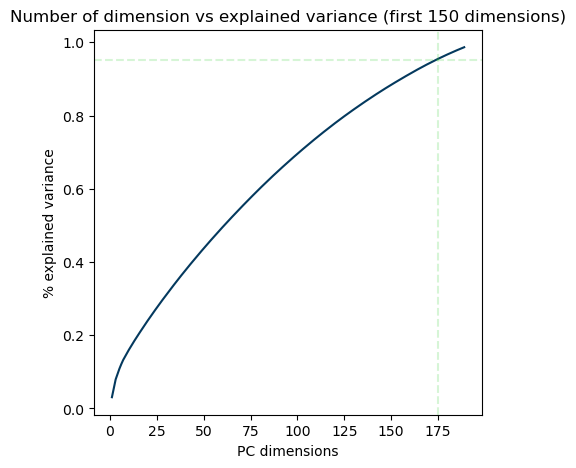

In [227]:
x_pca = []
y_pca = []
a = True
for i in range(1,190):
    pca = PCA(n_components=i, svd_solver = 'full')
    pca_result = pca.fit_transform(log_mean_df)
    x_pca.append(i)
    y_pca.append(pca.explained_variance_ratio_.sum())
fig, ax = plt.subplots(1, figsize=(5,5))

data = pd.DataFrame({
    
    'PC dimensions': x_pca,
    '% explained variance': y_pca
})

sns.lineplot(data=data, x='PC dimensions', y='% explained variance', ax=ax, color = '#04395E')
plt.axvline(x=175, color='limegreen', linestyle='--', alpha = 0.2)
plt.axhline(y=0.9508157355962453, color='limegreen', linestyle='--', alpha = 0.2)

ax.set_title('Number of dimension vs explained variance (first 150 dimensions)')

plt.show()

Impressively, the PCA analysis reveals that we only require **175 principal components** to explain 95% of the variance in the dataset. Considering that the original dataset consisted of nearly 10,000 features, this reduction is highly significant. It indicates that we can effectively capture the essential information with a considerably smaller feature set, leading to enhanced efficiency and computational performance.

To preserve these important components for future analysis, we will save the transformed dataframe. This will enable us to compare the performance of our classifier on the complete dataset versus the reduced dataset. Such a comparison will allow us to assess the impact of dimensionality reduction on classification accuracy and potentially uncover any improvements gained from utilizing a reduced feature space.

In [228]:
pipe = PCA(n_components=175, random_state=42)

preprocessed_data = pipe.fit_transform(log_mean_df)

#Plot
pcadf = pd.DataFrame(preprocessed_data)

pcadf["true_label"] = log_mean_df.index

pcadf.set_index("true_label", inplace = True)
pcadf

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
true_label,,,,,,,,,,,,,,,,,,,,,
1,0.962692,5.231543,-14.155139,3.840035,-14.940994,-14.564328,14.718075,-7.491317,5.269369,-1.142132,...,-5.961566,-0.392383,5.200690,-6.646728,-10.589341,-2.859760,-6.064934,-2.592688,-0.994372,5.323559
1,52.151008,31.430537,4.498231,4.049625,1.064632,-5.853009,21.913842,-6.861485,-13.361533,-1.090423,...,0.324911,0.506792,1.358075,2.348563,0.318519,1.279852,5.125902,1.990882,-0.891389,2.583927
1,-9.738035,12.012388,-1.495742,0.775028,-29.889254,22.762295,8.425296,8.607963,7.096413,20.018429,...,-0.510999,2.120077,-2.478407,0.054196,0.003741,2.024505,-0.824480,1.357065,0.764387,0.955908
1,10.862382,10.430442,-36.099757,8.437602,-16.332751,-12.874535,14.357779,0.611470,3.099180,-8.453487,...,-0.536031,1.996279,-0.072826,-3.186667,1.458440,-3.180844,-0.840788,-1.354318,0.136751,0.106143
1,15.290039,11.436769,-28.681119,-9.996548,-1.280457,-8.713127,5.457373,-3.122674,4.393358,-3.889854,...,-7.938023,5.364352,1.731742,3.018310,3.641144,-1.349306,-6.644473,-5.412445,9.468888,0.551855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,2.247701,-10.188355,-2.473914,-10.871130,-9.772319,-13.634096,6.703722,-9.991245,-4.600410,-0.131346,...,8.561964,4.613611,-6.630280,-7.304093,-19.172097,-13.929491,-17.249690,7.889787,-5.370012,-4.802503
0,-33.687925,-8.954735,22.868723,-6.982392,1.937430,4.240745,10.789240,-2.336619,7.188888,8.124489,...,1.731812,0.820602,1.810733,0.788486,-1.370114,1.556318,-2.274760,-0.334841,0.984749,-2.139395
0,-13.397524,-7.061122,-10.881664,-17.257769,13.571037,-3.832316,9.535070,-2.044857,-0.723982,-7.276656,...,18.008331,16.213082,3.697997,6.158550,7.452212,-1.607394,13.498858,0.800144,3.415102,2.525905


## SUPERVISED LEARNING 

## *On the whole dataset*
Moving forward, we will proceed with supervised learning using the second dataset, namely the **log_mean_dataset**, as it exhibited a clearer pattern during our analysis. Given that we are dealing with a binary classification problem, having linearly separable features is a significant advantage. While we considered various classifiers, including non-linear models and neural networks, we found that linear classifiers consistently achieved comparable accuracy without being surpassed by the more complex models. We are going to show only the latter in the next analysis to unburden the discussion.

Indeed, it is prudent to prioritize simpler models that offer better generalization and are less prone to overfitting. By opting for linear classifiers, we can strike a **balance between accuracy and model complexity**, ensuring robust and reliable classification performance on our dataset.

We will proceed forstly with **Random Forests** and then with **Support Vector Machines**.

## RANDOM FOREST

We will firstly perform Random Forest with standard hyperparameters to gain insight on its accuracy on the dataset. 

In [229]:
data = log_mean_df
X_train, X_test, y_train, y_test = model_selection.train_test_split(log_mean_df, log_mean_df.index, train_size=0.80, test_size=0.20, random_state=101)

model = RandomForestClassifier(random_state = 101)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.95

Although the accuracy achieved by Random Forest is already quite high, we will further optimize our model by performing a **Randomized Search**. The goal of this search is to **fine-tune** the hyperparameters of the model in order to potentially improve its performance even further. By exploring a range of hyperparameter values using a randomized approach, we can identify the optimal configuration that maximizes the classification score.

In [619]:
rs_space={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators': [1, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500 ],
              'max_features':['sqrt', 'auto'],
              'criterion':['gini','entropy'],
              'min_samples_leaf':np.arange(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
          }
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)
# Define random search
random_search = RandomizedSearchCV(estimator=RandomForestClassifier(random_state = 101), 
                           param_distributions=rs_space, 
                           n_iter=100,
                           refit='accuracy', 
                           n_jobs=-1, 
                           cv=kfold, 
                           verbose=0)
# Fit grid search
rand = random_search.fit(X_train, y_train)
random_estimator, random_parameters = rand.best_estimator_, rand.best_params_

We look at the found estimator and parameters.

In [629]:
random_estimator

RandomForestClassifier(max_depth=10, min_samples_leaf=2, n_estimators=150,
                       random_state=101)

In [622]:
print(random_parameters)

{'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'gini'}


In [ ]:
#Save the classifier in case we run again RandomSearch
random_estimator = RandomForestClassifier(max_depth = 10, min_samples_leaf= 2, n_estimators= 150, random_state= 101).fit(X_train,y_train)

And the new accuracy score along with the mean squared error obtained by our model. 

In [233]:
print("Accuracy score:", accuracy_score(y_test, random_estimator.predict(X_test)))
print('Mean squared error:', mean_squared_error(y_test, random_estimator.predict(X_test)))

Accuracy score: 0.975
Mean squared error: 0.025


Following the Randomized Search, we observe a slight improvement in the accuracy score of our model. Upon inspecting the selected hyperparameters, we notice that the maximum depth (max_depth) parameter is set conservatively at 10. Typically, increasing this parameter can lead to higher accuracy, but it also raises the risk of overfitting the training data.

In order to strike a balance between accuracy and overfitting, we opt to maintain the max_depth at its current value. This decision allows us to achieve a respectable level of accuracy without compromising the model's ability to generalize well to unseen data.

At this point we decide to explore a clever application of Random Forest: feature selection. 

#### **FEATURE SELECTION**

Based on our findings, we have decided to proceed with a clever implementation of Random Forest by employing feature selection techniques. Random Forest provides a built-in mechanism for **assessing feature importance**, allowing us to identify the most relevant features that contribute significantly to the classification task. By leveraging this information, we can create a more streamlined and efficient model by selecting only the most informative features.

This feature selection step helps to improve the overall performance of the Random Forest classifier by **reducing the dimensionality** of the dataset and **eliminating potentially irrelevant or redundant features**. By focusing on the most important features, we can enhance the interpretability of the model, mitigate the risk of overfitting, and potentially achieve better generalization on unseen data.

We plot the feature importance scores to understand how many and which ones are the most influential in our model. 

Such information will prove valuable not only in our current modeling approach but also in future steps, particularly when we consider performing SVM (Support Vector Machine) classification. By examining the performance of SVM restricted to these influential features, we can potentially enhance the efficiency and effectiveness of our model. 

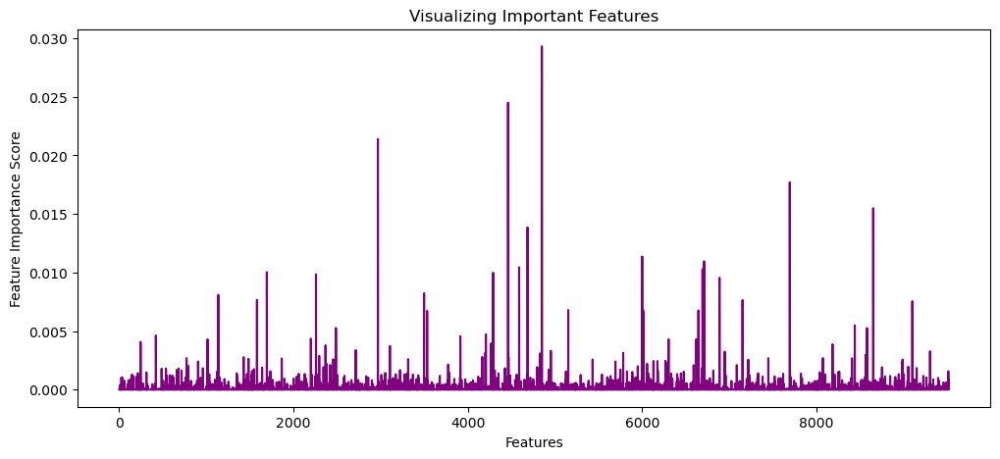

In [238]:
plt.figure(figsize = (12,5))
plt.plot(random_estimator.feature_importances_, color = 'purple')
# Add labels to the graph
plt.xlabel('Features')
plt.ylabel('Feature Importance Score')
# Add title to the graph
plt.title("Visualizing Important Features")
# Visualize the graph
plt.show()

Upon analyzing the feature importance scores, we observe that only a relatively small number of features demonstrate significant importance, while the remaining features have a feature importance score of 0. This indicates that our model's dimensionality can be drastically reduced without sacrificing performance.

This finding allows us to focus our attention on the subset of **influential genes**, which are the key contributors to the classification task. We choose to keep a threshold at 0 because all the scores are more or less near that value, and increasing the threshold would cut the dataset too much. 

In [239]:
important_features = pd.DataFrame(random_estimator.feature_importances_, index = log_mean_df.columns).rename(columns = {0: 'Important features'})
important_features = important_features[important_features['Important features'] > 0]
important_features

,Important features
KLHL17,0.000374
RN7SL657P,0.000169
TMEM52,0.000088
HES5,0.001027
TNFRSF14-AS1,0.000079
...,...
DYRK1A,0.000229
FAM3B,0.000083
GATD3A,0.000611
MT-TF,0.001565


In [240]:
top_15 = important_features.sort_values(by = 'Important features', ascending = False).iloc[:15,:]
top_15

,Important features
CA9,0.029320
LOXL2,0.024512
PPP1R3G,0.021394
KCTD11,0.017708
ANGPTL4,0.015491
NDRG1,0.013857
ENO2,0.011364
EGLN3,0.010957
PAG1,0.010453
BNIP3P1,0.010273


There is an interesting result most of the genes which were statistically relevant in the *Mann-Withney U-test* (such as **CA9**) are present here, even though not in the same order, proving the random forest's reliability in feature selection.

In [635]:
important_features.shape

(1256, 1)

Fitering only on the obtained important features, we obtain the following dataset:

In [241]:
important_genes = log_mean_df[important_features.index]
important_genes

,KLHL17,RN7SL657P,TMEM52,HES5,TNFRSF14-AS1,TP73-AS1,DFFB,AJAP1,NPHP4,KCNAB2,...,BAGE2,CYYR1,GPX1P2,SIM2,HLCS,DYRK1A,FAM3B,GATD3A,MT-TF,MAFIP
0,,,,,,,,,,,,,,,,,,,,,
1,2.423598,-0.620925,-0.620925,-0.620925,-0.620925,2.746371,-0.620925,-0.620925,4.207389,0.477687,...,-0.620925,-0.620925,-0.620925,1.458517,3.473420,0.988513,-0.620925,-0.620925,-0.620925,-0.620925
1,-0.554273,-0.554273,-0.554273,-0.554273,2.664603,-0.554273,-0.554273,-0.554273,-0.554273,1.930633,...,-0.554273,-0.554273,-0.554273,-0.554273,3.694222,1.237486,-0.554273,-0.554273,-0.554273,1.748312
1,-0.921032,-0.921032,-0.921032,-0.921032,-0.921032,1.158409,3.189842,3.998949,2.170010,-0.921032,...,0.465262,-0.921032,-0.921032,-0.921032,3.632845,1.476863,2.716554,-0.921032,-0.227885,0.688406
1,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,0.580980,-0.517633,...,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633,-0.517633
1,-0.463208,-0.463208,-0.463208,-0.463208,2.101742,-0.463208,-0.463208,-0.463208,-0.463208,-0.463208,...,0.229940,-0.463208,-0.463208,2.627835,-0.463208,-0.463208,-0.463208,-0.463208,-0.463208,-0.463208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-0.560286,-0.560286,-0.560286,-0.560286,-0.560286,-0.560286,-0.560286,-0.560286,1.519156,-0.560286,...,-0.560286,-0.560286,-0.560286,2.004664,-0.560286,-0.560286,-0.560286,-0.560286,-0.560286,0.132862
0,3.586641,-1.192482,-1.192482,0.599277,0.753428,0.193812,-1.192482,3.870113,2.208715,2.777810,...,0.193812,-1.192482,-1.192482,-1.192482,-1.192482,1.372467,-1.192482,-1.192482,1.004742,0.193812
0,-0.745941,-0.745941,1.451284,-0.745941,-0.745941,-0.745941,-0.745941,1.651954,-0.745941,-0.745941,...,-0.052794,-0.745941,-0.745941,2.472935,2.809407,1.333501,1.819008,-0.745941,-0.745941,-0.745941


This dataset will be useful in the future for performing SVM on the reduces dataset obtained by random forest. We already prepare the tests and train sets. 

In [242]:
X_train_temp, X_test_temp, y_train_temp, y_test_temp = model_selection.train_test_split(important_genes, important_genes.index, train_size=0.80, test_size=0.20, random_state=42)

## SVM

Continuing with our analysis, we will now apply **Support Vector Machine** (SVM) on our dataset. Based on the preliminary analysis conducted using PCA and clustering, we anticipate that SVM will perform exceptionally well. The presence of easily distinguishable clusters and **linearly separable datapoints** suggests that SVM will be able to identify an optimal hyperplane that accurately separates the classes.

In [657]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(log_mean_df, log_mean_df.index, train_size=0.80, test_size=0.20, random_state=42)

To explore the capabilities of Support Vector Machines (SVM), we will employ different variations of SVM models, each utilizing distinct **kernel functions**. 

In our initial approach, we will employ the **Radial Basis Function** (RBF) kernel with non-standard parameters, allowing us to investigate the impact of varying these parameters on the model's performance. This exploration will enable us to identify the most suitable configuration that maximizes the classification accuracy.

Moving forward, we will also experiment with the **polynomial** (poly) kernel, providing us with the flexibility to handle non-linear relationships within the data.

Then, we will utilize the **standard SVM** with its default kernel, RBF. 

Finally, we use **LinearSVC**, which is similar to SVC with linear kernel, but it has more flexibility in the choice of penalties and loss functions and should scale better to large numbers of samples. Also, this class supports both dense and sparse input, so it might be a good choice for our dataset. 

By incorporating multiple SVM variations, each utilizing different kernel functions, we aim to thoroughly investigate the performance and versatility of SVM in our classification task.

In [658]:
rbf = svm.SVC(kernel='rbf', gamma = 0.01, C = 10 ).fit(X_train, y_train)
poly = svm.SVC(kernel='poly', degree=3, C=1).fit(X_train, y_train)
svm_model = svm.SVC().fit(X_train, y_train)
lin = svm.LinearSVC().fit(X_train, y_train) 

#Prediction
rbf_pred = rbf.predict(X_test)
poly_pred = poly.predict(X_test)
svm_pred = svm_model.predict(X_test)
lin_pred = lin.predict(X_test)


In [661]:
poly_accuracy = accuracy_score(y_test, poly_pred)
poly_f1 = f1_score(y_test, poly_pred,)
poly_error = mean_squared_error(y_test, poly_pred)

print('Accuracy (Polynomial Kernel): ',(poly_accuracy))
print('F1 (Polynomial Kernel): ', poly_f1)
print('Mean squared error: ', poly_error)
print('---------')

rbf_accuracy = accuracy_score(y_test, rbf_pred)
rbf_f1 = f1_score(y_test, rbf_pred)
rbf_error = mean_squared_error(y_test, rbf_pred)

print('Accuracy (RBF Kernel): ',rbf_accuracy)
print('F1 (RBF Kernel): ', rbf_f1)
print('Mean squared error: ', rbf_error)
print('---------')

svm_accuracy = accuracy_score(y_test, svm_pred)
svm_f1 = f1_score(y_test, svm_pred)
svm_error = mean_squared_error(y_test, svm_pred)

print('Accuracy (SVC standard): ',svm_accuracy)
print('F1 (SVC standard): ', svm_f1)
print('Mean squared error standard: ', svm_error)
print('---------')


lin_accuracy = accuracy_score(y_test, lin_pred)
lin_f1 = f1_score(y_test, lin_pred)
lin_error = mean_squared_error(y_test, lin_pred)

print('Accuracy (Linear): ', lin_accuracy)
print('F1 (Linear): ', lin_f1)
print('Mean squared error: ', lin_error)

Accuracy (Polynomial Kernel):  0.775
F1 (Polynomial Kernel):  0.8085106382978724
Mean squared error:  0.225
---------
Accuracy (RBF Kernel):  0.475
F1 (RBF Kernel):  0.6440677966101694
Mean squared error:  0.525
---------
Accuracy (SVC standard):  0.975
F1 (SVC standard):  0.972972972972973
Mean squared error standard:  0.025
---------
Accuracy (Linear):  1.0
F1 (Linear):  1.0
Mean squared error:  0.0


After applying the Linear SVM, we obtained an impressive accuracy of 1 and a mean squared error of 0, which further reinforces our earlier analysis indicating the linearity of the data. However, to ensure that these exceptional results are not merely due to chance, it is essential to assess the model's performance using **cross-validation**.

By computing cross-validation scores, we can verify if our model is overfitting or if the high accuracy score was solely a result of a fortuitous split of the data. This evaluation technique provides a more robust and unbiased estimation of the model's generalization capabilities by validating its performance across multiple subsets of the data.

In [662]:
classifier = lin
cross_val = cross_val_score(classifier, X_train, y_train, scoring = 'accuracy', cv = 10)
print("Minimum score:", min(cross_val), "\n", 
      "Maximum score:", max(cross_val), "\n", 
      "Average score:", np.mean(cross_val))

Minimum score: 0.9333333333333333 
 Maximum score: 1.0 
 Average score: 0.9808333333333333


We see that, even if the average is slightly below the one obtained before, it is still of 0.98, a performance more than acceptable.

## *On the reduced dataset with RandomForest*

We also try to implement the model based only on the features selected by RandomForest to see how the accuracy scores change.

In [665]:
X_train_temp, X_test_temp, y_train_temp, y_test_temp = model_selection.train_test_split(important_genes, important_genes.index, train_size=0.80, test_size=0.20, random_state=42)

In [666]:
poly = svm.SVC(kernel='poly', degree=3, C=1).fit(X_train_temp, y_train_temp)
svm_model = svm.SVC().fit(X_train_temp, y_train_temp)
lin = svm.LinearSVC().fit(X_train_temp, y_train_temp) 

poly_pred = poly.predict(X_test_temp)
svm_pred = svm_model.predict(X_test_temp)
lin_pred = lin.predict(X_test_temp)


In [667]:
poly_accuracy = accuracy_score(y_test_temp, poly_pred)
poly_f1 = f1_score(y_test_temp, poly_pred,)
poly_error = mean_squared_error(y_test_temp, poly_pred)

print('Accuracy (Polynomial Kernel): ',(poly_accuracy))
print('F1 (Polynomial Kernel): ', poly_f1)
print('Mean squared error: ', poly_error)
print('---------')

svm_accuracy = accuracy_score(y_test_temp, svm_pred)
svm_f1 = f1_score(y_test_temp, svm_pred)
svm_error = mean_squared_error(y_test_temp, svm_pred)

print('Accuracy (SVC standard): ',svm_accuracy)
print('F1 (SVC standard): ', svm_f1)
print('Mean squared error standard: ', svm_error)
print('---------')

lin_accuracy = accuracy_score(y_test_temp, lin_pred)
lin_f1 = f1_score(y_test_temp, lin_pred)
lin_error = mean_squared_error(y_test_temp, lin_pred)

print('Accuracy (Linear): ', lin_accuracy)
print('F1 (Linear): ', lin_f1)
print('Mean squared error: ', lin_error)

Accuracy (Polynomial Kernel):  0.85
F1 (Polynomial Kernel):  0.8636363636363636
Mean squared error:  0.15
---------
Accuracy (SVC standard):  1.0
F1 (SVC standard):  1.0
Mean squared error standard:  0.0
---------
Accuracy (Linear):  1.0
F1 (Linear):  1.0
Mean squared error:  0.0


Upon selecting the most important features and re-evaluating the SVM models, we observed an overall **improvement in accuracy**. The SVM model with a polynomial kernel exhibited an increase of 0.1 in accuracy, while the standard SVC achieved a perfect accuracy score of 1. Interestingly, even the LinearSVC maintained its flawless performance and did not experience a decrease in accuracy.

This observation suggests that the features that were excluded during the feature selection process may have contained outliers or noise, which could have hindered the classification task. By focusing on the most informative features, we were able to enhance the model's performance and reduce the influence of potentially irrelevant or misleading information.

## *On the reduced dataset with PCA*

As a final check, we see how our model performs on the dataset with 175 components selected at the beginning with PCA.

In [673]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(pcadf, pcadf.index, train_size=0.80, test_size=0.20, random_state=42)

In [674]:
poly = svm.SVC(kernel='poly', degree=3, C=1).fit(X_train, y_train)
svm_model = svm.SVC().fit(X_train, y_train)
lin = svm.LinearSVC().fit(X_train, y_train) 

#Prediction
poly_pred = poly.predict(X_test)
svm_pred = svm_model.predict(X_test)
lin_pred = lin.predict(X_test)

In [675]:
poly_accuracy = accuracy_score(y_test, poly_pred)
poly_f1 = f1_score(y_test, poly_pred,)
poly_error = mean_squared_error(y_test, poly_pred)

print('Accuracy (Polynomial Kernel): ',(poly_accuracy))
print('F1 (Polynomial Kernel): ', poly_f1)
print('Mean squared error: ', poly_error)
print('---------')

svm_accuracy = accuracy_score(y_test, svm_pred)
svm_f1 = f1_score(y_test, svm_pred)
svm_error = mean_squared_error(y_test, svm_pred)

print('Accuracy (SVC standard): ',svm_accuracy)
print('F1 (SVC standard): ', svm_f1)
print('Mean squared error standard: ', svm_error)
print('---------')


lin_accuracy = accuracy_score(y_test, lin_pred)
lin_f1 = f1_score(y_test, lin_pred)
lin_error = mean_squared_error(y_test, lin_pred)

print('Accuracy (Linear): ', lin_accuracy)
print('F1 (Linear): ', lin_f1)
print('Mean squared error: ', lin_error)

Accuracy (Polynomial Kernel):  0.475
F1 (Polynomial Kernel):  0.6440677966101694
Mean squared error:  0.525
---------
Accuracy (SVC standard):  0.975
F1 (SVC standard):  0.972972972972973
Mean squared error standard:  0.025
---------
Accuracy (Linear):  0.975
F1 (Linear):  0.9743589743589743
Mean squared error:  0.025


We see that we experience a decrease in accuracy. This decrease can be attributed to two potential reasons:

- **Insufficient dimensions**: The reduction of dimensions from nearly 10,000 to 175 through PCA may have resulted in the loss of crucial information. This suggests that the 175 dimensions retained by PCA may not be sufficient to explain the complexity of the original dataset. As evidence, the Random Forest feature selection process identified 1,200 genes as important, indicating that a more substantial number of features may be needed for optimal classification performance.

- **Limitations of PCA**: Although PCA is a widely used technique for dimensionality reduction, its effectiveness depends on the underlying structure of the data. In some cases, particularly when dealing with high-dimensional and complex datasets, alternative dimensionality reduction methods might be more suitable.

## *CHOSEN MODEL*

In conclusion, based on our analysis of the data, we determine that the most effective model for analyzing this dataset is the **LinearSVC** with standard parameters, after applying dimensionality reduction using Random Forest feature selection.

# From now on...

In this and future models, we've made a strategic decision not to employ Principal Component Analysis (PCA).

 PCA, a widely used technique for dimensionality reduction, is typically valuable in situations where we have high-dimensional data and wish to minimize the loss of information (variance) during the process of dimension reduction. However, in our case, these conditions do not hold.

Our dataset is not too large, making the management of its dimensionality less of a concern. Additionally, our data has undergone rigorous pre-processing, including careful filtering that has retained only relevant features. Consequently, we do not have an abundance of redundant or irrelevant information that might necessitate the application of PCA.

**Instead of PCA, we have chosen to use a Random Forest algorithm to select the most important features** (in this context, genes) from our dataset. Random Forest, an ensemble learning method, offers robust feature selection capabilities by identifying those variables that contribute most significantly to the prediction. This approach allows us to extract maximum value from our data by focusing on the genes that carry the most predictive power.

Once we have this selected subset of important genes, we will then use this 'refined' dataset to train our final predictive model. The advantage of this approach is twofold: **it reduces computational complexity by focusing only on the most important features, and it potentially improves the accuracy of our model by minimizing the risk of overfitting to less meaningful data**. By focusing our resources and efforts on these significant features, we anticipate that our final model will demonstrate a higher level of predictive performance and reliability.

# HCC1806_SmartS_Filtered_Normalised

### About EDA

The analysis of this dataset is left to the reader in the appendix with the purpose of inspecting the differences between the characteristics of the H_Smart_Unfiltered dataset, this data, which was given to us as a filtered and normalized version of the unfiltered one, and the unfiltered version that we managed to clean in the Data Cleaning section of our report.

### ANALYSIS

In [250]:
df = pd.read_csv(r"C:\Users\marti\OneDrive\AI_Lab\HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt", delimiter="\ ",engine='python',index_col=0)
df = name_clean(df)
df = df.T

In [252]:
H_Smart_meta = pd.read_csv(r"C:\Users\marti\OneDrive\AI_Lab\HCC1806_SmartS_MetaData.tsv", delimiter="\t",engine='python',index_col=0)
H_Smart_meta = name_clean(H_Smart_meta.T)
H_Smart_meta = H_Smart_meta.drop(index= ["PreprocessingTag", "ProcessingComments", "Hours", "PCR Plate", "Cell Line","Pos"])

In [253]:
# Create a dictionary to map cell names to their condition
condition_dict = H_Smart_meta.T['Condition'].to_dict()

# Use the `map` function to add the condition as a new column in df
df['Condition'] = df.index.map(condition_dict)
df['Condition'] = df['Condition'].map({'Hypo': 1, 'Normo': 0})

In [254]:
X = df.drop(columns=['Condition'])
y = df['Condition']

In [256]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=42)

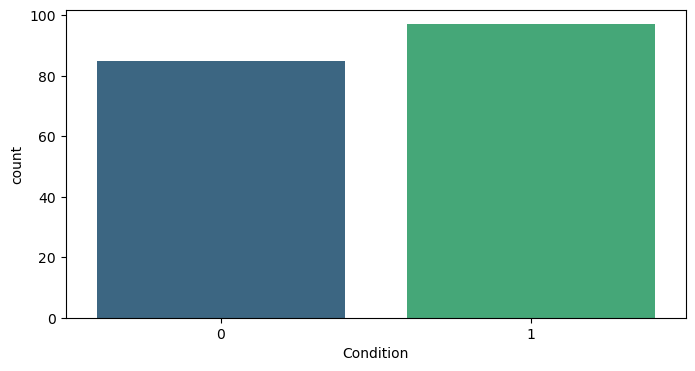

1    97
0    85
Name: Condition, dtype: int64

In [258]:
colors = ['#04395E', '#C3C49E']
fig, ax = plt.subplots(figsize=(8, 4))
sns.countplot(x = 'Condition', data = df, palette = 'viridis')
plt.show()
df['Condition'].value_counts()

# Unsupervised Learning

We're going to try two approaches:
1. K-means with k = 2 and then see how it performs against the actual labels.
2. Hierarchical clustering and then seeing how many major branches we have.


#### K-means clustering

To choose the best k, we use the Elbow Method.

The Elbow Method helps determine the optimal number of clusters for k-means clustering. It involves running k-means for a range of clusters (k), and for each k, calculating the within-cluster sum of squares (WCSS). As k increases, WCSS decreases because clusters are smaller and thus closer to their centroids. By plotting k against WCSS, we typically observe a curve that first declines sharply and then levels off, forming an 'elbow'-like shape. The optimal k is at this 'elbow' point, where adding another cluster results in a minimal decrease in WCSS, indicating that the additional cluster doesn't significantly improve the data representation.

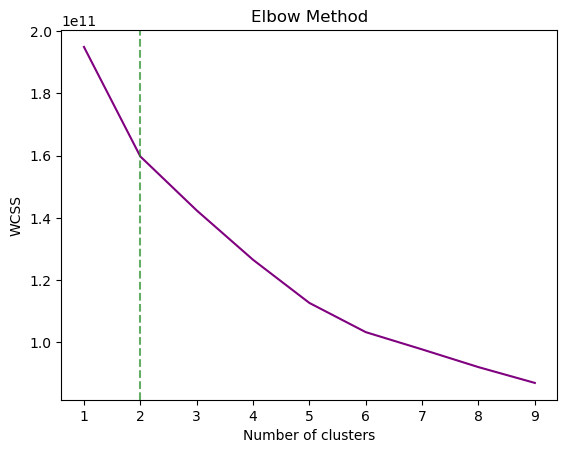

In [260]:
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df.drop(columns=['Condition']))
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 10), wcss, color = 'purple')
plt.title('Elbow Method')
plt.axvline(x = 2, color='forestgreen', linestyle='--', alpha = 0.7)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

If we were lucky enough, we would have had a clear elbow point at k = 2, however this is not the case and there is no clear elbow.

In [261]:
kmeans = KMeans(2, init='k-means++',  n_init=2000, random_state=42).fit(X)

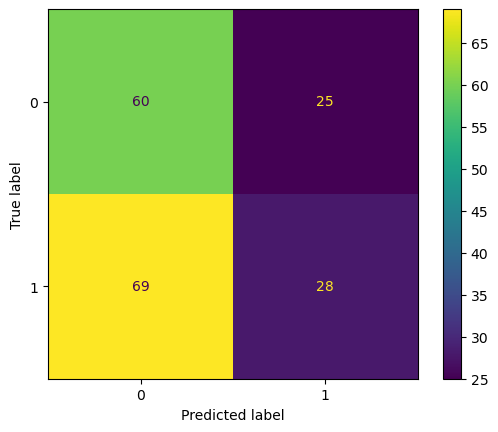

In [262]:
cm = confusion_matrix(df['Condition'], kmeans.labels_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [263]:
accuracy_score(kmeans.labels_,y)

0.4835164835164835

Applying K-means clustering with *k=2* yields performance that is unacceptabl with its accuracy of $52\%$ (1-0.48), it barely outperforms the straightforward randomness of a coin flip ($50\%$ accuracy). The elusive nature of our clusters suggests that they are not easily distinguished by linear boundaries, especially in high-dimensional spaces where the concept of distance becomes increasingly abstract and less intuitive (curse of high dimensionality).

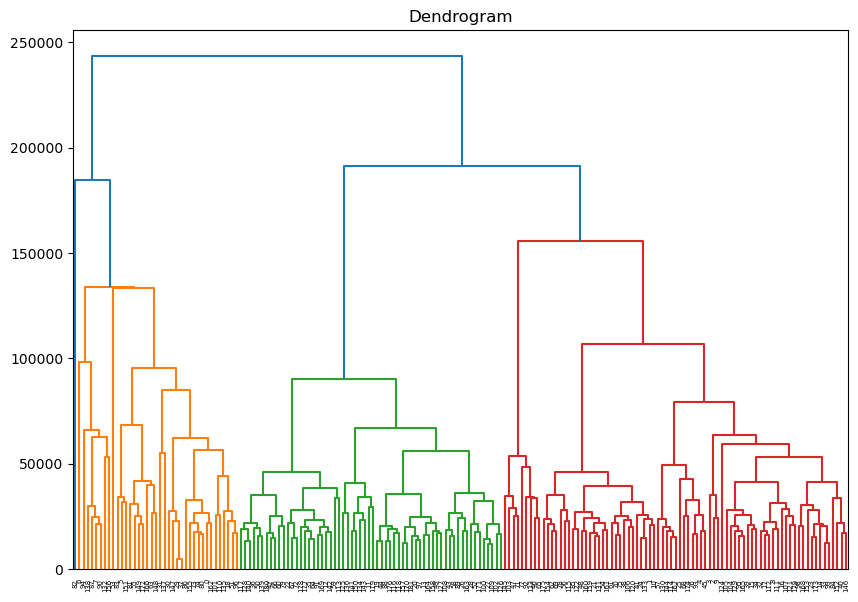

In [264]:
hierarchical = AgglomerativeClustering(
                                distance_threshold = 0.15, 
                                n_clusters=None)
hierarchical.fit(X)
Z = linkage(X, 'ward')

plt.figure(figsize=(10, 7), facecolor='white')
plt.style.use('default')
plt.title("Dendrogram")
dendrogram(Z)
plt.gca().set_facecolor('white')

plt.show()

Our implementation of hierarchical clustering has unveiled three predominant clusters within the data, a scenario that does not align comfortably with our binary classification objective.

We could try to further fine-tune the models and we would probably achieve higher accuracy, but this wouldn't probably help us in any way as this preliminary analysis showed us that the data are not clearly linearly separable.

In conclusion, the clustering methods have been mostly useless towards the scope of the project.

## Feature selection

As previously stated, for feature selection we prefer an approach using Random Forest rather than PCA. The same argument as before can be carried out since in this case our data is even smaller and genes are still low correlated (as can be seen in the Appendix). We can then proceed with feature selection. 

In [265]:
non_tuned_model_rf = RandomForestClassifier()
non_tuned_model_rf.fit(X_train, y_train)

RandomForestClassifier()

In [266]:
important_features = pd.DataFrame(non_tuned_model_rf.feature_importances_, index = df.drop(columns=['Condition']).columns).rename(columns = {0: 'Important features'})
important_features = important_features[important_features['Important features'] > 0]
important_features

,Important features
DDIT4,0.024601
ANGPTL4,0.016027
CALML5,0.000184
CCNB1,0.000275
IGFBP3,0.000265
...,...
APLF,0.000271
ST14,0.000409
INSYN2B,0.000273
NMB,0.000241


These are the cells with feature importance $>0\%$. We will now select the best model according to various metrics.

In [267]:
featured_df = df[important_features.T.columns]

In [268]:
# Use the `map` function to add the condition as a new column in df
featured_df['Condition'] = df.index.map(condition_dict)
featured_df['Condition'] = featured_df['Condition'].map({'Hypo': 1, 'Normo': 0})

## Model Selection

In [270]:
X = featured_df.drop(columns=['Condition'])
y = featured_df['Condition']
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=29)

In [271]:
non_tuned_model_lr = LogisticRegression(random_state=29)
non_tuned_model_lr.fit(X_train, y_train)
print("Non-tuned logistic score score on train data:", non_tuned_model_lr.score(X_train,y_train))
print("Non-tuned logistic score on validation data:",non_tuned_model_lr.score(X_test,y_test))
print("---")
non_tuned_model_rf = RandomForestClassifier(random_state=29)
non_tuned_model_rf.fit(X_train, y_train)
print("Non-tuned random forest score on train data:", non_tuned_model_rf.score(X_train,y_train))
print("Non-tuned random forest score on validation data:",non_tuned_model_rf.score(X_test,y_test))
print("---")
non_tuned_model_svc = svm.LinearSVC(random_state=29)
non_tuned_model_svc.fit(X_train,y_train)
print("Non-tuned Linear SVC score on train data:", non_tuned_model_svc.score(X_train,y_train))
print("Non-tuned Linear SVC score on validation data:",non_tuned_model_svc.score(X_test,y_test))


Non-tuned logistic score score on train data: 1.0
Non-tuned logistic score on validation data: 0.972972972972973
---
Non-tuned random forest score on train data: 1.0
Non-tuned random forest score on validation data: 0.972972972972973
---
Non-tuned Linear SVC score on train data: 1.0
Non-tuned Linear SVC score on validation data: 0.972972972972973


Rather surprisingly, all these models have perfect accuracy score, hence we don't need to further fine-tune them.

We define a neural network with We hence define a neural network with Nadam optimizer (Adam with Nesterov Momentum) and *binary_crossentropy* as loss and *binary_accuracy* as this parameters are specific for this kind of classification problems as the data are normalized.

In [272]:
model = Sequential([
    Dense(64, activation='relu', input_dim=X_train.shape[1]),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid'),
])
model.compile(optimizer='Nadam', loss='binary_crossentropy', metrics=['binary_accuracy'])
model.fit(X_train, y_train, epochs=30, batch_size=1, validation_data=(X_test, y_test))
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Neural network score on validation data: {accuracy}')

Epoch 1/30
145/145 [==============================] - 3s 3ms/step - loss: 34.9595 - binary_accuracy: 0.8552 - val_loss: 1.4756 - val_binary_accuracy: 0.9730
Epoch 2/30
145/145 [==============================] - 0s 2ms/step - loss: 8.3203 - binary_accuracy: 0.9448 - val_loss: 0.0032 - val_binary_accuracy: 1.0000
Epoch 3/30
145/145 [==============================] - 0s 1ms/step - loss: 1.9659 - binary_accuracy: 0.9793 - val_loss: 17.7709 - val_binary_accuracy: 0.9730
Epoch 4/30
145/145 [==============================] - 0s 1ms/step - loss: 1.4260e-14 - binary_accuracy: 1.0000 - val_loss: 16.9214 - val_binary_accuracy: 0.9730
Epoch 5/30
145/145 [==============================] - 0s 1ms/step - loss: 2.0413e-14 - binary_accuracy: 1.0000 - val_loss: 16.9235 - val_binary_accuracy: 0.9730
Epoch 6/30
145/145 [==============================] - 0s 1ms/step - loss: 1.7672e-14 - binary_accuracy: 1.0000 - val_loss: 16.9253 - val_binary_accuracy: 0.9730
Epoch 7/30
145/145 [===========================

2/2 [==============================] - 0s 2ms/step


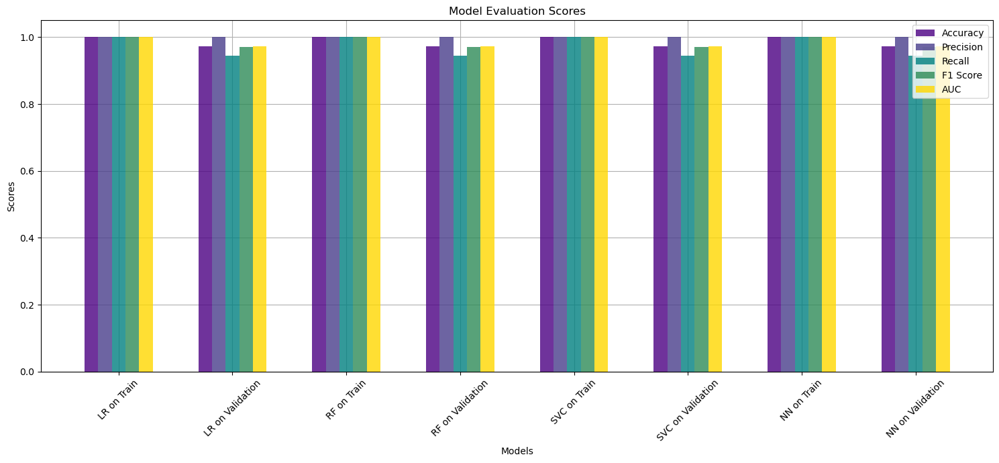

In [275]:
# Accuracy scores
lr_train_accuracy = accuracy_score(y_train, non_tuned_model_lr.predict(X_train))
lr_val_accuracy = accuracy_score(y_test, non_tuned_model_lr.predict(X_test))
rf_train_accuracy = accuracy_score(y_train, non_tuned_model_rf.predict(X_train))
rf_val_accuracy = accuracy_score(y_test, non_tuned_model_rf.predict(X_test))
svc_train_accuracy = accuracy_score(y_train, non_tuned_model_svc.predict(X_train))
svc_val_accuracy = accuracy_score(y_test, non_tuned_model_svc.predict(X_test))
nn_train_accuracy = accuracy_score(y_train, np.round(model.predict(X_train, verbose=0)))
nn_val_accuracy = accuracy_score(y_test, np.round(model.predict(X_test, verbose=0)))

# Precision scores
lr_train_precision = precision_score(y_train, non_tuned_model_lr.predict(X_train))
lr_val_precision = precision_score(y_test, non_tuned_model_lr.predict(X_test))
rf_train_precision = precision_score(y_train, non_tuned_model_rf.predict(X_train))
rf_val_precision = precision_score(y_test, non_tuned_model_rf.predict(X_test))
svc_train_precision = precision_score(y_train, non_tuned_model_svc.predict(X_train))
svc_val_precision = precision_score(y_test, non_tuned_model_svc.predict(X_test))
nn_train_precision = precision_score(y_train, np.round(model.predict(X_train)))
nn_val_precision = precision_score(y_test, np.round(model.predict(X_test)))

# Recall scores
lr_train_recall = recall_score(y_train, non_tuned_model_lr.predict(X_train))
lr_val_recall = recall_score(y_test, non_tuned_model_lr.predict(X_test))
rf_train_recall = recall_score(y_train, non_tuned_model_rf.predict(X_train))
rf_val_recall = recall_score(y_test, non_tuned_model_rf.predict(X_test))
svc_train_recall = recall_score(y_train, non_tuned_model_svc.predict(X_train))
svc_val_recall = recall_score(y_test, non_tuned_model_svc.predict(X_test))
nn_train_recall = recall_score(y_train, np.round(model.predict(X_train, verbose=0)))
nn_val_recall = recall_score(y_test, np.round(model.predict(X_test, verbose=0)))

# F1 scores
lr_train_f1 = f1_score(y_train, non_tuned_model_lr.predict(X_train))
lr_val_f1 = f1_score(y_test, non_tuned_model_lr.predict(X_test))
rf_train_f1 = f1_score(y_train, non_tuned_model_rf.predict(X_train))
rf_val_f1 = f1_score(y_test, non_tuned_model_rf.predict(X_test))
svc_train_f1 = f1_score(y_train, non_tuned_model_svc.predict(X_train))
svc_val_f1 = f1_score(y_test, non_tuned_model_svc.predict(X_test))
nn_train_f1 = f1_score(y_train, np.round(model.predict(X_train, verbose=0)))
nn_val_f1 = f1_score(y_test, np.round(model.predict(X_test, verbose=0)))

# AUC scores
lr_train_auc = metrics.roc_auc_score(y_train, non_tuned_model_lr.predict(X_train))
lr_val_auc = metrics.roc_auc_score(y_test, non_tuned_model_lr.predict(X_test))
rf_train_auc = metrics.roc_auc_score(y_train, non_tuned_model_rf.predict(X_train))
rf_val_auc = metrics.roc_auc_score(y_test, non_tuned_model_rf.predict(X_test))
svc_train_auc = metrics.roc_auc_score(y_train, non_tuned_model_svc.predict(X_train))
svc_val_auc = metrics.roc_auc_score(y_test, non_tuned_model_svc.predict(X_test))
nn_train_auc = metrics.roc_auc_score(y_train, np.round(model.predict(X_train, verbose=0)))
nn_val_auc = metrics.roc_auc_score(y_test, np.round(model.predict(X_test, verbose=0)))

# Define the labels   
score_labels = ['LR on Train', 'LR on Validation', 
                'RF on Train', 'RF on Validation', 
                'SVC on Train', 'SVC on Validation',
                'NN on Train', 'NN on Validation']

# Define scores
accuracy_scores = [lr_train_accuracy, lr_val_accuracy,
                   rf_train_accuracy, rf_val_accuracy,
                   svc_train_accuracy, svc_val_accuracy,
                   nn_train_accuracy, nn_val_accuracy]

precision_scores = [lr_train_precision, lr_val_precision,
                    rf_train_precision, rf_val_precision,
                    svc_train_precision, svc_val_precision,
                    nn_train_precision, nn_val_precision]

recall_scores = [lr_train_recall, lr_val_recall,
                 rf_train_recall, rf_val_recall,
                 svc_train_recall, svc_val_recall,
                 nn_train_recall, nn_val_recall]

f1_scores = [lr_train_f1, lr_val_f1,
             rf_train_f1, rf_val_f1,
             svc_train_f1, svc_val_f1,
             nn_train_f1, nn_val_f1]

auc_scores = [lr_train_auc, lr_val_auc,
              rf_train_auc, rf_val_auc,
              svc_train_auc, svc_val_auc,
              nn_train_auc, nn_val_auc]

# Create a grouped bar plot
bar_width = 0.12
index = np.arange(len(score_labels))  # Adjust the index to account for number of models

plt.figure(figsize=(15, 7))
plt.bar(index, accuracy_scores, width=bar_width, label='Accuracy', alpha = 0.8, color = 'indigo')
plt.bar(index + bar_width, precision_scores, width=bar_width, label='Precision', alpha = 0.8, color = 'darkslateblue')
plt.bar(index + 2 * bar_width, recall_scores, width=bar_width, label='Recall',alpha = 0.8, color = 'teal')
plt.bar(index + 3 * bar_width, f1_scores, width=bar_width, label='F1 Score', alpha = 0.8,color = 'seagreen')
plt.bar(index + 4 * bar_width, auc_scores, width=bar_width, label='AUC', alpha = 0.8, color = 'gold')

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Model Evaluation Scores')
plt.xticks(index + 2 * bar_width, score_labels, rotation = 45)  # Rotate xticks for better readability
plt.legend()
plt.tight_layout()
plt.gca().set_axisbelow(True)
plt.grid(True)
plt.show()


These results are pretty surprising, but from this, given that all the models perform similarly, we are going to choose the simpler one to avoid overfitting.

Hence the model of choice is going to be the **Logistic Regression**.

In [276]:
print("Metrics on Logistic Regression")
print("Accuracy score on validation data: ", lr_val_accuracy)
print("Precision score on validation data: ", lr_val_precision)
print("Recall score on validation data: ", lr_val_recall)
print("F1 score on validation data: ", lr_val_f1)
print("AUC on validation data: ", lr_val_auc)
cross_val = cross_val_score(non_tuned_model_lr, X_train, y_train, scoring = 'accuracy', cv = 20)
print("Minimum  cross validation score:", min(cross_val)) 
print("Maximum cross validation score:", max(cross_val))
print("Average cross validation score:", np.mean(cross_val))

Metrics on Logistic Regression
Accuracy score on validation data:  0.972972972972973
Precision score on validation data:  1.0
Recall score on validation data:  0.9444444444444444
F1 score on validation data:  0.9714285714285714
AUC on validation data:  0.9722222222222222
Minimum  cross validation score: 1.0
Maximum cross validation score: 1.0
Average cross validation score: 1.0


# MCF7_SmartS_Filtered_Normalised

EDA analysis can be found in the appendix as before. We proceed with the analysis.

In [279]:
M_Smart_norm = pd.read_csv(r"C:\Users\marti\OneDrive\AI_Lab\MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt",
                           delimiter = "\ ", engine="python", index_col=0)
M_Smart_metadata =pd.read_csv(r"C:\Users\marti\OneDrive\AI_Lab\MCF7_SmartS_MetaData.tsv",
                              delimiter = "\t", engine="python", index_col=0)

In [281]:
M_Smart_norm = name_clean(M_Smart_norm)
M_Smart_norm.head()

,S57,S58,S59,S60,S79,S81,S130,S131,S103,S104,...,S382,S383,S355,S357,S358,S359,S360,S379,S380,S381
CYP1B1,343,131,452,27,5817,3841,9263,21543,1013,53,...,7890,4512,160,351,327,196,504,34565,20024,5953
CYP1B1-AS1,140,59,203,7,2669,1565,3866,9113,459,22,...,3647,2035,75,138,130,102,238,13717,7835,2367
CYP1A1,0,0,0,0,0,79,238,443,0,0,...,86,1654,0,0,0,1,0,11274,563,522
NDRG1,0,1,0,0,654,1263,2634,540,0,13,...,481,1052,0,0,54,243,62,1263,925,1572
DDIT4,386,289,0,288,2484,2596,1323,2044,36,204,...,3692,2410,800,1,189,266,417,4256,12733,2275


In [283]:
M_Smart_metadata = name_clean(M_Smart_metadata.T).T
M_Smart_metadata.head()

,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
S28,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
S29,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
S30,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
S1,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
S2,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [284]:
label = pd.Series(np.zeros(383), index = M_Smart_metadata.index)
for i in M_Smart_metadata.index:
    if M_Smart_metadata.Condition[i] == 'Norm':
        label[i] = 0
    elif M_Smart_metadata.Condition[i] == 'Hypo':
        label[i] = 1
label = label.astype('int64')
label

Filename
S28     1
S29     1
S30     1
S1      0
S2      0
       ..
S359    0
S360    0
S379    1
S380    1
S381    1
Length: 383, dtype: int64

In [285]:
M_Smart_norm_complete = M_Smart_norm.T.copy()
M_Smart_norm_complete['Condition'] = label
M_Smart_norm_complete = M_Smart_norm_complete.T

### SOME VISUALIZATION

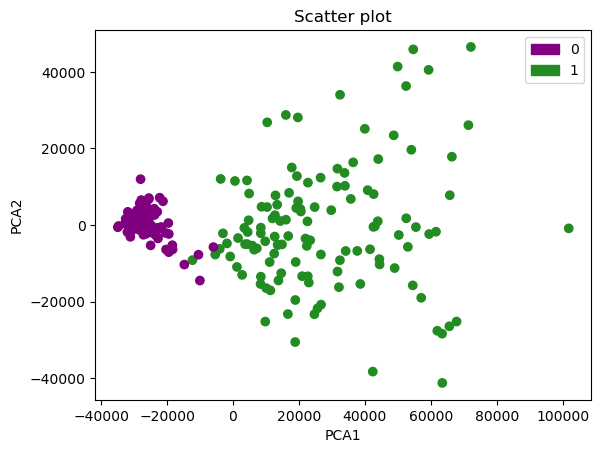

In [291]:
pca2 = PCA(n_components=2)
M_Smart_norm_2 = pca2.fit_transform(M_Smart_norm.T)
colors = ['purple', 'forestgreen']
labels = [0, 1]
plt.scatter(M_Smart_norm_2[:, 0], M_Smart_norm_2[:, 1], 
            c=[colors[label] for label in M_Smart_norm_complete.T.Condition])
legend_handles = [mpatches.Patch(color=color, label=label) for color, label in zip(colors, labels)]
plt.legend(handles=legend_handles)
plt.title('Scatter plot')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

As a first step we looked at possible patterns in the data using PCA. We decided to put only this plot of the EDA because we can see clearly that a separation exists. Therefore, we can expect that a model such as Logistic Regression may be suitable for effectively modeling the data.

## Data Preparation

In this section we will prepare the data for the LogisticRegression we will use 2 different dataset:

- Raw Data
- Raw Data with genes removed using random forest

The same argument about PCA can be extended also here. In the following lines we will only present the model which at the end performed the best. All the other tries can be found in the Appendix as well. 

## FEATURE SELECTION

#### *Random forest*

Now we will use a method of the Random Forest Classificator which tells us the most relevant genes of our data

In [293]:
Xtrain, Xtest, ytrain, ytest = model_selection.train_test_split(M_Smart_norm.T, M_Smart_norm_complete.T.Condition, test_size=0.3, random_state=42)

In [294]:
clf = RandomForestClassifier(random_state=43)
clf.fit(Xtrain,ytrain)

RandomForestClassifier(random_state=43)

In [295]:
important_features = pd.DataFrame(clf.feature_importances_, index = M_Smart_norm.T.columns).rename(columns = {0: 'Important features'})
important_features = important_features[important_features['Important features'] > 0]

In [300]:
important_features

,Important features
CYP1B1,0.008707
CYP1B1-AS1,0.023430
CYP1A1,0.000978
NDRG1,0.022070
DDIT4,0.007328
...,...
LINC02861,0.000465
SGMS1-AS1,0.000191
ABAT,0.000874
FZD1,0.000448


The important genes which are given by the feature selection of the Random Forest are chosen by their capability of distinguish cells between Hypoxic and Normoxic condition here we analyse the three main genes and their biological meaning:

- **CYP1B1 (Cytochrome P450 1B1 gene)** is known to regulate estrogen metabolism in breast cells, has been shown to be overexpressed in breast cancer tissue. Interestingly, this overexpression has been linked to hypoxia. Recent studies have shown that upregulation of CYP1B1 by hypoxia is mediated by $ER\alpha$ activation in breast cancer cells. This correlation between hypoxia and CYP1B1 expression has implications for tumorigenesis-related mechanisms, suggesting a strong connection between CYP1B1 and the hypoxic response [$^1$](https://pubmed.ncbi.nlm.nih.gov/35812067/).

- **CYP1B1-AS1 (Enhancer RNA (eRNA))** plays a pivotal role in tumor progression. Its overexpression has been identified as a potential molecular biomarker for predicting the prognosis of patients with Glioblastoma (GBM) which is a type of tumor. Although the specific role of CYP1B1-AS1 in hypoxia is not directly mentioned, its association with CYP1B1, which is impacted by hypoxia, suggests a potential influence in hypoxic conditions [$^2$](https://www.hindawi.com/journals/dm/2021/8565943/).

- **CYP1A1  (Member of the cytochrome P450 family)** has shown a clear response to hypoxia. Hypoxia has been found to down-regulate CYP1A1 expression and decrease its activity, which contributes to decreased clearance of certain drugs, resulting in a higher risk of drug toxicity in patients with hypoxemia [$^3$](https://pubmed.ncbi.nlm.nih.gov/15180495/).

In [296]:
M_Smart_norm_important = M_Smart_norm.T.copy()
M_Smart_norm_important = M_Smart_norm_important.loc[:, important_features.index.tolist()]
M_Smart_norm_important_complete = M_Smart_norm_important.copy()
M_Smart_norm_important_complete['Condition'] = label

# Logistic Regression

Logistic regression was the model which amongst all performed the best. 

### *Model with important features data*

In [301]:
Xtrain, Xtest, ytrain, ytest = model_selection.train_test_split(M_Smart_norm_important, 
                                                M_Smart_norm_important_complete.Condition, test_size=0.3, random_state=42)

In [302]:
param_grid_1= [{'penalty': ['l2', None], 'C':list(np.logspace(-4, 4, 10)) + [1] ,
                'solver' : ['lbfgs', 'newton-cg', 'sag', 'saga'], 
                       'max_iter': [200,800,1500,4000], 'fit_intercept' : [True, False] }]
param_grid_2 = [{'penalty': ['l2','l1'], 'C':np.logspace(-4, 4, 10) + [1] , 'solver' : ['liblinear'], 
                       'max_iter': [200,800,1500,4000], 'fit_intercept' : [True, False]}]

In [303]:
#Empty model
log_reg = LogisticRegression(random_state = 42)
log_reg.fit(Xtrain, ytrain)
# First Parameter Grid
grid_1 = RandomizedSearchCV(log_reg, param_grid_1, cv = 5, scoring = 'accuracy', n_jobs = -1)
grid_1.fit(Xtrain, ytrain)
# Second Parameter Grid
grid_2 = RandomizedSearchCV(log_reg, param_grid_2, cv = 5, scoring = 'accuracy', n_jobs = -1)
grid_2.fit(Xtrain, ytrain)

RandomizedSearchCV(cv=5, estimator=LogisticRegression(random_state=42),
                   n_jobs=-1,
                   param_distributions=[{'C': array([1.00010000e+00, 1.00077426e+00, 1.00599484e+00, 1.04641589e+00,
       1.35938137e+00, 3.78255940e+00, 2.25443469e+01, 1.67810054e+02,
       1.29254967e+03, 1.00010000e+04]),
                                         'fit_intercept': [True, False],
                                         'max_iter': [200, 800, 1500, 4000],
                                         'penalty': ['l2', 'l1'],
                                         'solver': ['liblinear']}],
                   scoring='accuracy')

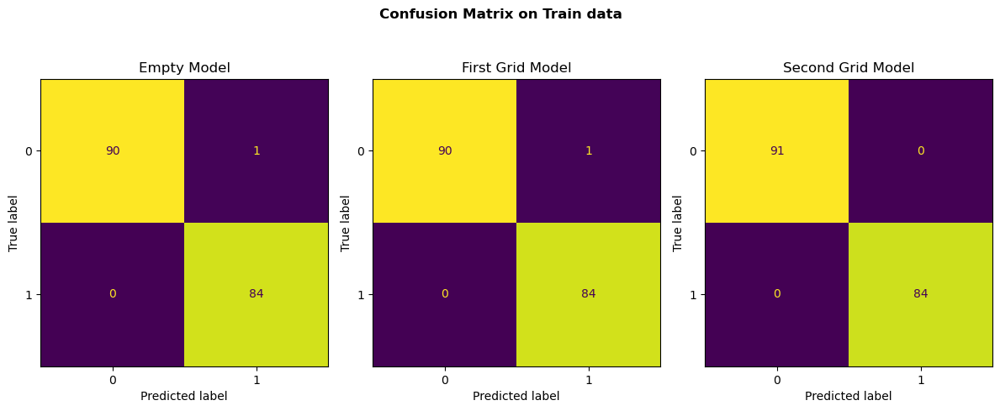

In [304]:
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

fig.suptitle('Confusion Matrix on Train data', fontweight = 'bold')
# Confusion Matrix and score of Empty Model
y_train_pred_1 = model_selection.cross_val_predict(log_reg, Xtrain, ytrain, cv = 5)
empty_model_cm = ConfusionMatrixDisplay.from_predictions(ytrain, y_train_pred_1, ax = axes[0], colorbar=False)
axes[0].set_title('Empty Model')
axes[0].set_xlabel('Predicted label')
axes[0].set_ylabel('True label')

# Confusion Matrix and score of First Grid model
y_train_pred_2 = model_selection.cross_val_predict(grid_1, Xtrain, ytrain, cv = 5)
first_grid_cm =ConfusionMatrixDisplay.from_predictions(ytrain, y_train_pred_2, ax = axes[1],  colorbar=False)
axes[1].set_title('First Grid Model')
axes[1].set_xlabel('Predicted label')
axes[1].set_ylabel('True label')

# Confusion Matrix and score of Second Grid model
y_train_pred_3 = model_selection.cross_val_predict(grid_2, Xtrain, ytrain, cv = 5)
second_grid_cm = ConfusionMatrixDisplay.from_predictions(ytrain, y_train_pred_3, ax = axes[2],  colorbar=False)
axes[2].set_title('Second Grid Model')
axes[2].set_xlabel('Predicted label')
axes[2].set_ylabel('True label')

plt.tight_layout()
plt.show()

In [305]:
# Test Performance on empty model
y_test_pred_1 = log_reg.predict(Xtest)
print("\033[1m"+"Empty model"+ "\033[0m")
print('The accuracy score in empty model is:', metrics.accuracy_score(ytest, y_test_pred_1))
print('The precision score in empty model is:', metrics.precision_score(ytest, y_test_pred_1))
print('The recall score in empty model is: ',metrics.recall_score(ytest, y_test_pred_1))
print('The f1 score in empty model is: ',metrics.f1_score(ytest, y_test_pred_1))
print('The roc auc score in empty model is', metrics.roc_auc_score(ytest, y_test_pred_1))

# Test Performance on First Grid model
y_test_pred_2 = grid_1.predict(Xtest)
print("\n\033[1m"+"First Grid model" + "\033[0m")
print('The accuracy score in first grid is:', metrics.accuracy_score(ytest, y_test_pred_2))
print('The precision score in first grid is:', metrics.precision_score(ytest, y_test_pred_2))
print('The recall score in first grid is: ',metrics.recall_score(ytest, y_test_pred_2))
print('The f1 score in first grid is: ',metrics.f1_score(ytest, y_test_pred_2))
print('The roc auc score in first grid is', metrics.roc_auc_score(ytest, y_test_pred_2))

# Test Performance on Second Grid model
y_test_pred_3 = grid_2.predict(Xtest)
print("\n\033[1m"+"Second Grid model" + "\033[0m")
print('The accuracy score in second grid is:', metrics.accuracy_score(ytest, y_test_pred_3))
print('The precision score in second grid is:', metrics.precision_score(ytest, y_test_pred_3))
print('The recall score in second grid is: ',metrics.recall_score(ytest, y_test_pred_3))
print('The f1 score in second grid is: ',metrics.f1_score(ytest, y_test_pred_3))
print('The roc auc score in second grid is', metrics.roc_auc_score(ytest, y_test_pred_3))

Empty model
The accuracy score in empty model is: 1.0
The precision score in empty model is: 1.0
The recall score in empty model is:  1.0
The f1 score in empty model is:  1.0
The roc auc score in empty model is 1.0

First Grid model
The accuracy score in first grid is: 1.0
The precision score in first grid is: 1.0
The recall score in first grid is:  1.0
The f1 score in first grid is:  1.0
The roc auc score in first grid is 1.0

Second Grid model
The accuracy score in second grid is: 1.0
The precision score in second grid is: 1.0
The recall score in second grid is:  1.0
The f1 score in second grid is:  1.0
The roc auc score in second grid is 1.0


We chose the model fitted on the second grid since they all perform equally on the the test data but the results in the Confusion Matrix are more accurate.

# HCC1806_DropS_Filtered_Normalised

For this dataset we will perform also the Exploratory Data Analysis (EDA), since we are dealing with a completely different single cell RNA sequencing technique.  

## Exploratory Data Analysis(EDA)

Given that the data has already undergone the process of filtering and normalization, we expect the EDA to provide valuable insights and information about our dataset.

In [5]:
H_drop_fil = pd.read_csv(r'C:\Users\marti\OneDrive\AI_Lab\HCC1806_DropS_Filtered_Normalised_3000_Data_train.txt', sep = ' ')

H_drop_fil.head()

,AAAAAACCCGGC_Normoxia,AAAACCGGATGC_Normoxia,AAAACGAGCTAG_Normoxia,AAAACTTCCCCG_Normoxia,AAAAGCCTACCC_Normoxia,AAACACAAATCT_Normoxia,AAACCAAGCCCA_Normoxia,AAACCATGCACT_Normoxia,AAACCTCCGGCT_Normoxia,AAACGCCGGTCC_Normoxia,...,TTTTCTGATGGT_Hypoxia,TTTTGATTCAGA_Hypoxia,TTTTGCAACTGA_Hypoxia,TTTTGCCGGGCC_Hypoxia,TTTTGTTAGCCT_Hypoxia,TTTTTACCAATC_Hypoxia,TTTTTCCGTGCA_Hypoxia,TTTTTGCCTGGG_Hypoxia,TTTTTGTAACAG_Hypoxia,TTTTTTTGAATC_Hypoxia
H1-5,2,2,5,1,0,0,0,0,1,0,...,0,1,0,2,1,0,0,0,3,1
MALAT1,3,3,2,3,12,3,1,2,0,0,...,3,1,1,1,4,0,4,1,3,6
MT-RNR2,0,0,0,0,0,0,0,0,0,1,...,1,2,2,2,0,0,1,0,1,0
ARVCF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCYRN1,0,1,1,0,0,1,1,2,0,3,...,1,1,0,1,1,0,0,1,0,0


We start by inspecting the structure of the dataset and its dimension; subsequently, we will check whether the dataset contains non-integer elements, null values or NaNs.

In [307]:
print('Dimension of the dataset: ', H_drop_fil.shape)
n_rows= H_drop_fil.shape[0]
n_col= H_drop_fil.shape[1]
print('Number of rows:', n_rows, '\nNumber of columns:', n_col)

Dimension of the dataset:  (3000, 14682)
Number of rows: 3000 
Number of columns: 14682


In [308]:
if len(H_drop_fil.dtypes[H_drop_fil.dtypes == 'int64']) == n_col:
    print('All entries are integer numbers')

def empty_cols(df):
    nulldf=[]
    for col in df.columns:
        if df[col].sum()==0:
            nulldf.append(col)
    return nulldf
print('Empty columns:', empty_cols(H_drop_fil))

All entries are integer numbers
Empty columns: []


In [309]:
print(H_drop_fil.isna().sum().sum())
print(H_drop_fil.isnull().sum().sum())

0
0


In [310]:
duplicate_cols = []
for i in H_drop_fil.duplicated():
    if i == True:
        duplicate_cols.append(i)
print('Duplicate columns: ' +str(duplicate_cols))
duplicate_rows = []
for i in H_drop_fil.T.duplicated():
    if i == True:
        duplicate_rows.append(i)
print(f"Duplicate rows: {duplicate_rows}")

Duplicate columns: []
Duplicate rows: []


Our dataset exhibits several notable characteristics. Firstly, it is worth mentioning that the dataset does not contain any duplicate columns, ensuring that each gene is uniquely represented and therefore that any redundancy in the gene information is avoided.

Furthermore, the dataset does not contain any NaN or null values, ad all the entries are integer values.

The combination of these characteristics provides an encouraging assumption for our subsequent analysis.

### More details about the distributions:

In [311]:
H_drop_fil.describe()

,AAAAAACCCGGC_Normoxia,AAAACCGGATGC_Normoxia,AAAACGAGCTAG_Normoxia,AAAACTTCCCCG_Normoxia,AAAAGCCTACCC_Normoxia,AAACACAAATCT_Normoxia,AAACCAAGCCCA_Normoxia,AAACCATGCACT_Normoxia,AAACCTCCGGCT_Normoxia,AAACGCCGGTCC_Normoxia,...,TTTTCTGATGGT_Hypoxia,TTTTGATTCAGA_Hypoxia,TTTTGCAACTGA_Hypoxia,TTTTGCCGGGCC_Hypoxia,TTTTGTTAGCCT_Hypoxia,TTTTTACCAATC_Hypoxia,TTTTTCCGTGCA_Hypoxia,TTTTTGCCTGGG_Hypoxia,TTTTTGTAACAG_Hypoxia,TTTTTTTGAATC_Hypoxia
count,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,0.02900,0.041667,0.024333,0.021667,0.029667,0.020000,0.036000,0.02600,0.034000,0.029333,...,0.043000,0.049667,0.037000,0.047667,0.057000,0.023333,0.041667,0.041667,0.043333,0.040000
std,0.23276,0.309778,0.231860,0.189409,0.323761,0.170126,0.250449,0.23525,0.231362,0.218683,...,0.271739,0.319219,0.279864,0.259648,0.304053,0.214797,0.236536,0.285116,0.267356,0.282418
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.00000,9.000000,7.000000,4.000000,12.000000,3.000000,4.000000,6.00000,4.000000,4.000000,...,4.000000,7.000000,7.000000,4.000000,5.000000,4.000000,4.000000,5.000000,5.000000,6.000000


In [312]:
min_mean= min(H_drop_fil.describe().loc['mean'].tolist())
max_mean= max(H_drop_fil.describe().loc['mean'].tolist())
print(f"The mean ranges from {min_mean} to {max_mean}")
std= np.mean(np.array(H_drop_fil.describe().loc['std'].tolist()))
print(f"The average standard deviation is {std}")

extr_low= min(H_drop_fil.describe().loc['min'].tolist())
extr_high= max(H_drop_fil.describe().loc['max'].tolist())
print(f"The extreme values of the dataset are {extr_low} and {extr_high}")

The mean ranges from 0.013 to 0.07333333333333333
The average standard deviation is 0.2790719033977203
The extreme values of the dataset are 0.0 and 110.0


We can read a certain state of balance or symmetry. This observation is based on the examination of both the mean and the standard deviation values, which are centered around 0 for all cells, especially implying that the variation within the dataset is relatively low. 

### Correlation

The subsequent phase of our EDA focuses on investigating the correlation patterns within the dataset, specifically examining the relationships between cells and between genes.

The next step in our EDA concerns the analysis of the correlation between cells and between genes.

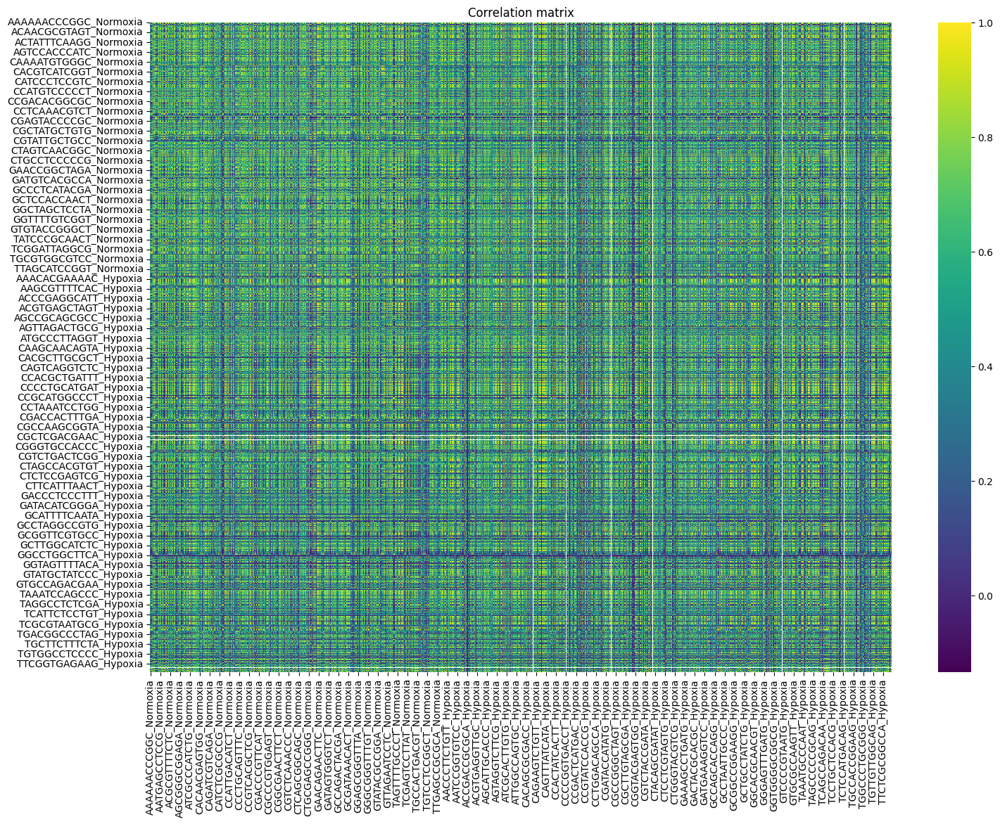

In [ ]:
plt.figure(figsize=(17, 12))
corr = H_drop_fil[0:50].corr()
sns.heatmap(corr, cmap = 'viridis');
plt.title('Correlation matrix');

### Target Variables

In [6]:
df = pd.DataFrame(H_drop_fil.T)
df['label'] = np.zeros(H_drop_fil.shape[1])
for i in H_drop_fil:
    if 'Normoxia' in i:
        df['label'][i] = 0
    if 'Hypoxia' in i:
        df['label'][i] = 1

df['label'] = df['label'].astype(int)
df = df.T

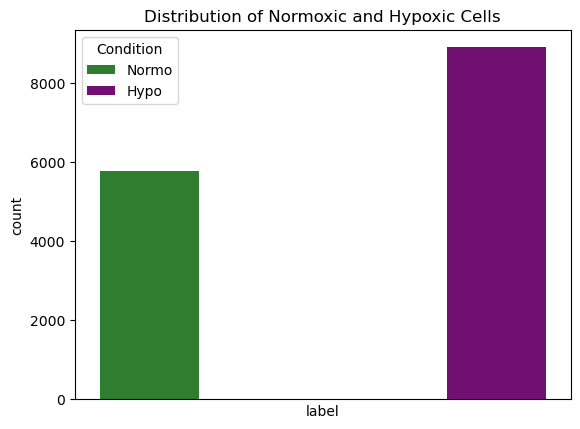

In [7]:
plt.figure()
sns.countplot(data= df.T, x ='label',  palette = ['forestgreen', 'purple'], hue = 'label');
plt.title("Distribution of Normoxic and Hypoxic Cells");
plt.legend(title='Condition', loc='best', labels=['Normo', 'Hypo']);
plt.xticks([]);

In [8]:
np.bincount(df.T['label'])

array([5783, 8899], dtype=int64)

The two classes are slightly unbalanced, the proportion is about 40% Normo and 60% Hypo, since the imbalance is not that significant we decide not to proceed with oversampling or undersampling techniques.

In [9]:
normo = df.T[df.T['label'] == 0].T
normo.drop('label', axis = 'index', inplace = True)
hypo = df.T[df.T['label'] == 1].T
hypo.drop('label', axis = 'index', inplace = True)

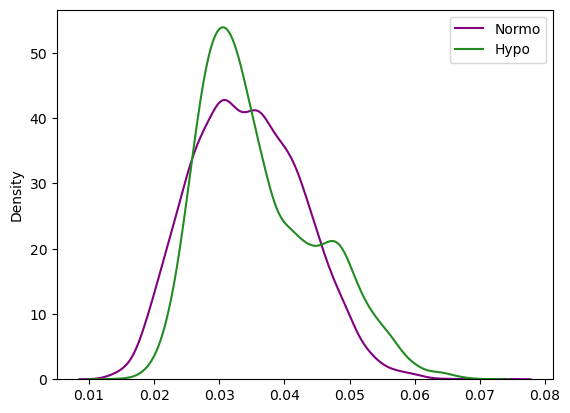

In [10]:
sns.kdeplot(data=normo.mean(), label = 'Normo', clip = [0,1000], color = 'purple')
sns.kdeplot(data=hypo.mean(), label = 'Hypo', clip = [0,1000], color = 'forestgreen')
plt.legend()
plt.show()

In this plot, a KDE has been fitted by averaging the genes expression on all cells. It's clear from these probability distributions that the "typical" hypoxic and normoxic cell have different expression for the genes. This fact will be used from now on to investigate the relevant genes in order to fit a model.

### Visualization of the data

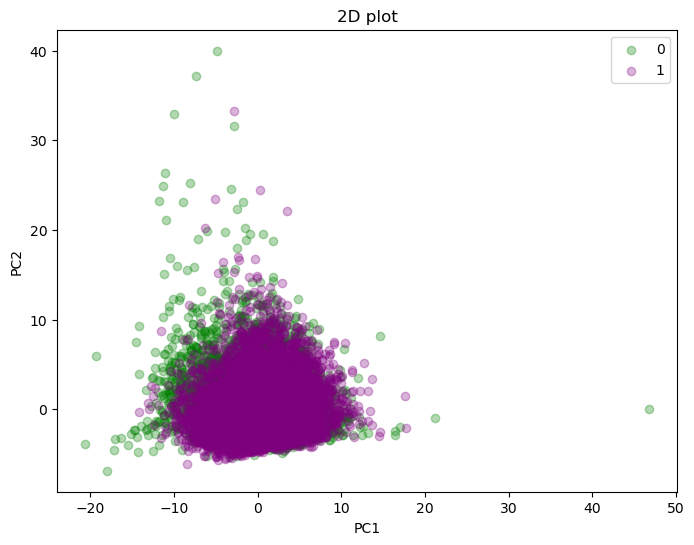

In [12]:
# Perform PCA on the unfiltered dataset
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df.T)

# Get condition labels for the samples
conditions = df.T["label"]

# Create a PCA plot
plt.figure(figsize=(8, 6))
for condition, color in zip(conditions.unique(), ['green', 'purple']):
    idx = conditions == condition
    plt.scatter(pca_result[idx, 0], pca_result[idx, 1], c=color, label=condition, alpha = 0.3)
plt.legend()
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('2D plot')
plt.show()

From this 2D PCA visualization, not much information can be deducted, but one could argue that the hypoxic and normoxic cells look linearly separable.

For this reason, a 3D PCA has been carried.

In [13]:
# PCA model with three components
import plotly.express as px

condition = df.T['label'].astype(str)
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df.T)
g = pd.DataFrame(pca_result)
g.set_index(condition, inplace =True)


fig = px.scatter_3d(g, x=0, y=1, z=2,
                     color = g.index, color_discrete_sequence = ['purple', 'green']
                    
                    )
#
fig.show()


Unfortunately, the claim that the data were already clustered in 3 dimensions doesn't hold, hence the data are not linearly separable, at least in low dimensionality.

## Supervised Learning Model

Given the high dimension of the dataset, we need to be aware of the so called 'curse of dimensionality'. To address this issue, we perform  Feature Selection using the Random Forest classifier. By doing so, we can alleviate the computational burden and improve the interpretability of the data, facilitating more effective machine learning analysis.

### Feature Selection

We use the same strategy as we did on the SmartS datasets

In [15]:
X = df.T.drop('label', axis = 1)
y = df.T['label']
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size = 0.25, random_state=43)

In [16]:
clf = RandomForestClassifier(random_state=43)
clf.fit(X_train,y_train)

RandomForestClassifier(random_state=43)

In [17]:
important_features = pd.DataFrame(clf.feature_importances_, index = df.T.drop('label', axis = 1).columns).rename(columns = {0: 'Important features'})
important_features = important_features[important_features['Important features'] > 0]
important_features

,Important features
H1-5,0.002466
MALAT1,0.009115
MT-RNR2,0.003885
ARVCF,0.000025
BCYRN1,0.015336
...,...
SCCPDH,0.000099
NTAN1,0.000096
CLIP2,0.000051
DUSP23,0.000155


In [18]:
X = X[important_features.index]

### Neural Network

The NN consists of three hidden layers, each comprising 64 units and employing the rectified linear unit (ReLU) activation function. The output layer, with a single unit, uses the sigmoid activation function for binary classification. The model is compiled with the Nadam optimizer and trained using binary cross-entropy loss. 

In [ ]:
model = Sequential([
    Dense(64, activation='relu', input_dim=X_train.shape[1]),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid'),
])
model.compile(optimizer='Nadam', loss='binary_crossentropy', metrics=['binary_accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=1, validation_data=(X_test, y_test))
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')

Epoch 1/10
11011/11011 [==============================] - 103s 9ms/step - loss: 0.1721 - binary_accuracy: 0.9355 - val_loss: 0.1268 - val_binary_accuracy: 0.9504
Epoch 2/10
11011/11011 [==============================] - 98s 9ms/step - loss: 0.0874 - binary_accuracy: 0.9697 - val_loss: 0.1163 - val_binary_accuracy: 0.9600
Epoch 3/10
11011/11011 [==============================] - 122s 11ms/step - loss: 0.0468 - binary_accuracy: 0.9845 - val_loss: 0.1636 - val_binary_accuracy: 0.9567
Epoch 4/10
11011/11011 [==============================] - 125s 11ms/step - loss: 0.0249 - binary_accuracy: 0.9918 - val_loss: 0.2268 - val_binary_accuracy: 0.9589
Epoch 5/10
11011/11011 [==============================] - 119s 11ms/step - loss: 0.0173 - binary_accuracy: 0.9965 - val_loss: 0.4105 - val_binary_accuracy: 0.9548
Epoch 6/10
11011/11011 [==============================] - 123s 11ms/step - loss: 0.0135 - binary_accuracy: 0.9968 - val_loss: 0.4535 - val_binary_accuracy: 0.9594
Epoch 7/10
11011/11011 [=

In [ ]:
y_pred1 = model.predict(X_test)
print('Accuracy Score: ' + str(accuracy))
print('Binary Cross Entropy  loss: ' +str(loss))
print('Mean Squared Error Loss: ' + str(mean_squared_error(y_test, y_pred1)))

115/115 [==============================] - 0s 3ms/step
Accuracy Score: 0.9566875696182251
Binary Cross Entropy  loss: 0.541532039642334
Mean Squared Error Loss: 0.03805433755640302


Thiese results are satisfactory, but there is a margin for improvement. We decide to run gridsearch for finding the best optimizer. In order to do so we need to define the function create_model, which we will use as the model parameter of gridsearch.

In [ ]:
def create_model(optimizer):
    # define model
    model = Sequential([
    Dense(64, activation='relu', input_dim=X_train.shape[1]),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid'),
])
    model.compile(optimizer='Nadam', loss='binary_crossentropy', metrics=['binary_accuracy'])
    return model
     

In [ ]:
model = KerasClassifier(model=create_model, loss="binary_crossentropy", epochs=10, batch_size=10, verbose=0)
optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
param_grid = dict(model__optimizer=optimizer)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=5)
grid_result = grid.fit(X_train, y_train)
print(grid_result.best_params_)

{'model__optimizer': 'Adagrad'}


The best optimizer found by GS is 'Adagrad'. The Adagrad optimizer adjusts the learning rate for each parameter based on the historical gradients, giving more emphasis to parameters with smaller gradients and smaller updates to parameters that frequently receive large gradients.
This adaptive learning rate scheme allows the algorithm to converge more quickly on parameters that have not yet been well-optimized while taking smaller steps for frequently updated parameters.

In [ ]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.25, random_state=43)

In [ ]:
model = Sequential([
    Dense(64, activation='relu', input_dim=X_train.shape[1]),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid'),
])
model.compile(optimizer='Adagrad', loss='binary_crossentropy', metrics=['binary_accuracy'])
model.fit(X_train, y_train, epochs=30, batch_size=1, validation_data=(X_test, y_test))
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')

Epoch 1/30
11011/11011 [==============================] - 10s 845us/step - loss: 0.2820 - binary_accuracy: 0.8859 - val_loss: 0.1563 - val_binary_accuracy: 0.9412
Epoch 2/30
11011/11011 [==============================] - 9s 815us/step - loss: 0.1258 - binary_accuracy: 0.9531 - val_loss: 0.1305 - val_binary_accuracy: 0.9480
Epoch 3/30
11011/11011 [==============================] - 9s 859us/step - loss: 0.0992 - binary_accuracy: 0.9647 - val_loss: 0.1179 - val_binary_accuracy: 0.9515
Epoch 4/30
11011/11011 [==============================] - 11s 1ms/step - loss: 0.0841 - binary_accuracy: 0.9704 - val_loss: 0.1113 - val_binary_accuracy: 0.9559
Epoch 5/30
11011/11011 [==============================] - 9s 815us/step - loss: 0.0734 - binary_accuracy: 0.9745 - val_loss: 0.1079 - val_binary_accuracy: 0.9583
Epoch 6/30
11011/11011 [==============================] - 9s 842us/step - loss: 0.0654 - binary_accuracy: 0.9780 - val_loss: 0.1056 - val_binary_accuracy: 0.9597
Epoch 7/30
11011/11011 [====

Thanks to fine-tuning, the model was able to slightly increase its accuracy up to $96\%$.

# MCF7_DropS_Filtered_Normalised

EDA analysis for this dataset can be found in the Appendix. 

In [19]:
M_drop_fil= pd.read_csv(r"C:\Users\marti\OneDrive\AI_Lab\MCF7_DropS_Filtered_Normalised_3000_Data_train.txt", sep = ' ')

In [20]:
M_drop_fil.head()

,AAAAACCTATCG_Normoxia,AAAACAACCCTA_Normoxia,AAAACACTCTCA_Normoxia,AAAACCAGGCAC_Normoxia,AAAACCTAGCTC_Normoxia,AAAACCTCCGGG_Normoxia,AAAACTCGTTGC_Normoxia,AAAAGAGCTCTC_Normoxia,AAAAGCTAGGCG_Normoxia,AAAATCGCATTT_Normoxia,...,TTTTACAGGATC_Hypoxia,TTTTACCACGTA_Hypoxia,TTTTATGCTACG_Hypoxia,TTTTCCAGACGC_Hypoxia,TTTTCGCGCTCG_Hypoxia,TTTTCGCGTAGA_Hypoxia,TTTTCGTCCGCT_Hypoxia,TTTTCTCCGGCT_Hypoxia,TTTTGTTCAAAG_Hypoxia,TTTTTTGTATGT_Hypoxia
MALAT1,1,3,3,6,4,5,1,13,3,3,...,0,2,1,0,1,0,1,0,0,4
MT-RNR2,0,0,0,2,0,0,2,1,7,0,...,0,0,0,0,0,0,0,0,0,0
NEAT1,0,0,0,0,0,2,0,1,2,0,...,0,0,0,0,0,0,0,0,0,0
H1-5,0,0,0,0,0,2,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
TFF1,4,1,1,1,0,0,0,2,0,1,...,2,3,8,0,0,3,4,2,6,0


In [21]:
M_drop_compl= pd.DataFrame(M_drop_fil.T)
M_drop_compl['label']= np.zeros(M_drop_fil.shape[1])

for x in M_drop_fil:
    if 'Normoxia' in x:
        M_drop_compl['label'][x] = 0
    if 'Hypoxia' in x:
        M_drop_compl['label'][x] = 1

M_drop_compl['label']= M_drop_compl['label'].astype(int)
M_drop_compl=  M_drop_compl.T

## Supervised Learning Model

In this section we will train and evaluate the performance of the best predictor for the M_Drop_fil dataset.


In order to ease our analyis in this procedure, we decided to rely on similar steps as those that were performed in the case of the H_Drop-seq dataset.
In fact, the main challenge for this dataset regards dealing with its huge dimensions.

We can mitigate this issue by employing a Random Forest as a techniques to select relevant features.

In [ ]:
# call X and y
X= M_drop_fil.T
y= M_drop_compl.T['label']

### Feature selection

In [ ]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size = 0.2, random_state=42)

In [ ]:
mclf = RandomForestClassifier(random_state=43)
mclf.fit(X_train,y_train)

RandomForestClassifier(random_state=43)

In [ ]:
mclf = RandomForestClassifier(random_state=43)
mclf.fit(X_train,y_train)
important_features = pd.DataFrame(mclf.feature_importances_, index = M_drop_compl.T.drop('label', axis = 1).columns).rename(columns = {0: 'Important features'})
important_features = important_features[important_features['Important features'] > 0]
important_features

,Important features
MALAT1,0.007348
MT-RNR2,0.033106
NEAT1,0.001162
H1-5,0.001020
TFF1,0.037403
...,...
BRWD1-AS2,0.000008
RPS19BP1,0.000180
AUNIP,0.000024
TNK2,0.000050


## Neural Network

In order to avoid to bore the reader, we avoid the process of model selection and we just show the model that performed better on this dataset, being a Neural network having *Nadam* as optimizer, *binary_crossentropy* as loss, *binary_accuracy* for analogous reasons as those stated above.

Other models (that performed worse than this one) fitted on this dataset are:
- Logistic Regression
- SVM
- Random Forest

The fact that a deep learning algorithm performed better makes sense, since this dataset is bigger than the one used before and not easily separable, hence a more complex model is expected to perform better.

In [22]:
X= X[important_features.index]

In [ ]:
scores = pd.DataFrame()
scores = pd.DataFrame()
scores['accuracy_score'] = []
scores['f1_score'] = []
scores['precision_score'] = []
scores['recall_score'] = []
cross_ent = []
MSE = []

In [ ]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size = 0.25, random_state=43)

In [ ]:
nadam_model = Sequential([
    Dense(64, activation='relu', input_dim=X_train.shape[1]),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid'),
])
nadam_model.compile(optimizer='Nadam', loss='binary_crossentropy', metrics=['binary_accuracy'])
nadam_model.fit(X_train, y_train, epochs=15, batch_size=32, validation_data=(X_test, y_test))
loss, accuracy = nadam_model.evaluate(X_test, y_test)
print(f'Test accuracy: {accuracy}')

Epoch 1/15
507/507 [==============================] - 2s 3ms/step - loss: 0.0931 - binary_accuracy: 0.9638 - val_loss: 0.0546 - val_binary_accuracy: 0.9798
Epoch 2/15
507/507 [==============================] - 1s 2ms/step - loss: 0.0293 - binary_accuracy: 0.9904 - val_loss: 0.0784 - val_binary_accuracy: 0.9737
Epoch 3/15
507/507 [==============================] - 2s 3ms/step - loss: 0.0136 - binary_accuracy: 0.9954 - val_loss: 0.0740 - val_binary_accuracy: 0.9791
Epoch 4/15
507/507 [==============================] - 1s 3ms/step - loss: 0.0101 - binary_accuracy: 0.9963 - val_loss: 0.0778 - val_binary_accuracy: 0.9806
Epoch 5/15
507/507 [==============================] - 2s 3ms/step - loss: 0.0070 - binary_accuracy: 0.9981 - val_loss: 0.1372 - val_binary_accuracy: 0.9700
Epoch 6/15
507/507 [==============================] - 2s 3ms/step - loss: 0.0025 - binary_accuracy: 0.9992 - val_loss: 0.1171 - val_binary_accuracy: 0.9804
Epoch 7/15
507/507 [==============================] - 1s 3ms/ste

# CONCLUSIONS

Our investigation into the subject matter yielded significant insights into three principal dimensions:

1. Our preliminary data processing techniques, which involved rigorous filtration of cells and genes applied to the HCC1806_Unfiltered dataset, demonstrated efficacy as evidenced by the exemplary performance of the LinearSVM model. The model exhibited an extraordinary accuracy score of 1.0. This is indeed impressive considering that it signifies perfect prediction, i.e., all instances were classified correctly. This reinforces the robustness of our preprocessing mechanism, suggesting that our data was accurately curated and, in turn, the model was able to make error-free predictions.

2. Comparative evaluation of model performance yielded marginally superior results on SmartSeq relative to DropSeq, with an average improvement of 2-3%. This marginal enhancement could be attributed to the reduced dimensionality of SmartSeq. However, another plausible explanation could be the heightened efficiency of the SmartSeq cell sequencing technique. To thoroughly understand this phenomenon and confirm this preliminary observation, it is advisable to leverage a larger dataset for SmartSeq in future studies.

3. The study also underscored the unique genetic profiles of the HCC1806 and MCF7 cell lines. We observed that the most impactful genes, which determine the functional characteristics and behavior of these cell lines, significantly vary between them. This genetic distinction aligns with the understanding that different cell lines, due to their unique nature and origins, inherently express distinct sets of genes. This insight is critical in understanding the differential cellular behaviors and responses in various biological and medical contexts.

The top biologically relevant genes for the HCC1806 line are:

- **CA9** (Carbonic Anhydrase IX)
- **ANGPTL4** (Angiopoietin-like protein 4)
- **NDRG1** (N-myc downstream regulated gene 1)
- **EGLN3** (EGLN family prolyl hydroxylase)
- **BNIP3P1** (BCL2/adenovirus E1B interacting protein 3 pseudogene 1)


-------


The top biologically relevant genes for the MCF7 line are:

- **CYP1B1** (Cytochrome P450 1B1 gene)
- **CYP1B1-AS1** (Enhancer RNA (eRNA))
- **CYP1A1**  (Member of the cytochrome P450 family)
- **NDRG1** (N-myc downstream regulated gene 1)
- **DDIT4** (DNA-damage-inducible transcript 4)

We see that the most relevant genes for the two cell lines are mostly different, with the exception being *NDRG1*, indicating that the genes mostly predictive of an hypoxic condition are intrinsically linked with the microenvironment of the cell line.

# BIBLIOGRAPHY

[Tutorial: guidelines for the computational analysis of single-cell RNA sequencing data](https://www.nature.com/articles/s41596-020-00409-w)

[Best practices for single-cell analysis across modalities](https://www.nature.com/articles/s41576-023-00586-w)

[Current best practices in single-cell RNA-seq analysis: a tutorial](https://www.embopress.org/doi/full/10.15252/msb.20188746)

[The role of carbonic anhydrase IX in cancer development: links to hypoxia, acidosis, and beyond](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6647366/)

[Hypoxia-induced angiopoietin-like protein 4 as a clinical biomarker and treatment target for human prostate cancer](https://pubmed.ncbi.nlm.nih.gov/28560449/)

[N-myc downstream regulated gene 1 (ndrg1) functions as a molecular switch for cellular adaptation to hypoxia](https://pubmed.ncbi.nlm.nih.gov/36214665/)

[The multifaceted role of EGLN family prolyl hydroxylases in cancer: going beyond HIF regulation](https://www.nature.com/articles/s41388-022-02378-8)

[Hypoxia-induced autophagy is mediated through hypoxia-inducible factor induction of BNIP3 and BNIP3L via their BH3 domains](https://pubmed.ncbi.nlm.nih.gov/19273585/)

[Effect of hypoxia on cytochrome P450 activity and expression](https://pubmed.ncbi.nlm.nih.gov/15180495/)

[CYP1B1-AS1 Is a Novel Biomarker in Glioblastoma by Comprehensive Analysis](https://www.hindawi.com/journals/dm/2021/8565943/)

[Upregulation of CYP1B1 by hypoxia is mediated by $ER\alpha$ activation in breast cancer cells](https://pubmed.ncbi.nlm.nih.gov/35812067/)

[The zero-inflation controversy about scRNA-seq data](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-022-02601-5)

[Hypoxia responsive gene expression is mediated by various subsets of transcription factors and miRNAs that are determined by the actual oxygen availability](https://www.iris.sssup.it/bitstream/11382/326566/1/New%20Phytol%202011.pdf)